# Predição de séries temporais da COVID-19
### Casos confirmados

Autor: Saulo Leite

Dissertação: PREDIÇÃO DE SÉRIES TEMPORAIS DA COVID-19: UMA AVALIAÇÃO DE REDES NEURAIS COM ARIMA, LSTM, MLP & ES

### Importando bibliotecas
Para a implementação desse trabalho, foram necessárias muitas bibliotecas.

In [1]:
import math
import os
import datetime
import pandas
from pandas import read_csv
from pandas import Series
from urllib.request import urlretrieve
import matplotlib.pyplot as plt
import numpy

import keras
import tensorflow.keras.backend as K
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, Holt, ExponentialSmoothing
from sklearn.metrics import mean_squared_error, mean_absolute_error


### Tratamento de dados

Os dados usados neste trabalho são disponibilizados pela Universidade Johns Hopkins

In [2]:
#url = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
#urlretrieve(url, 'datasets/casos_covid19.csv')
df_covid = pandas.read_csv('datasets/casos_covid19.csv')
df_covid.drop(['Lat', 'Long'], axis=1, inplace=True)
df_country = df_covid.groupby('Country/Region').sum()
df_country.loc[['Brazil', 'India', 'US', 'Italy']]
s_brazil = df_country.loc['Brazil']
s_india = df_country.loc['India']
s_us = df_country.loc['US']
s_italy = df_country.loc['Italy']

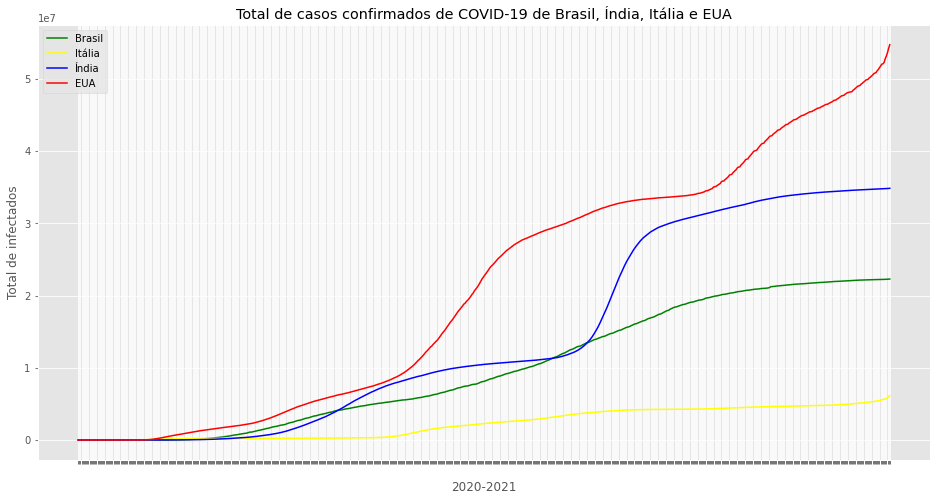

In [3]:
#Visualizando dados completos
plt.figure(figsize=(16,8))
plt.xticks(color='w')
plt.plot(s_brazil.index, s_brazil.values, label = 'Brasil', color = 'green')
plt.plot(s_us.index, s_italy.values, label = 'Itália', color = 'yellow')
plt.plot(s_india.index, s_india.values, label = 'Índia', color = 'blue')
plt.plot(s_us.index, s_us.values, label = 'EUA', color = 'red')
plt.title('Total de casos confirmados de COVID-19 de Brasil, Índia, Itália e EUA')
plt.xlabel("2020-2021")
plt.ylabel("Total de infectados")
plt.legend()
plt.show()

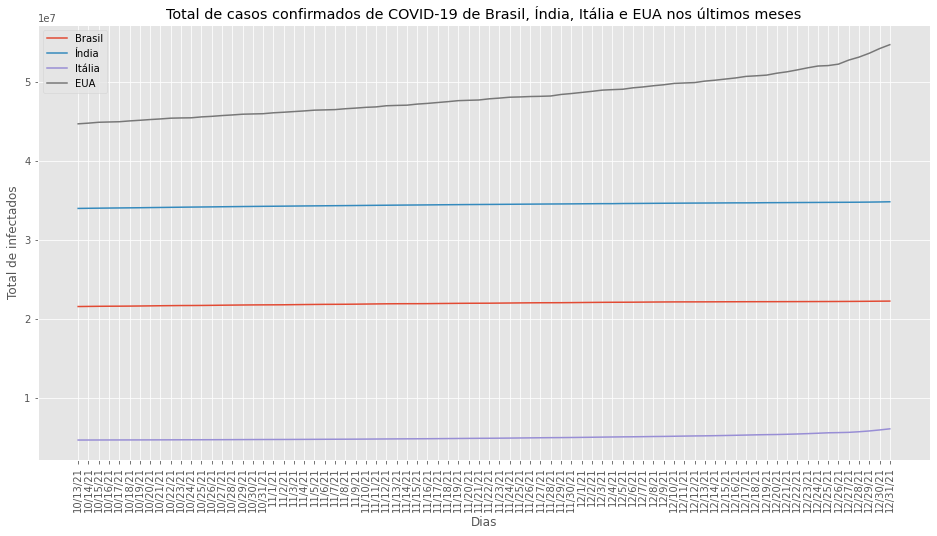

In [4]:
#Visualizando os dados em parte
tam = len(s_brazil)
plt.figure(figsize=(16,8))
plt.xticks(rotation = 90)
plt.plot(s_brazil.index[tam-80:tam], s_brazil.values[tam-80:tam], label = 'Brasil')
plt.plot(s_india.index[tam-80:tam], s_india.values[tam-80:tam], label = 'Índia')
plt.plot(s_italy.index[tam-80:tam], s_italy.values[tam-80:tam], label = 'Itália')
plt.plot(s_us.index[tam-80:tam], s_us.values[tam-80:tam], label = 'EUA')
plt.title('Total de casos confirmados de COVID-19 de Brasil, Índia, Itália e EUA nos últimos meses')
plt.xlabel("Dias")
plt.ylabel("Total de infectados")
plt.legend()
plt.show()

In [5]:
#Exportação de dados totais
#Contabilizar os dias que estão com "zero casos"
#Estudar caso de inputação baysiana
s_brazil = s_brazil[s_brazil > 0]
s_india = s_india[s_india > 0]
s_italy = s_italy[s_italy > 0]
s_us = s_us[s_us > 0]
s_brazil.to_csv('datasets/countries/casos_covid19_brazil.csv')
s_india.to_csv('datasets/countries/casos_covid19_india.csv')
s_italy.to_csv('datasets/countries/casos_covid19_italy.csv')
s_us.to_csv('datasets/countries/casos_covid19_us.csv')

# Implementação dos modelos LSTM e MLP



In [6]:
# converter uma matriz de valores em uma matriz de conjunto de dados
def create_dataset(dataset, look_back=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-look_back-1):
		a = dataset[i:(i+look_back), 0]
		dataX.append(a)
		dataY.append(dataset[i + look_back, 0])
	return numpy.array(dataX), numpy.array(dataY)

In [7]:
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países

#Grid Search
T_A = [0.01, 0.05, 0.1, 0.2] #0.01, 0.02, 0,03, 0.06, 0.1, 0.2; 
DROP = [0.01, 0.05, 0.1, 0.2]   #0.05, 0.1, 0.15, 0.2, 0.3, 0.5;
N_C = [200, 300, 400, 600]    #50, 100, 200, 300, 400, 600;
NPC = [8, 16, 32, 64] #Neurônios por camada

#Dicionários LSMT
dts = {} #Dicionário de datasets 
trpp = {} #Dicionário de treinos
tspp = {} #Dicionário de testes
trs = {} #Dicionário de scores de treinos 
tss = {} #Dicionário de scores de testes
tsm = {} #Dicionário de MAES

#Valores selecionados (Melhores valores)
strpp = {} #Dicionário de treinos
stspp = {} #Dicionário de testes
strs = {} #Dicionário de scores de treinos 
stss = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de scores de testes
stsm = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de MAE's Saída

#Dicionários MLP
dtsMLP = {} #Dicionário de datasets 
trppMLP = {} #Dicionário de treinos
tsppMLP = {} #Dicionário de testes
trsMLP = {} #Dicionário de scores de treinos 
tssMLP = {} #Dicionário de scores de testes
t_aMLP = {} #Dicionário de taxa de aprendizagem
tsmMLP = {} #Dicionário de MAES

#Valores selecionados (Melhores valores)
strppMLP = {} #Dicionário de treinos
stsppMLP = {} #Dicionário de testes
strsMLP = {} #Dicionário de scores de treinos 
stssMLP = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de scores de testes
stsmMLP = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de MAE's Saída

st_aMLP = {} #Dicionário de taxa de aprendizagem saída

#Ajustes para seleção LSTM
t_a = {} #Dicionário de taxa de aprendizagem
dropout = {} #Dicionário de dropout
n_cel = {} #Dicionário de número de células
st_a = {} #Dicionário de taxa de aprendizagem saída
sdropout = {} #Dicionário de dropout saída
sn_cel = {} #Dicionário de número de células saída

#Ajustes para seleção MLP
t_a = {} #Dicionário de taxa de aprendizagem
dropoutMLP = {} #Dicionário de dropout
n_neu = {} #Dicionário de número de neurônios
st_aMLP = {} #Dicionário de taxa de aprendizagem saída
sdropoutMLP = {} #Dicionário de dropout saída
sn_neu = {} #Dicionário de número de neurônios

#Armazenando testes para plotagem somente dos testes

testP = {}
testPMLP = {}
stestPMLP = {}
testPred = {}
testPredMLP = {}
stestPred = {}
stestPredMLP = {}

#Relizando grade de experimentos

for i in range(len(country)):
    for z in range(len(T_A)):
        for j in range(len(DROP)):
            for k in range(len(N_C)):
                if country[i] == 'Brasil':
                    dataframe = read_csv('datasets/countries/casos_covid19_brazil.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                if country[i] == 'Índia':
                    dataframe = read_csv('datasets/countries/casos_covid19_india.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                if country[i] == 'Itália':
                    dataframe = read_csv('datasets/countries/casos_covid19_italy.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                if country[i] == 'EUA':
                    dataframe = read_csv('datasets/countries/casos_covid19_us.csv', usecols=[1], engine='python')
                    dataset = dataframe.values
                    dataset = dataset.astype('float32')
                
                #LSTM
                
                # Normalizar o dataset
                scaler = MinMaxScaler(feature_range=(0, 1))
                dataset = scaler.fit_transform(dataset)
                # dividir em conjuntos de treinamento e teste
                train_size = int(len(dataset) * 0.67)
                test_size = len(dataset) - train_size
                train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
                # remodelar em X = t e Y = t + 1
                look_back = 1
                trainX, trainY = create_dataset(train, look_back)
                testX, testY = create_dataset(test, look_back)
                # remodelar a entrada para ser [amostras, intervalos de tempo, recursos]
                trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
                testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
                #Criando modelo
                model = Sequential()
                keras.backend.set_epsilon(1)
                #Adicionando camada LSTM e alguma regularização de Dropout 
                model.add(LSTM(units=int(N_C[k])))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(units=1, activation='linear'))
                #definindo hiper parâmetros
                adam = keras.optimizers.Adam(learning_rate=float(T_A[z]), beta_1=0.999, beta_2=0.999, amsgrad=False)
                model.compile(loss='mean_squared_error', optimizer='adam')
                model.fit(trainX, trainY, epochs=200, batch_size=40) #Mudar para 300 épocas - fora do grid search
                #fazer previsões
                trainPredict = model.predict(trainX)
                testPredict = model.predict(testX)
                # inverter previsões
                trainPredict = scaler.inverse_transform(trainPredict)
                trainY = scaler.inverse_transform([trainY])
                testPredict = scaler.inverse_transform(testPredict)
                testY = scaler.inverse_transform([testY])
                # calcular raiz quadrada média do erro
                trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
                print('Train Score: %.2f RMSE' % (trainScore))
                testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
                print('Test Score: %.2f RMSE' % (testScore))
                #Calcular o MAE:
                MAE = mean_absolute_error(testY[0], testPredict[:,0])
                # mudar para treinar previsões para traçar
                trainPredictPlot = numpy.empty_like(dataset)
                trainPredictPlot[:, :] = numpy.nan
                trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
                # previsões de teste de deslocamento para plotagem
                testPredictPlot = numpy.empty_like(dataset)
                testPredictPlot[:, :] = numpy.nan
                testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
                
                #MLP
                train_size = int(len(dataset) * 0.67)
                test_size = len(dataset) - train_size
                train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
                # remodelar em X = t e Y = t + 1
                look_back = 1
                trainX, trainY = create_dataset(train, look_back)
                testX, testY = create_dataset(test, look_back)
                # remodelar a entrada para ser [amostras, intervalos de tempo, recursos]
                trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
                testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
                model = Sequential()
                model.add(Dense(NPC[i], activation='sigmoid', input_dim = 1))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(NPC[i], activation='tanh'))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(NPC[i], activation='relu'))
                model.add(Dropout(float(DROP[j])))
                model.add(Dense(1))
                adam = keras.optimizers.Adam(learning_rate=float(T_A[z]))
                model.compile(optimizer=adam , loss='mean_squared_error')
                model.fit(trainX, trainY, epochs=200, batch_size = 40)
                #fazer previsões
                trainPredictMLP = model.predict(trainX)
                testPredictMLP = model.predict(testX)
                # inverter previsões
                trainPredictMLP = scaler.inverse_transform(trainPredictMLP)
                trainY = scaler.inverse_transform([trainY])
                testPredictMLP = scaler.inverse_transform(testPredictMLP)
                testY = scaler.inverse_transform([testY])
                # calcular raiz quadrada média do erro
                trainScoreMLP = math.sqrt(mean_squared_error(trainY[0], trainPredictMLP[:,0]))
                print('Train Score MLP: %.2f RMSE' % (trainScoreMLP))
                testScoreMLP = math.sqrt(mean_squared_error(testY[0], testPredictMLP[:,0]))
                print('Test Score MLP: %.2f RMSE' % (testScoreMLP))
                #Calcular o MAE:
                MAEMLP = mean_absolute_error(testY[0], testPredictMLP[:,0])
                # mudar para treinar previsões para traçar
                trainPredictPlotMLP = numpy.empty_like(dataset)
                trainPredictPlotMLP[:, :] = numpy.nan
                trainPredictPlotMLP[look_back:len(trainPredict)+look_back, :] = trainPredict
                # previsões de teste de deslocamento para plotagem
                testPredictPlotMLP = numpy.empty_like(dataset)
                testPredictPlotMLP[:, :] = numpy.nan
                testPredictPlotMLP[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


                #Armazenando as informações em dicionários LSTM
                tss[country[i]] = testScore
                tsm[country[i]] = MAE
                trpp[country[i]] = trainPredictPlot
                tspp[country[i]] = testPredictPlot
                trs[country[i]] = trainScore
                dts[country[i]] = scaler.inverse_transform(dataset)
                t_a[country[i]] = T_A[z]
                dropout[country[i]] = DROP[j]
                n_cel[country[i]] = N_C[k]
                tsm[country[i]] = MAE
                testP[country[i]] = scaler.inverse_transform(test)
                testPred[country[i]] = testPredict
                if tss[country[i]] < stss[country[i]]: #Condição de verificação dos melhores resultados
                    strpp[country[i]] = trainPredictPlot
                    stspp[country[i]] = testPredictPlot
                    strs[country[i]] = trainScore
                    stss[country[i]] = testScore
                    st_a[country[i]] = T_A[z]
                    sdropout[country[i]] = DROP[j]
                    sn_cel[country[i]] = N_C[k]
                    stsm[country[i]] = MAE
                    stestPred[country[i]] = testPredict
                #Armazenando as informações em dicionários MLP
                tssMLP[country[i]] = testScoreMLP
                trppMLP[country[i]] = trainPredictPlotMLP
                tsppMLP[country[i]] = testPredictPlotMLP
                trsMLP[country[i]] = trainScoreMLP
                t_aMLP[country[i]] = T_A[z]
                dropoutMLP[country[i]] = DROP[j]
                n_neu[country[i]] = NPC[i]
                tsmMLP[country[i]] = MAEMLP
                testPredMLP[country[i]] = testPredictMLP
                
                if tssMLP[country[i]] < stssMLP[country[i]]: #Condição de verificação dos melhores resultados
                    strppMLP[country[i]] = trainPredictPlotMLP
                    stsppMLP[country[i]] = testPredictPlotMLP
                    strsMLP[country[i]] = trainScoreMLP
                    stssMLP[country[i]] = testScoreMLP
                    st_aMLP[country[i]] = T_A[z]
                    sdropoutMLP[country[i]] = DROP[j]
                    sn_neu[country[i]] = NPC[i]
                    stsmMLP[country[i]] = MAEMLP
                    stestPredMLP[country[i]] = testPredictMLP

Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0884
Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0538
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0321
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0237
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0214
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0179
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0146
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0115
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0085
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0058
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0037
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0020
Epoch 13/200
12/12 [=================

12/12 [==============================] - 0s 2ms/step - loss: 1.3769e-05
Epoch 99/200
12/12 [==============================] - 0s 1ms/step - loss: 1.6165e-05
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6349e-05
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6203e-05
Epoch 102/200
12/12 [==============================] - 0s 1ms/step - loss: 1.4123e-05
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7466e-05
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 1.2862e-05
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5332e-05
Epoch 106/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5028e-05
Epoch 107/200
12/12 [==============================] - 0s 1ms/step - loss: 1.4607e-05
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2431e-05
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - 

12/12 [==============================] - 0s 500us/step - loss: 6.6536e-04
Epoch 91/200
12/12 [==============================] - 0s 417us/step - loss: 7.2054e-04
Epoch 92/200
12/12 [==============================] - 0s 500us/step - loss: 8.9277e-04
Epoch 93/200
12/12 [==============================] - 0s 500us/step - loss: 6.7905e-04
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 9.6745e-04
Epoch 95/200
12/12 [==============================] - 0s 500us/step - loss: 9.8435e-04
Epoch 96/200
12/12 [==============================] - 0s 417us/step - loss: 8.1943e-04
Epoch 97/200
12/12 [==============================] - 0s 417us/step - loss: 9.1264e-04
Epoch 98/200
12/12 [==============================] - 0s 417us/step - loss: 0.0011
Epoch 99/200
12/12 [==============================] - 0s 417us/step - loss: 0.0014
Epoch 100/200
12/12 [==============================] - 0s 417us/step - loss: 0.0011
Epoch 101/200
12/12 [==============================] - 0s 417us/ste

12/12 [==============================] - 0s 417us/step - loss: 8.6675e-04
Epoch 185/200
12/12 [==============================] - 0s 417us/step - loss: 5.2778e-04
Epoch 186/200
12/12 [==============================] - 0s 417us/step - loss: 6.7718e-04
Epoch 187/200
12/12 [==============================] - 0s 500us/step - loss: 5.1445e-04
Epoch 188/200
12/12 [==============================] - 0s 500us/step - loss: 7.3619e-04
Epoch 189/200
12/12 [==============================] - 0s 417us/step - loss: 3.7385e-04
Epoch 190/200
12/12 [==============================] - 0s 417us/step - loss: 4.0025e-04
Epoch 191/200
12/12 [==============================] - 0s 500us/step - loss: 6.9492e-04
Epoch 192/200
12/12 [==============================] - 0s 417us/step - loss: 5.6378e-04
Epoch 193/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 194/200
12/12 [==============================] - 0s 417us/step - loss: 6.8821e-04
Epoch 195/200
12/12 [=============================

12/12 [==============================] - 0s 3ms/step - loss: 7.4015e-06
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5503e-06
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2747e-06
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0778e-06
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9254e-06
Epoch 179/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7585e-06
Epoch 180/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1434e-06
Epoch 181/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4061e-06
Epoch 182/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1984e-06
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3180e-06
Epoch 184/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8487e-06
Epoch 185/200
12/12 [==============================] - 0s 3ms/step -

Epoch 165/200
12/12 [==============================] - 0s 417us/step - loss: 5.9646e-04
Epoch 166/200
12/12 [==============================] - 0s 417us/step - loss: 6.6764e-04
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 5.1203e-04
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 8.5428e-04
Epoch 169/200
12/12 [==============================] - 0s 417us/step - loss: 5.9951e-04
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 6.6314e-04
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 9.9164e-04
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 8.6166e-04
Epoch 173/200
12/12 [==============================] - 0s 417us/step - loss: 4.7285e-04
Epoch 174/200
12/12 [==============================] - 0s 417us/step - loss: 7.3359e-04
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 7.7301e-04
Epoch 176/200
12/12 [===========

12/12 [==============================] - 0s 5ms/step - loss: 4.8956e-06
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7914e-06A: 0s - loss: 5.8541e-0
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3648e-06
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1320e-06
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1257e-06
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1567e-06
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4332e-06
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4646e-06
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1651e-06
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7087e-06
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5426e-06
Epoch 165/200
12/12 [========================

12/12 [==============================] - 0s 417us/step - loss: 7.4843e-04
Epoch 145/200
12/12 [==============================] - 0s 501us/step - loss: 0.0013
Epoch 146/200
12/12 [==============================] - 0s 417us/step - loss: 7.9352e-04
Epoch 147/200
12/12 [==============================] - 0s 417us/step - loss: 9.6121e-04
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 8.7998e-04
Epoch 150/200
12/12 [==============================] - 0s 417us/step - loss: 0.0022
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 5.6735e-04
Epoch 154/200
12/12 [==============================] - 0s 417us/step - loss: 0.0023
Epoch 155/200
12/12 [==============================] - 0s 501us/step -

12/12 [==============================] - 0s 9ms/step - loss: 4.6621e-06
Epoch 136/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6321e-06
Epoch 137/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1824e-06
Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3544e-06
Epoch 139/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3524e-06
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9148e-06
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0445e-06
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0543e-06
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8960e-06
Epoch 144/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7780e-06
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4553e-06
Epoch 146/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 500us/step - loss: 8.2502e-04
Epoch 127/200
12/12 [==============================] - 0s 501us/step - loss: 9.1818e-04
Epoch 128/200
12/12 [==============================] - 0s 417us/step - loss: 0.0014
Epoch 129/200
12/12 [==============================] - 0s 417us/step - loss: 0.0012
Epoch 130/200
12/12 [==============================] - 0s 501us/step - loss: 8.6753e-04
Epoch 131/200
12/12 [==============================] - 0s 500us/step - loss: 8.3158e-04
Epoch 132/200
12/12 [==============================] - 0s 417us/step - loss: 9.7023e-04
Epoch 133/200
12/12 [==============================] - 0s 501us/step - loss: 8.6317e-04
Epoch 134/200
12/12 [==============================] - 0s 500us/step - loss: 6.8393e-04
Epoch 135/200
12/12 [==============================] - 0s 500us/step - loss: 8.7935e-04
Epoch 136/200
12/12 [==============================] - 0s 417us/step - loss: 6.1752e-04
Epoch 137/200
12/12 [==============================] -

12/12 [==============================] - 0s 2ms/step - loss: 4.0764e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6574e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5588e-05
Epoch 119/200
12/12 [==============================] - 0s 1ms/step - loss: 4.0197e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2889e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9325e-05
Epoch 122/200
12/12 [==============================] - 0s 1ms/step - loss: 4.4184e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5341e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5683e-05
Epoch 125/200
12/12 [==============================] - 0s 1ms/step - loss: 4.1805e-05
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0394e-05
Epoch 127/200
12/12 [==============================] - 0s 1ms/step -

12/12 [==============================] - 0s 501us/step - loss: 0.0026
Epoch 110/200
12/12 [==============================] - 0s 501us/step - loss: 0.0022
Epoch 111/200
12/12 [==============================] - 0s 501us/step - loss: 0.0022
Epoch 112/200
12/12 [==============================] - 0s 500us/step - loss: 0.0024
Epoch 113/200
12/12 [==============================] - 0s 500us/step - loss: 0.0024
Epoch 114/200
12/12 [==============================] - 0s 417us/step - loss: 0.0025
Epoch 115/200
12/12 [==============================] - 0s 417us/step - loss: 0.0022
Epoch 116/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 117/200
12/12 [==============================] - 0s 417us/step - loss: 0.0021
Epoch 118/200
12/12 [==============================] - 0s 417us/step - loss: 0.0021
Epoch 119/200
12/12 [==============================] - 0s 417us/step - loss: 0.0016
Epoch 120/200
12/12 [==============================] - 0s 417us/step - loss: 0.0025
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 3.0991e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1627e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1018e-05
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8175e-05
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4303e-05
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4549e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8155e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0608e-05
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8169e-05
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1661e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5759e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 96/200
12/12 [==============================] - 0s 417us/step - loss: 0.0018
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0027
Epoch 98/200
12/12 [==============================] - 0s 417us/step - loss: 0.0021
Epoch 99/200
12/12 [==============================] - 0s 417us/step - loss: 0.0015
Epoch 100/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 101/200
12/12 [==============================] - 0s 417us/step - loss: 0.0019
Epoch 102/200
12/12 [==============================] - 0s 501us/step - loss: 0.0018
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 104/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 105/200
12/12 [==============================] - 0s 417us/step - loss: 0.0014
Epoch 106/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 107/

12/12 [==============================] - 0s 5ms/step - loss: 2.6726e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6425e-05
Epoch 90/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8410e-05
Epoch 91/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5110e-05
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3918e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5763e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5083e-05
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6751e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8498e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9867e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7610e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 2.95

12/12 [==============================] - 0s 500us/step - loss: 0.0027
Epoch 81/200
12/12 [==============================] - 0s 417us/step - loss: 0.0038
Epoch 82/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 83/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 84/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 85/200
12/12 [==============================] - 0s 417us/step - loss: 0.0027
Epoch 86/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 87/200
12/12 [==============================] - 0s 500us/step - loss: 0.0024
Epoch 88/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 89/200
12/12 [==============================] - 0s 417us/step - loss: 0.0032
Epoch 90/200
12/12 [==============================] - 0s 417us/step - loss: 0.0024
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0028
Epoch 92/200
12/1

Epoch 178/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0019
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 182/200
12/12 [==============================] - 0s 417us/step - loss: 0.0027
Epoch 183/200
12/12 [==============================] - 0s 500us/step - loss: 0.0023
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0028
Epoch 185/200
12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 187/200
12/12 [==============================] - 0s 417us/step - loss: 0.0013
Epoch 188/200
12/12 [==============================] - 0s 417us/step - loss: 0.0019
Epoch 189/200
12/12 [==============================] - 0s 417us/step - loss:

12/12 [==============================] - 0s 9ms/step - loss: 1.3921e-05
Epoch 170/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6204e-05
Epoch 171/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7882e-05
Epoch 172/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8685e-05
Epoch 173/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5281e-05
Epoch 174/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4901e-05
Epoch 175/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3357e-05
Epoch 176/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4707e-05
Epoch 177/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3641e-05
Epoch 178/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6272e-05
Epoch 179/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4626e-05
Epoch 180/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 165/200
12/12 [==============================] - 0s 417us/step - loss: 0.0021
Epoch 166/200
12/12 [==============================] - 0s 417us/step - loss: 0.0016
Epoch 167/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0019
Epoch 171/200
12/12 [==============================] - 0s 417us/step - loss: 0.0022
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 173/200
12/12 [==============================] - 0s 501us/step - loss: 0.0019
Epoch 174/200
12/12 [==============================] - 0s 417us/step - loss: 0.0021
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 

Epoch 61/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0846e-04
Epoch 62/200
12/12 [==============================] - 0s 2ms/step - loss: 9.7722e-05
Epoch 63/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1466e-04
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 8.9130e-05
Epoch 65/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1616e-04
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7283e-05
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0666e-04
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0860e-04
Epoch 69/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1376e-04
Epoch 70/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0505e-04
Epoch 71/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1349e-04
Epoch 72/200
12/12 [==============================] - 0s 2ms/step

12/12 [==============================] - 0s 500us/step - loss: 0.0054
Epoch 53/200
12/12 [==============================] - 0s 417us/step - loss: 0.0063
Epoch 54/200
12/12 [==============================] - 0s 417us/step - loss: 0.0061
Epoch 55/200
12/12 [==============================] - 0s 500us/step - loss: 0.0057
Epoch 56/200
12/12 [==============================] - 0s 417us/step - loss: 0.0049
Epoch 57/200
12/12 [==============================] - 0s 501us/step - loss: 0.0058
Epoch 58/200
12/12 [==============================] - 0s 417us/step - loss: 0.0049
Epoch 59/200
12/12 [==============================] - 0s 417us/step - loss: 0.0054
Epoch 60/200
12/12 [==============================] - 0s 500us/step - loss: 0.0071
Epoch 61/200
12/12 [==============================] - 0s 500us/step - loss: 0.0056
Epoch 62/200
12/12 [==============================] - 0s 417us/step - loss: 0.0074
Epoch 63/200
12/12 [==============================] - 0s 500us/step - loss: 0.0087
Epoch 64/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 7.3168e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9554e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0738e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6573e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3187e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7912e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5733e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 8.8157e-05
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2579e-05
Epoch 55/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8477e-05
Epoch 56/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3940e-05
Epoch 57/200
12/12 [==============================] - 0s 3ms/step - loss: 5.97

12/12 [==============================] - 0s 500us/step - loss: 0.0099
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0103
Epoch 39/200
12/12 [==============================] - 0s 417us/step - loss: 0.0107
Epoch 40/200
12/12 [==============================] - 0s 417us/step - loss: 0.0094
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0103
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0099
Epoch 43/200
12/12 [==============================] - 0s 501us/step - loss: 0.0111
Epoch 44/200
12/12 [==============================] - 0s 417us/step - loss: 0.0095
Epoch 45/200
12/12 [==============================] - 0s 417us/step - loss: 0.0101
Epoch 46/200
12/12 [==============================] - 0s 500us/step - loss: 0.0102
Epoch 47/200
12/12 [==============================] - 0s 500us/step - loss: 0.0104
Epoch 48/200
12/12 [==============================] - 0s 500us/step - loss: 0.0106
Epoch 49/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 5.6255e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3381e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7949e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9034e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7942e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4898e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5320e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8323e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2316e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4199e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6991e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 7.03

12/12 [==============================] - 0s 417us/step - loss: 0.0113
Epoch 24/200
12/12 [==============================] - 0s 417us/step - loss: 0.0103
Epoch 25/200
12/12 [==============================] - 0s 417us/step - loss: 0.0102
Epoch 26/200
12/12 [==============================] - 0s 500us/step - loss: 0.0113
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0100
Epoch 28/200
12/12 [==============================] - 0s 500us/step - loss: 0.0103
Epoch 29/200
12/12 [==============================] - 0s 417us/step - loss: 0.0084
Epoch 30/200
12/12 [==============================] - 0s 417us/step - loss: 0.0107
Epoch 31/200
12/12 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 32/200
12/12 [==============================] - 0s 500us/step - loss: 0.0082
Epoch 33/200
12/12 [==============================] - 0s 500us/step - loss: 0.0074
Epoch 34/200
12/12 [==============================] - 0s 417us/step - loss: 0.0082
Epoch 35/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 4.2327e-05
Epoch 19/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5365e-05
Epoch 20/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7965e-05
Epoch 21/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6714e-05
Epoch 22/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4441e-05
Epoch 23/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0851e-05
Epoch 24/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4510e-05
Epoch 25/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0785e-05
Epoch 26/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4861e-05
Epoch 27/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9192e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5431e-05
Epoch 29/200
12/12 [==============================] - 0s 9ms/step - loss: 4.16

Epoch 9/200
12/12 [==============================] - 0s 501us/step - loss: 0.0307
Epoch 10/200
12/12 [==============================] - 0s 500us/step - loss: 0.0276
Epoch 11/200
12/12 [==============================] - 0s 500us/step - loss: 0.0196
Epoch 12/200
12/12 [==============================] - 0s 417us/step - loss: 0.0242
Epoch 13/200
12/12 [==============================] - 0s 417us/step - loss: 0.0209
Epoch 14/200
12/12 [==============================] - 0s 500us/step - loss: 0.0164
Epoch 15/200
12/12 [==============================] - 0s 584us/step - loss: 0.0148
Epoch 16/200
12/12 [==============================] - 0s 417us/step - loss: 0.0166
Epoch 17/200
12/12 [==============================] - 0s 417us/step - loss: 0.0133
Epoch 18/200
12/12 [==============================] - 0s 500us/step - loss: 0.0129
Epoch 19/200
12/12 [==============================] - 0s 501us/step - loss: 0.0133
Epoch 20/200
12/12 [==============================] - 0s 417us/step - loss: 0.0128
Epoch

12/12 [==============================] - 0s 2ms/step - loss: 0.0257
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0225
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0191
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0159
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0127
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0093
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0067
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0047
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0027
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0015
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6077e-04
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2423e-04
Epoch 16/200
12/12 [==================

12/12 [==============================] - 0s 2ms/step - loss: 1.8765e-04
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6783e-04
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9569e-04
Epoch 104/200
12/12 [==============================] - 0s 1ms/step - loss: 1.5079e-04
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9817e-04
Epoch 106/200
12/12 [==============================] - 0s 1ms/step - loss: 1.6472e-04
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7044e-04
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3929e-04
Epoch 109/200
12/12 [==============================] - 0s 1ms/step - loss: 1.6787e-04
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5123e-04
Epoch 111/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6333e-04
Epoch 112/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 2ms/step - loss: 1.5945e-04
Epoch 197/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2020e-04
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4505e-04
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3409e-04
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5002e-04
Train Score: 64724.77 RMSE
Test Score: 58681.26 RMSE
Epoch 1/200
12/12 [==============================] - 0s 500us/step - loss: 0.1735
Epoch 2/200
12/12 [==============================] - 0s 501us/step - loss: 0.0705
Epoch 3/200
12/12 [==============================] - 0s 500us/step - loss: 0.0546
Epoch 4/200
12/12 [==============================] - 0s 501us/step - loss: 0.0517
Epoch 5/200
12/12 [==============================] - 0s 417us/step - loss: 0.0482
Epoch 6/200
12/12 [==============================] - 0s 500us/step - loss: 0.0492
Epoch 7/200
12/12 [====================

12/12 [==============================] - 0s 500us/step - loss: 0.0075
Epoch 192/200
12/12 [==============================] - 0s 500us/step - loss: 0.0078
Epoch 193/200
12/12 [==============================] - 0s 500us/step - loss: 0.0072
Epoch 194/200
12/12 [==============================] - 0s 501us/step - loss: 0.0074
Epoch 195/200
12/12 [==============================] - 0s 417us/step - loss: 0.0066
Epoch 196/200
12/12 [==============================] - 0s 500us/step - loss: 0.0065
Epoch 197/200
12/12 [==============================] - 0s 501us/step - loss: 0.0071
Epoch 198/200
12/12 [==============================] - 0s 751us/step - loss: 0.0073
Epoch 199/200
12/12 [==============================] - 0s 500us/step - loss: 0.0059
Epoch 200/200
12/12 [==============================] - 0s 500us/step - loss: 0.0068
Train Score MLP: 2547546.07 RMSE
Test Score MLP: 5593110.96 RMSE
Epoch 1/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0806
Epoch 2/200
12/12 [==========

12/12 [==============================] - 0s 3ms/step - loss: 9.2604e-05
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0142e-04
Epoch 184/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5440e-05
Epoch 185/200
12/12 [==============================] - 0s 3ms/step - loss: 9.8777e-05
Epoch 186/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1047e-05
Epoch 187/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6508e-05
Epoch 188/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0702e-04
Epoch 189/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1372e-04
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2663e-04
Epoch 191/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6153e-05
Epoch 192/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1221e-04
Epoch 193/200
12/12 [==============================] - 0s 3ms/step -

Epoch 177/200
12/12 [==============================] - 0s 500us/step - loss: 0.0090
Epoch 178/200
12/12 [==============================] - 0s 417us/step - loss: 0.0085
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0077
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0087
Epoch 181/200
12/12 [==============================] - 0s 417us/step - loss: 0.0085
Epoch 182/200
12/12 [==============================] - 0s 500us/step - loss: 0.0080
Epoch 183/200
12/12 [==============================] - 0s 500us/step - loss: 0.0094
Epoch 184/200
12/12 [==============================] - 0s 417us/step - loss: 0.0087
Epoch 185/200
12/12 [==============================] - 0s 417us/step - loss: 0.0081
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss: 0.0077
Epoch 187/200
12/12 [==============================] - 0s 500us/step - loss: 0.0078
Epoch 188/200
12/12 [==============================] - 0s 500us/step - loss:

12/12 [==============================] - 0s 5ms/step - loss: 6.5029e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1719e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6743e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2663e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2936e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3157e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1853e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0701e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 9.9450e-05
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 9.5639e-05
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8532e-05
Epoch 179/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0103
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 0.0080
Epoch 67/200
12/12 [==============================] - 0s 500us/step - loss: 0.0080
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 0.0086
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 0.0090
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0090
Epoch 71/200
12/12 [==============================] - 0s 417us/step - loss: 0.0081
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0089
Epoch 73/200
12/12 [==============================] - 0s 500us/step - loss: 0.0086
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0081
Epoch 75/200
12/12 [==============================] - 0s 417us/step - loss: 0.0087
Epoch 76/200
12/12 [==============================] - 0s 417us/step - loss: 0.0093
Epoch 77/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0074
Epoch 164/200
12/12 [==============================] - 0s 500us/step - loss: 0.0065
Epoch 165/200
12/12 [==============================] - 0s 417us/step - loss: 0.0058
Epoch 166/200
12/12 [==============================] - 0s 500us/step - loss: 0.0071
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0071
Epoch 168/200
12/12 [==============================] - 0s 417us/step - loss: 0.0065
Epoch 169/200
12/12 [==============================] - 0s 501us/step - loss: 0.0071
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0069
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0074
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0069
Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 0.0070
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 0.0079
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 6.7348e-05
Epoch 155/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2955e-05
Epoch 156/200
12/12 [==============================] - 0s 10ms/step - loss: 5.4727e-05
Epoch 157/200
12/12 [==============================] - 0s 9ms/step - loss: 5.3464e-05
Epoch 158/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2769e-05
Epoch 159/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5779e-05
Epoch 160/200
12/12 [==============================] - 0s 9ms/step - loss: 5.6389e-05
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 6.0676e-05
Epoch 162/200
12/12 [==============================] - 0s 9ms/step - loss: 5.1784e-05
Epoch 163/200
12/12 [==============================] - 0s 9ms/step - loss: 6.9593e-05
Epoch 164/200
12/12 [==============================] - 0s 9ms/step - loss: 5.6340e-05
Epoch 165/200
12/12 [==============================] - 0s 9ms/step 

12/12 [==============================] - 0s 500us/step - loss: 0.0193
Epoch 149/200
12/12 [==============================] - 0s 417us/step - loss: 0.0217
Epoch 150/200
12/12 [==============================] - 0s 500us/step - loss: 0.0195
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0211
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0173
Epoch 153/200
12/12 [==============================] - 0s 501us/step - loss: 0.0169
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0196
Epoch 155/200
12/12 [==============================] - 0s 417us/step - loss: 0.0215
Epoch 156/200
12/12 [==============================] - 0s 501us/step - loss: 0.0192
Epoch 157/200
12/12 [==============================] - 0s 500us/step - loss: 0.0192
Epoch 158/200
12/12 [==============================] - 0s 417us/step - loss: 0.0208
Epoch 159/200
12/12 [==============================] - 0s 500us/step - loss: 0.0192
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 2.5791e-05
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5637e-05
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7109e-05
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5085e-05
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6937e-05
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5100e-05
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7231e-05
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4505e-05
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3758e-05
Epoch 54/200
12/12 [==============================] - 0s 1ms/step - loss: 2.4349e-05
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4672e-05
Epoch 56/200
12/12 [==============================] - 0s 2ms/step - loss: 2.44

12/12 [==============================] - 0s 2ms/step - loss: 1.0069e-05
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1975e-05
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 9.9788e-06
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6820e-06
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1049e-05
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1662e-05
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1722e-05
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 9.9323e-06
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0662e-05
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0864e-05
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4170e-05
Epoch 152/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 133/200
12/12 [==============================] - 0s 500us/step - loss: 0.0456
Epoch 134/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 135/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 136/200
12/12 [==============================] - 0s 417us/step - loss: 0.0478
Epoch 137/200
12/12 [==============================] - 0s 500us/step - loss: 0.0469
Epoch 138/200
12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 139/200
12/12 [==============================] - 0s 417us/step - loss: 0.0463
Epoch 140/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 141/200
12/12 [==============================] - 0s 500us/step - loss: 0.0486
Epoch 142/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 143/200
12/12 [==============================] - 0s 417us/step - loss: 0.0467
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 6.8590e-06
Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5971e-06
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5996e-06
Epoch 127/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3938e-06
Epoch 128/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1286e-06
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3560e-06
Epoch 130/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3464e-06
Epoch 131/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2314e-06
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0548e-06
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0007e-06
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2033e-06
Epoch 135/200
12/12 [==============================] - 0s 3ms/step -

Epoch 116/200
12/12 [==============================] - 0s 417us/step - loss: 0.0011
Epoch 117/200
12/12 [==============================] - 0s 417us/step - loss: 0.0012
Epoch 118/200
12/12 [==============================] - 0s 500us/step - loss: 5.5806e-04
Epoch 119/200
12/12 [==============================] - 0s 417us/step - loss: 6.8707e-04
Epoch 120/200
12/12 [==============================] - 0s 500us/step - loss: 5.2345e-04
Epoch 121/200
12/12 [==============================] - 0s 500us/step - loss: 7.9299e-04
Epoch 122/200
12/12 [==============================] - 0s 501us/step - loss: 0.0011
Epoch 123/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 124/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 125/200
12/12 [==============================] - 0s 501us/step - loss: 0.0010
Epoch 126/200
12/12 [==============================] - 0s 417us/step - loss: 6.8101e-04
Epoch 127/200
12/12 [==============================] - 0

12/12 [==============================] - 0s 5ms/step - loss: 6.1890e-06
Epoch 106/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8617e-06
Epoch 107/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8613e-06
Epoch 108/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8056e-06
Epoch 109/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4353e-06
Epoch 110/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8938e-06
Epoch 111/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7451e-06
Epoch 112/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6829e-06
Epoch 113/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0150e-06
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6911e-06
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 8.7802e-06
Epoch 116/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0016
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 6.7765e-04
Epoch 100/200
12/12 [==============================] - 0s 417us/step - loss: 0.0010
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0023
Epoch 102/200
12/12 [==============================] - 0s 500us/step - loss: 7.0107e-04
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 104/200
12/12 [==============================] - 0s 417us/step - loss: 5.7334e-04
Epoch 105/200
12/12 [==============================] - 0s 501us/step - loss: 0.0014
Epoch 106/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 107/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 108/200
12/12 [==============================] - 0s 500us/step - loss: 6.3

12/12 [==============================] - 0s 9ms/step - loss: 5.7039e-06
Epoch 89/200
12/12 [==============================] - 0s 9ms/step - loss: 5.1341e-06
Epoch 90/200
12/12 [==============================] - 0s 9ms/step - loss: 5.5920e-06
Epoch 91/200
12/12 [==============================] - 0s 9ms/step - loss: 5.8280e-06
Epoch 92/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7817e-06
Epoch 93/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9846e-06
Epoch 94/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4711e-06
Epoch 95/200
12/12 [==============================] - 0s 9ms/step - loss: 5.9500e-06
Epoch 96/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9349e-06
Epoch 97/200
12/12 [==============================] - 0s 9ms/step - loss: 5.6735e-06
Epoch 98/200
12/12 [==============================] - 0s 9ms/step - loss: 6.3611e-06
Epoch 99/200
12/12 [==============================] - 0s 9ms/step - loss: 6.12

12/12 [==============================] - 0s 501us/step - loss: 0.0013
Epoch 81/200
12/12 [==============================] - 0s 417us/step - loss: 0.0014
Epoch 82/200
12/12 [==============================] - 0s 501us/step - loss: 7.9646e-04
Epoch 83/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 84/200
12/12 [==============================] - 0s 417us/step - loss: 0.0013
Epoch 85/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 86/200
12/12 [==============================] - 0s 500us/step - loss: 9.5551e-04
Epoch 87/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 88/200
12/12 [==============================] - 0s 501us/step - loss: 5.5326e-04
Epoch 89/200
12/12 [==============================] - 0s 417us/step - loss: 8.3909e-04
Epoch 90/200
12/12 [==============================] - 0s 501us/step - loss: 7.1780e-04
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 8.97

12/12 [==============================] - 0s 2ms/step - loss: 5.6931e-05
Epoch 70/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9262e-05
Epoch 71/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3969e-05
Epoch 72/200
12/12 [==============================] - 0s 2ms/step - loss: 6.0699e-05
Epoch 73/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4720e-05
Epoch 74/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6002e-05
Epoch 75/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0639e-05
Epoch 76/200
12/12 [==============================] - 0s 1ms/step - loss: 5.2358e-05
Epoch 77/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5341e-05
Epoch 78/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2050e-05
Epoch 79/200
12/12 [==============================] - 0s 1ms/step - loss: 6.0862e-05
Epoch 80/200
12/12 [==============================] - 0s 2ms/step - loss: 5.13

12/12 [==============================] - 0s 501us/step - loss: 0.0022
Epoch 62/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 63/200
12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 0.0024
Epoch 65/200
12/12 [==============================] - 0s 501us/step - loss: 0.0021
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 67/200
12/12 [==============================] - 0s 501us/step - loss: 0.0021
Epoch 68/200
12/12 [==============================] - 0s 417us/step - loss: 0.0024
Epoch 69/200
12/12 [==============================] - 0s 417us/step - loss: 0.0029
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 71/200
12/12 [==============================] - 0s 501us/step - loss: 0.0024
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 73/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 160/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 161/200
12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 162/200
12/12 [==============================] - 0s 417us/step - loss: 0.0022
Epoch 163/200
12/12 [==============================] - 0s 417us/step - loss: 0.0019
Epoch 164/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 166/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0023
Epoch 168/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 2.7240e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2845e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7923e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2439e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1835e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0434e-05
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5329e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3204e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8597e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8349e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9124e-05
Epoch 161/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0024
Epoch 145/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 146/200
12/12 [==============================] - 0s 417us/step - loss: 0.0022
Epoch 147/200
12/12 [==============================] - 0s 417us/step - loss: 0.0023
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 149/200
12/12 [==============================] - 0s 417us/step - loss: 0.0026
Epoch 150/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 151/200
12/12 [==============================] - 0s 417us/step - loss: 0.0040
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0057
Epoch 153/200
12/12 [==============================] - 0s 501us/step - loss: 0.0027
Epoch 154/200
12/12 [==============================] - 0s 417us/step - loss: 0.0032
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 3.4094e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6140e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2079e-05
Epoch 44/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1776e-05
Epoch 45/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3077e-05
Epoch 46/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0650e-05
Epoch 47/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5725e-05
Epoch 48/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4052e-05
Epoch 49/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7580e-05
Epoch 50/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1518e-05
Epoch 51/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3343e-05
Epoch 52/200
12/12 [==============================] - 0s 5ms/step - loss: 3.11

12/12 [==============================] - 0s 5ms/step - loss: 2.5428e-05
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2523e-05
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0447e-05
Epoch 140/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9804e-05
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6623e-05
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2240e-05
Epoch 143/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2561e-05
Epoch 144/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8738e-05
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8602e-05
Epoch 146/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6230e-05
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4437e-05
Epoch 148/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0025
Epoch 131/200
12/12 [==============================] - 0s 501us/step - loss: 0.0017
Epoch 132/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 133/200
12/12 [==============================] - 0s 417us/step - loss: 0.0018
Epoch 134/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 135/200
12/12 [==============================] - 0s 417us/step - loss: 0.0026
Epoch 136/200
12/12 [==============================] - 0s 417us/step - loss: 0.0018
Epoch 137/200
12/12 [==============================] - 0s 417us/step - loss: 0.0022
Epoch 138/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 139/200
12/12 [==============================] - 0s 500us/step - loss: 0.0024
Epoch 140/200
12/12 [==============================] - 0s 500us/step - loss: 0.0027
Epoch 141/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 2.8324e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6324e-05
Epoch 29/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4084e-05
Epoch 30/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5075e-05A: 0s - loss: 2.3726e-
Epoch 31/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5924e-05
Epoch 32/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4443e-05
Epoch 33/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6881e-05
Epoch 34/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2088e-05
Epoch 35/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7580e-05
Epoch 36/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3715e-05
Epoch 37/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8842e-05
Epoch 38/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 500us/step - loss: 0.0049
Epoch 18/200
12/12 [==============================] - 0s 500us/step - loss: 0.0065
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0052
Epoch 20/200
12/12 [==============================] - 0s 417us/step - loss: 0.0053
Epoch 21/200
12/12 [==============================] - 0s 417us/step - loss: 0.0063
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0060
Epoch 23/200
12/12 [==============================] - 0s 417us/step - loss: 0.0040
Epoch 24/200
12/12 [==============================] - 0s 417us/step - loss: 0.0046
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 26/200
12/12 [==============================] - 0s 501us/step - loss: 0.0040
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 28/200
12/12 [==============================] - 0s 417us/step - loss: 0.0034
Epoch 29/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 0.0022
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0012
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0883e-04
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9372e-04
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7026e-04
Epoch 17/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2056e-04
Epoch 18/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3380e-04
Epoch 19/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2120e-04
Epoch 20/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3661e-04
Epoch 21/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1883e-04
Epoch 22/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1482e-04
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3258e-04
E

12/12 [==============================] - 0s 501us/step - loss: 0.0457
Epoch 3/200
12/12 [==============================] - 0s 500us/step - loss: 0.0449
Epoch 4/200
12/12 [==============================] - 0s 500us/step - loss: 0.0437
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0394
Epoch 6/200
12/12 [==============================] - 0s 500us/step - loss: 0.0349
Epoch 7/200
12/12 [==============================] - 0s 500us/step - loss: 0.0259
Epoch 8/200
12/12 [==============================] - 0s 500us/step - loss: 0.0228
Epoch 9/200
12/12 [==============================] - 0s 500us/step - loss: 0.0193
Epoch 10/200
12/12 [==============================] - 0s 417us/step - loss: 0.0174
Epoch 11/200
12/12 [==============================] - 0s 501us/step - loss: 0.0151
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0147
Epoch 13/200
12/12 [==============================] - 0s 501us/step - loss: 0.0154
Epoch 14/200
12/12 [====

Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 102/200
12/12 [==============================] - 0s 500us/step - loss: 0.0056
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 0.0045
Epoch 104/200
12/12 [==============================] - 0s 417us/step - loss: 0.0042
Epoch 105/200
12/12 [==============================] - 0s 417us/step - loss: 0.0041
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 107/200
12/12 [==============================] - 0s 500us/step - loss: 0.0056
Epoch 108/200
12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 109/200
12/12 [==============================] - 0s 500us/step - loss: 0.0046
Epoch 110/200
12/12 [==============================] - 0s 500us/step - loss: 0.0046
Epoch 111/200
12/12 [==============================] - 0s 500us/step - loss: 0.0048
Epoch 112/200
12/12 [==============================] - 0s 500us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 6.5813e-05
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1957e-05
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4703e-05
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9810e-05
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8334e-05
Epoch 99/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3810e-05
Epoch 100/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7026e-05
Epoch 101/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4571e-05
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5589e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8789e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2704e-05
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss

12/12 [==============================] - 0s 3ms/step - loss: 4.9850e-05
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3520e-05
Epoch 191/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9629e-05
Epoch 192/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7730e-05
Epoch 193/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1575e-05
Epoch 194/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7144e-05
Epoch 195/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2404e-05
Epoch 196/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3466e-05
Epoch 197/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9857e-05
Epoch 198/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3260e-05
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8210e-05
Epoch 200/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0459
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0454
Epoch 185/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss: 0.0456
Epoch 187/200
12/12 [==============================] - 0s 501us/step - loss: 0.0456
Epoch 188/200
12/12 [==============================] - 0s 501us/step - loss: 0.0458
Epoch 189/200
12/12 [==============================] - 0s 500us/step - loss: 0.0456
Epoch 190/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 191/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 192/200
12/12 [==============================] - 0s 501us/step - loss: 0.0462
Epoch 193/200
12/12 [==============================] - 0s 500us/step - loss: 0.0453
Epoch 194/200
12/12 [==============================] - 0s 417us/step - loss: 0.0455
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 4.5439e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8380e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6340e-05
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3729e-05
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3011e-05
Epoch 179/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7005e-05
Epoch 180/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0870e-05
Epoch 181/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6654e-05
Epoch 182/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5778e-05
Epoch 183/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7434e-05
Epoch 184/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5044e-05
Epoch 185/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0048
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0048
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0046
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0043
Epoch 173/200
12/12 [==============================] - 0s 417us/step - loss: 0.0056
Epoch 174/200
12/12 [==============================] - 0s 417us/step - loss: 0.0049
Epoch 175/200
12/12 [==============================] - 0s 417us/step - loss: 0.0056
Epoch 176/200
12/12 [==============================] - 0s 500us/step - loss: 0.0048
Epoch 177/200
12/12 [==============================] - 0s 500us/step - loss: 0.0056
Epoch 178/200
12/12 [==============================] - 0s 417us/step - loss: 0.0047
Epoch 179/200
12/12 [==============================] - 0s 417us/step - loss: 0.0043
Epoch 180/200
12/12 [==============================] - 0s 417us/step - loss: 0.0046
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 3.4473e-05
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8895e-05
Epoch 162/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3202e-05
Epoch 163/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2609e-05
Epoch 164/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1828e-05
Epoch 165/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7102e-05
Epoch 166/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3592e-05
Epoch 167/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9218e-05
Epoch 168/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8415e-05
Epoch 169/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3123e-05
Epoch 170/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0545e-05
Epoch 171/200
12/12 [==============================] - 0s 9ms/step 

12/12 [==============================] - 0s 417us/step - loss: 0.0454
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 157/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 158/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 159/200
12/12 [==============================] - 0s 500us/step - loss: 0.0469
Epoch 160/200
12/12 [==============================] - 0s 417us/step - loss: 0.0474
Epoch 161/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 162/200
12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 163/200
12/12 [==============================] - 0s 417us/step - loss: 0.0463
Epoch 164/200
12/12 [==============================] - 0s 500us/step - loss: 0.0472
Epoch 165/200
12/12 [==============================] - 0s 417us/step - loss: 0.0457
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 2.2288e-04
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0304e-04
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7011e-04
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0751e-04
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7898e-04
Epoch 56/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9065e-04
Epoch 57/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2874e-04
Epoch 58/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8665e-04
Epoch 59/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3337e-04
Epoch 60/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9569e-04
Epoch 61/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0012e-04
Epoch 62/200
12/12 [==============================] - 0s 2ms/step - loss: 1.98

Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4209e-04
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3597e-04
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5152e-04
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3574e-04
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2543e-04
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5984e-04
Epoch 153/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4942e-04
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6493e-04
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4231e-04
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3993e-04
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8680e-04
Epoch 158/200
12/12 [==============================] -

12/12 [==============================] - 0s 417us/step - loss: 0.0082
Epoch 141/200
12/12 [==============================] - 0s 500us/step - loss: 0.0074
Epoch 142/200
12/12 [==============================] - 0s 500us/step - loss: 0.0073
Epoch 143/200
12/12 [==============================] - 0s 501us/step - loss: 0.0075
Epoch 144/200
12/12 [==============================] - 0s 417us/step - loss: 0.0077
Epoch 145/200
12/12 [==============================] - 0s 417us/step - loss: 0.0084
Epoch 146/200
12/12 [==============================] - 0s 417us/step - loss: 0.0088
Epoch 147/200
12/12 [==============================] - 0s 500us/step - loss: 0.0070
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0072
Epoch 149/200
12/12 [==============================] - 0s 417us/step - loss: 0.0085
Epoch 150/200
12/12 [==============================] - 0s 500us/step - loss: 0.0066
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0078
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.6717e-04
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5734e-04
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7771e-04
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2951e-04
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4492e-04
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6104e-04
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4957e-04
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4250e-04
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3930e-04
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6079e-04
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3199e-04
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 1.56

12/12 [==============================] - 0s 3ms/step - loss: 1.1253e-04
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4003e-04
Epoch 135/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2195e-04
Epoch 136/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1957e-04
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9529e-05
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2171e-04
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6213e-05
Epoch 140/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2513e-04
Epoch 141/200
12/12 [==============================] - 0s 3ms/step - loss: 9.7701e-05
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2439e-04
Epoch 143/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1370e-04
Epoch 144/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0463
Epoch 127/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 128/200
12/12 [==============================] - 0s 500us/step - loss: 0.0456
Epoch 129/200
12/12 [==============================] - 0s 417us/step - loss: 0.0466
Epoch 130/200
12/12 [==============================] - 0s 500us/step - loss: 0.0463
Epoch 131/200
12/12 [==============================] - 0s 417us/step - loss: 0.0457
Epoch 132/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 133/200
12/12 [==============================] - 0s 500us/step - loss: 0.0456
Epoch 134/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 135/200
12/12 [==============================] - 0s 501us/step - loss: 0.0479
Epoch 136/200
12/12 [==============================] - 0s 417us/step - loss: 0.0464
Epoch 137/200
12/12 [==============================] - 0s 417us/step - loss: 0.0469
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 7.6613e-05
Epoch 120/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5151e-05
Epoch 121/200
12/12 [==============================] - 0s 5ms/step - loss: 8.7307e-05
Epoch 122/200
12/12 [==============================] - 0s 5ms/step - loss: 8.9786e-05
Epoch 123/200
12/12 [==============================] - 0s 5ms/step - loss: 9.5363e-05
Epoch 124/200
12/12 [==============================] - 0s 5ms/step - loss: 7.8776e-05
Epoch 125/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2395e-05
Epoch 126/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2723e-05
Epoch 127/200
12/12 [==============================] - 0s 5ms/step - loss: 9.4670e-05
Epoch 128/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1468e-05
Epoch 129/200
12/12 [==============================] - 0s 5ms/step - loss: 9.7498e-05
Epoch 130/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0466
Epoch 113/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 114/200
12/12 [==============================] - 0s 417us/step - loss: 0.0465
Epoch 115/200
12/12 [==============================] - 0s 501us/step - loss: 0.0456
Epoch 116/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 117/200
12/12 [==============================] - 0s 417us/step - loss: 0.0454
Epoch 118/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 119/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 120/200
12/12 [==============================] - 0s 500us/step - loss: 0.0463
Epoch 121/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 122/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 123/200
12/12 [==============================] - 0s 500us/step - loss: 0.0459
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 5.4407e-05
Epoch 106/200
12/12 [==============================] - 0s 9ms/step - loss: 7.5268e-05
Epoch 107/200
12/12 [==============================] - 0s 9ms/step - loss: 7.9389e-05
Epoch 108/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2457e-05
Epoch 109/200
12/12 [==============================] - 0s 9ms/step - loss: 6.7543e-05
Epoch 110/200
12/12 [==============================] - 0s 9ms/step - loss: 6.7914e-05
Epoch 111/200
12/12 [==============================] - 0s 9ms/step - loss: 5.3534e-05
Epoch 112/200
12/12 [==============================] - 0s 9ms/step - loss: 7.4117e-05
Epoch 113/200
12/12 [==============================] - 0s 9ms/step - loss: 7.6826e-05
Epoch 114/200
12/12 [==============================] - 0s 9ms/step - loss: 7.5121e-05
Epoch 115/200
12/12 [==============================] - 0s 9ms/step - loss: 6.0496e-05
Epoch 116/200
12/12 [==============================] - 0s 9ms/step 

12/12 [==============================] - 0s 834us/step - loss: 0.0062
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 0.0060
Epoch 100/200
12/12 [==============================] - 0s 500us/step - loss: 0.0071
Epoch 101/200
12/12 [==============================] - 0s 501us/step - loss: 0.0085
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0108
Epoch 103/200
12/12 [==============================] - 0s 501us/step - loss: 0.0093
Epoch 104/200
12/12 [==============================] - 0s 500us/step - loss: 0.0062
Epoch 105/200
12/12 [==============================] - 0s 501us/step - loss: 0.0066
Epoch 106/200
12/12 [==============================] - 0s 501us/step - loss: 0.0073
Epoch 107/200
12/12 [==============================] - 0s 500us/step - loss: 0.0114
Epoch 108/200
12/12 [==============================] - 0s 500us/step - loss: 0.0080
Epoch 109/200
12/12 [==============================] - 0s 500us/step - loss: 0.0072
Epoch 1

12/12 [==============================] - 0s 2ms/step - loss: 1.2461e-05
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3749e-05
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4008e-05
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4536e-05
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3925e-05
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3074e-05
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3770e-05
Epoch 98/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2143e-05
Epoch 99/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2491e-05
Epoch 100/200
12/12 [==============================] - ETA: 0s - loss: 1.1185e-0 - 0s 2ms/step - loss: 1.2982e-05
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2551e-05
Epoch 102/200
12/12 [===========================

12/12 [==============================] - 0s 500us/step - loss: 0.0475
Epoch 84/200
12/12 [==============================] - 0s 500us/step - loss: 0.0474
Epoch 85/200
12/12 [==============================] - 0s 417us/step - loss: 0.0469
Epoch 86/200
12/12 [==============================] - 0s 500us/step - loss: 0.0472
Epoch 87/200
12/12 [==============================] - 0s 500us/step - loss: 0.0477
Epoch 88/200
12/12 [==============================] - 0s 417us/step - loss: 0.0454
Epoch 89/200
12/12 [==============================] - 0s 501us/step - loss: 0.0455
Epoch 90/200
12/12 [==============================] - 0s 501us/step - loss: 0.0474
Epoch 91/200
12/12 [==============================] - 0s 417us/step - loss: 0.0464
Epoch 92/200
12/12 [==============================] - 0s 501us/step - loss: 0.0535
Epoch 93/200
12/12 [==============================] - 0s 417us/step - loss: 0.0490
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0468
Epoch 95/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 1.5287e-05
Epoch 77/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3170e-05
Epoch 78/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2917e-05
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5982e-05
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4307e-05
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4146e-05
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3380e-05
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2853e-05
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3598e-05
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3247e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2528e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 1.36

12/12 [==============================] - 0s 500us/step - loss: 0.0023
Epoch 68/200
12/12 [==============================] - 0s 417us/step - loss: 0.0020
Epoch 69/200
12/12 [==============================] - 0s 417us/step - loss: 0.0017
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 71/200
12/12 [==============================] - 0s 500us/step - loss: 6.5962e-04
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 73/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoch 74/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 75/200
12/12 [==============================] - 0s 417us/step - loss: 0.0015
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 77/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 78/200
12/12 [==============================] - 0s 500us/step - loss: 7.0733e-04
Epoch 79/

12/12 [==============================] - 0s 5ms/step - loss: 1.2281e-05
Epoch 61/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3359e-05
Epoch 62/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5019e-05
Epoch 63/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3680e-05
Epoch 64/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3140e-05
Epoch 65/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3185e-05
Epoch 66/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3512e-05
Epoch 67/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0626e-05
Epoch 68/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2587e-05
Epoch 69/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2307e-05
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3045e-05
Epoch 71/200
12/12 [==============================] - 0s 5ms/step - loss: 1.10

12/12 [==============================] - 0s 501us/step - loss: 0.0456
Epoch 49/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 50/200
12/12 [==============================] - 0s 501us/step - loss: 0.0475
Epoch 51/200
12/12 [==============================] - 0s 417us/step - loss: 0.0464
Epoch 52/200
12/12 [==============================] - 0s 417us/step - loss: 0.0472
Epoch 53/200
12/12 [==============================] - 0s 500us/step - loss: 0.0472
Epoch 54/200
12/12 [==============================] - 0s 500us/step - loss: 0.0468
Epoch 55/200
12/12 [==============================] - 0s 500us/step - loss: 0.0475
Epoch 56/200
12/12 [==============================] - 0s 500us/step - loss: 0.0470
Epoch 57/200
12/12 [==============================] - 0s 500us/step - loss: 0.0476
Epoch 58/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 59/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 60/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 1.0933e-05
Epoch 43/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1002e-05
Epoch 44/200
12/12 [==============================] - 0s 9ms/step - loss: 9.3389e-06
Epoch 45/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1633e-05
Epoch 46/200
12/12 [==============================] - 0s 9ms/step - loss: 9.6467e-06
Epoch 47/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0341e-05
Epoch 48/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0936e-05
Epoch 49/200
12/12 [==============================] - 0s 9ms/step - loss: 9.5493e-06
Epoch 50/200
12/12 [==============================] - 0s 9ms/step - loss: 9.5575e-06
Epoch 51/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0635e-05
Epoch 52/200
12/12 [==============================] - 0s 9ms/step - loss: 9.4551e-06
Epoch 53/200
12/12 [==============================] - 0s 9ms/step - loss: 9.5

Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0619e-06
Epoch 139/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1564e-06
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6692e-06
Epoch 141/200
12/12 [==============================] - 0s 10ms/step - loss: 4.7277e-06
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6700e-06
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7047e-06
Epoch 144/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8550e-06
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0787e-06
Epoch 146/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9236e-06
Epoch 147/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3477e-06
Epoch 148/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2130e-06
Epoch 149/200
12/12 [==============================] 

12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 131/200
12/12 [==============================] - 0s 417us/step - loss: 9.0127e-04
Epoch 132/200
12/12 [==============================] - 0s 500us/step - loss: 8.3522e-04
Epoch 133/200
12/12 [==============================] - 0s 584us/step - loss: 5.9628e-04
Epoch 134/200
12/12 [==============================] - 0s 501us/step - loss: 0.0018
Epoch 135/200
12/12 [==============================] - 0s 417us/step - loss: 0.0014
Epoch 136/200
12/12 [==============================] - 0s 417us/step - loss: 8.5090e-04
Epoch 137/200
12/12 [==============================] - 0s 417us/step - loss: 6.1906e-04
Epoch 138/200
12/12 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 139/200
12/12 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 140/200
12/12 [==============================] - 0s 500us/step - loss: 9.4199e-04
Epoch 141/200
12/12 [==============================] - 0s 417us/st

12/12 [==============================] - 0s 2ms/step - loss: 4.2154e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6187e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8686e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7124e-05
Epoch 125/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7937e-05
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3831e-05
Epoch 127/200
12/12 [==============================] - 0s 1ms/step - loss: 3.7035e-05
Epoch 128/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7535e-05
Epoch 129/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6744e-05
Epoch 130/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2760e-05
Epoch 131/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8727e-05
Epoch 132/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0043
Epoch 115/200
12/12 [==============================] - 0s 500us/step - loss: 0.0048
Epoch 116/200
12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 117/200
12/12 [==============================] - 0s 501us/step - loss: 0.0032
Epoch 118/200
12/12 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 119/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 120/200
12/12 [==============================] - 0s 428us/step - loss: 0.0039
Epoch 121/200
12/12 [==============================] - 0s 417us/step - loss: 0.0038
Epoch 122/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 123/200
12/12 [==============================] - 0s 417us/step - loss: 0.0036
Epoch 124/200
12/12 [==============================] - 0s 417us/step - loss: 0.0049
Epoch 125/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 3.5359e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8550e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4509e-05
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2286e-05
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8770e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3711e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2365e-05
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1574e-05
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0345e-05
Epoch 116/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1766e-05
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3854e-05
Epoch 118/200
12/12 [==============================] - 0s 3ms/step -

Epoch 100/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0051
Epoch 102/200
12/12 [==============================] - 0s 501us/step - loss: 0.0030
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 104/200
12/12 [==============================] - 0s 501us/step - loss: 0.0035
Epoch 105/200
12/12 [==============================] - 0s 501us/step - loss: 0.0036
Epoch 106/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 107/200
12/12 [==============================] - 0s 513us/step - loss: 0.0043
Epoch 108/200
12/12 [==============================] - 0s 417us/step - loss: 0.0038
Epoch 109/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 110/200
12/12 [==============================] - 0s 417us/step - loss: 0.0032
Epoch 111/200
12/12 [==============================] - 0s 417us/step - loss:

12/12 [==============================] - 0s 5ms/step - loss: 2.7998e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2285e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3137e-05
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9836e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2948e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3898e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9318e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6316e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4048e-05
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7404e-05
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4249e-05
Epoch 103/200
12/12 [==============================] - 0s 5ms/step - loss: 

12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 85/200
12/12 [==============================] - 0s 501us/step - loss: 0.0035
Epoch 86/200
12/12 [==============================] - 0s 432us/step - loss: 0.0034
Epoch 87/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 88/200
12/12 [==============================] - 0s 500us/step - loss: 0.0053
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 90/200
12/12 [==============================] - 0s 417us/step - loss: 0.0032
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0045
Epoch 92/200
12/12 [==============================] - 0s 500us/step - loss: 0.0047
Epoch 93/200
12/12 [==============================] - 0s 500us/step - loss: 0.0045
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 95/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 96/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 1.9216e-05
Epoch 78/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9124e-05
Epoch 79/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9390e-05
Epoch 80/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8764e-05
Epoch 81/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9668e-05
Epoch 82/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9888e-05
Epoch 83/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9285e-05
Epoch 84/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3765e-05
Epoch 85/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9626e-05
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3397e-05
Epoch 87/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5352e-05
Epoch 88/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7

12/12 [==============================] - 0s 500us/step - loss: 0.0060
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 70/200
12/12 [==============================] - 0s 417us/step - loss: 0.0042
Epoch 71/200
12/12 [==============================] - 0s 501us/step - loss: 0.0030
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 73/200
12/12 [==============================] - 0s 500us/step - loss: 0.0046
Epoch 74/200
12/12 [==============================] - 0s 500us/step - loss: 0.0040
Epoch 75/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 77/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 78/200
12/12 [==============================] - 0s 417us/step - loss: 0.0038
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0043
Epoch 80/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0029
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0034
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 0.0041
Epoch 169/200
12/12 [==============================] - 0s 417us/step - loss: 0.0034
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0046
Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 174/200
12/12 [==============================] - 0s 417us/step - loss: 0.0030
Epoch 175/200
12/12 [==============================] - 0s 417us/step - loss: 0.0030
Epoch 176/200
12/12 [==============================] - 0s 417us/step - loss: 0.0022
Epoch 177/200
12/12 [==============================] - 0s 417us/step - loss: 0.0024
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 8.7109e-05
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7918e-05
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4515e-05
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6563e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1037e-05
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1220e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 7.4360e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3811e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3954e-05
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7703e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 7.8047e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0469
Epoch 152/200
12/12 [==============================] - 0s 417us/step - loss: 0.0497
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0541
Epoch 154/200
12/12 [==============================] - 0s 417us/step - loss: 0.0499
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0507
Epoch 157/200
12/12 [==============================] - 0s 417us/step - loss: 0.0498
Epoch 158/200
12/12 [==============================] - 0s 417us/step - loss: 0.0466
Epoch 159/200
12/12 [==============================] - 0s 501us/step - loss: 0.0473
Epoch 160/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 161/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 162/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 

Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9967e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 7.5183e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1357e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4426e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2570e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1776e-05
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 6.8659e-05
Epoch 55/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2643e-05
Epoch 56/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1336e-05
Epoch 57/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3671e-05
Epoch 58/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9190e-05
Epoch 59/200
12/12 [==============================] - 0s 3ms/step

12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 40/200
12/12 [==============================] - 0s 501us/step - loss: 0.0463
Epoch 41/200
12/12 [==============================] - 0s 417us/step - loss: 0.0500
Epoch 42/200
12/12 [==============================] - 0s 584us/step - loss: 0.0490
Epoch 43/200
12/12 [==============================] - 0s 417us/step - loss: 0.0544
Epoch 44/200
12/12 [==============================] - 0s 417us/step - loss: 0.0508
Epoch 45/200
12/12 [==============================] - 0s 500us/step - loss: 0.0506
Epoch 46/200
12/12 [==============================] - 0s 500us/step - loss: 0.0517
Epoch 47/200
12/12 [==============================] - 0s 500us/step - loss: 0.0468
Epoch 48/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 49/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 50/200
12/12 [==============================] - 0s 500us/step - loss: 0.0473
Epoch 51/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 5.4832e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1027e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3087e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3854e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5750e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2036e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8067e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9612e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7378e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1428e-05
Epoch 44/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9974e-05
Epoch 45/200
12/12 [==============================] - 0s 5ms/step - loss: 5.50

12/12 [==============================] - 0s 417us/step - loss: 0.0456
Epoch 23/200
12/12 [==============================] - 0s 500us/step - loss: 0.0456
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 25/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 26/200
12/12 [==============================] - 0s 500us/step - loss: 0.0466
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0470
Epoch 28/200
12/12 [==============================] - 0s 500us/step - loss: 0.0471
Epoch 29/200
12/12 [==============================] - 0s 500us/step - loss: 0.0463
Epoch 30/200
12/12 [==============================] - 0s 417us/step - loss: 0.0479
Epoch 31/200
12/12 [==============================] - 0s 417us/step - loss: 0.0455
Epoch 32/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 33/200
12/12 [==============================] - 0s 417us/step - loss: 0.0454
Epoch 34/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 5.0202e-05
Epoch 18/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1517e-05
Epoch 19/200
12/12 [==============================] - 0s 9ms/step - loss: 4.5978e-05
Epoch 20/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6483e-05
Epoch 21/200
12/12 [==============================] - 0s 10ms/step - loss: 4.6233e-05
Epoch 22/200
12/12 [==============================] - 0s 9ms/step - loss: 5.1086e-05
Epoch 23/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2724e-05
Epoch 24/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3703e-05
Epoch 25/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1286e-05
Epoch 26/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1476e-05
Epoch 27/200
12/12 [==============================] - 0s 9ms/step - loss: 5.0702e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4

12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 9/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 10/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 11/200
12/12 [==============================] - 0s 500us/step - loss: 0.0459
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 13/200
12/12 [==============================] - 0s 501us/step - loss: 0.0458
Epoch 14/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 16/200
12/12 [==============================] - 0s 417us/step - loss: 0.0455
Epoch 17/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 18/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0454
Epoch 20/200
12/12

12/12 [==============================] - 0s 2ms/step - loss: 0.0325
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0251
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0218
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0184
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0155
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0125
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0093
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0067
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0046
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0029
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0015
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3278e-04
Epoch 15/200
12/12 [=======================

12/12 [==============================] - 0s 2ms/step - loss: 1.9655e-04
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8903e-04
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6782e-04
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9244e-04
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8236e-04
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8632e-04
Epoch 106/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5883e-04
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9460e-04
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5265e-04
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8450e-04
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6669e-04
Epoch 111/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0489
Epoch 93/200
12/12 [==============================] - 0s 500us/step - loss: 0.0532
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0476
Epoch 95/200
12/12 [==============================] - 0s 501us/step - loss: 0.0464
Epoch 96/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 98/200
12/12 [==============================] - 0s 417us/step - loss: 0.0457
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 100/200
12/12 [==============================] - 0s 500us/step - loss: 0.0475
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0459
Epoch 102/200
12/12 [==============================] - 0s 417us/step - loss: 0.0494
Epoch 103/200
12/12 [==============================] - 0s 417us/step - loss: 0.0479
Epoch 104/200

12/12 [==============================] - 0s 3ms/step - loss: 1.4344e-04
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1896e-04
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5844e-04
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5719e-04
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3912e-04
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3200e-04
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2803e-04
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0028e-04
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3539e-04
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0783e-04
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2938e-04
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 1.33

12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 78/200
12/12 [==============================] - 0s 500us/step - loss: 0.0467
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 80/200
12/12 [==============================] - 0s 500us/step - loss: 0.0470
Epoch 81/200
12/12 [==============================] - 0s 500us/step - loss: 0.0467
Epoch 82/200
12/12 [==============================] - 0s 417us/step - loss: 0.0477
Epoch 83/200
12/12 [==============================] - 0s 417us/step - loss: 0.0474
Epoch 84/200
12/12 [==============================] - 0s 500us/step - loss: 0.0466
Epoch 85/200
12/12 [==============================] - 0s 500us/step - loss: 0.0474
Epoch 86/200
12/12 [==============================] - 0s 501us/step - loss: 0.0459
Epoch 87/200
12/12 [==============================] - 0s 501us/step - loss: 0.0466
Epoch 88/200
12/12 [==============================] - 0s 501us/step - loss: 0.0467
Epoch 89/200
12/1

Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 176/200
12/12 [==============================] - 0s 417us/step - loss: 0.0455
Epoch 177/200
12/12 [==============================] - 0s 417us/step - loss: 0.0454
Epoch 178/200
12/12 [==============================] - 0s 500us/step - loss: 0.0485
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 181/200
12/12 [==============================] - 0s 417us/step - loss: 0.0474
Epoch 182/200
12/12 [==============================] - 0s 500us/step - loss: 0.0472
Epoch 183/200
12/12 [==============================] - 0s 417us/step - loss: 0.0463
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0475
Epoch 185/200
12/12 [==============================] - 0s 417us/step - loss: 0.0464
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss:

12/12 [==============================] - 0s 5ms/step - loss: 6.9320e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 8.3281e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4260e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 8.4959e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5149e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 8.7636e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6078e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2265e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5423e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4546e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3494e-05
Epoch 177/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0487
Epoch 64/200
12/12 [==============================] - 0s 501us/step - loss: 0.0470
Epoch 65/200
12/12 [==============================] - 0s 500us/step - loss: 0.0467
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 67/200
12/12 [==============================] - 0s 500us/step - loss: 0.0466
Epoch 68/200
12/12 [==============================] - 0s 417us/step - loss: 0.0458
Epoch 69/200
12/12 [==============================] - 0s 417us/step - loss: 0.0459
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0466
Epoch 71/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0491
Epoch 73/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 74/200
12/12 [==============================] - 0s 417us/step - loss: 0.0477
Epoch 75/200
12/1

12/12 [==============================] - 0s 501us/step - loss: 0.0481
Epoch 162/200
12/12 [==============================] - 0s 500us/step - loss: 0.0506
Epoch 163/200
12/12 [==============================] - 0s 500us/step - loss: 0.0473
Epoch 164/200
12/12 [==============================] - 0s 500us/step - loss: 0.0460
Epoch 165/200
12/12 [==============================] - 0s 417us/step - loss: 0.0487
Epoch 166/200
12/12 [==============================] - 0s 500us/step - loss: 0.0494
Epoch 167/200
12/12 [==============================] - 0s 500us/step - loss: 0.0500
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 169/200
12/12 [==============================] - 0s 417us/step - loss: 0.0466
Epoch 170/200
12/12 [==============================] - 0s 501us/step - loss: 0.0458
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 172/200
12/12 [==============================] - 0s 501us/step - loss: 0.0457
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 6.8978e-05
Epoch 153/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7935e-05
Epoch 154/200
12/12 [==============================] - 0s 9ms/step - loss: 6.1601e-05
Epoch 155/200
12/12 [==============================] - 0s 9ms/step - loss: 6.1622e-05
Epoch 156/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2678e-05
Epoch 157/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8011e-05
Epoch 158/200
12/12 [==============================] - 0s 10ms/step - loss: 5.5565e-05
Epoch 159/200
12/12 [==============================] - 0s 9ms/step - loss: 6.8644e-05
Epoch 160/200
12/12 [==============================] - 0s 9ms/step - loss: 6.4287e-05
Epoch 161/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7062e-05
Epoch 162/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2085e-05
Epoch 163/200
12/12 [==============================] - 0s 9ms/step 

12/12 [==============================] - 0s 500us/step - loss: 0.0098
Epoch 147/200
12/12 [==============================] - 0s 417us/step - loss: 0.0102
Epoch 148/200
12/12 [==============================] - 0s 417us/step - loss: 0.0125
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0102
Epoch 150/200
12/12 [==============================] - 0s 500us/step - loss: 0.0112
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0090
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0109
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0121
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0085
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0106
Epoch 156/200
12/12 [==============================] - 0s 417us/step - loss: 0.0103
Epoch 157/200
12/12 [==============================] - 0s 417us/step - loss: 0.0096
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 2.8473e-05
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9908e-05
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8427e-05
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9763e-05
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7510e-05
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8266e-05
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6462e-05
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6279e-05
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8352e-05
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1152e-05
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3998e-05
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 2.57

12/12 [==============================] - 0s 500us/step - loss: 0.0467
Epoch 35/200
12/12 [==============================] - 0s 417us/step - loss: 0.0465
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0475
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 39/200
12/12 [==============================] - 0s 501us/step - loss: 0.0457
Epoch 40/200
12/12 [==============================] - 0s 501us/step - loss: 0.0461
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0485
Epoch 42/200
12/12 [==============================] - 0s 501us/step - loss: 0.0493
Epoch 43/200
12/12 [==============================] - 0s 417us/step - loss: 0.0483
Epoch 44/200
12/12 [==============================] - 0s 500us/step - loss: 0.0459
Epoch 45/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 46/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 1.9007e-05
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9028e-05
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0077e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8837e-05
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0665e-05
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8967e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6998e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8934e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7870e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8806e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7713e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 1.84

Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6511e-06
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1199e-06
Epoch 127/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6529e-06
Epoch 128/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1859e-06
Epoch 129/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1696e-06
Epoch 130/200
12/12 [==============================] - 0s 3ms/step - loss: 7.3621e-06
Epoch 131/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2952e-06
Epoch 132/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0239e-06
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0764e-06
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7332e-06
Epoch 135/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7621e-06
Epoch 136/200
12/12 [==============================] -

12/12 [==============================] - 0s 501us/step - loss: 0.0026
Epoch 119/200
12/12 [==============================] - 0s 501us/step - loss: 0.0020
Epoch 120/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 121/200
12/12 [==============================] - 0s 417us/step - loss: 0.0018
Epoch 122/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 123/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 124/200
12/12 [==============================] - 0s 501us/step - loss: 0.0023
Epoch 125/200
12/12 [==============================] - 0s 500us/step - loss: 0.0019
Epoch 126/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 127/200
12/12 [==============================] - 0s 417us/step - loss: 0.0020
Epoch 128/200
12/12 [==============================] - 0s 417us/step - loss: 0.0029
Epoch 129/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 6.4864e-06
Epoch 112/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6949e-06
Epoch 113/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7569e-06
Epoch 114/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1603e-06
Epoch 115/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0056e-06
Epoch 116/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2450e-06
Epoch 117/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0292e-06
Epoch 118/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8806e-06
Epoch 119/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6920e-06
Epoch 120/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8014e-06
Epoch 121/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9464e-06
Epoch 122/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 7/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 8/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 9/200
12/12 [==============================] - 0s 500us/step - loss: 0.0463
Epoch 10/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 11/200
12/12 [==============================] - 0s 501us/step - loss: 0.0455
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 13/200
12/12 [==============================] - 0s 584us/step - loss: 0.0459
Epoch 14/200
12/12 [==============================] - 0s 500us/step - loss: 0.0469
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0473
Epoch 16/200
12/12 [==============================] - 0s 417us/step - loss: 0.0467
Epoch 17/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 18/200
12/12 [

Epoch 1/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0787
Epoch 2/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0339
Epoch 3/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0237
Epoch 4/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0184
Epoch 5/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0135
Epoch 6/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0090
Epoch 7/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0053
Epoch 8/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0023
Epoch 9/200
12/12 [==============================] - 0s 9ms/step - loss: 7.3283e-04
Epoch 10/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1813e-04
Epoch 11/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8845e-05
Epoch 12/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1016e-05
Epoch 13/200
12/12 

12/12 [==============================] - 0s 9ms/step - loss: 4.5218e-06
Epoch 193/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8042e-06
Epoch 194/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4290e-06
Epoch 195/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3681e-06
Epoch 196/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1746e-06
Epoch 197/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8446e-06
Epoch 198/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2259e-06
Epoch 199/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0787e-06
Epoch 200/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5807e-06
Train Score: 18266.36 RMSE
Test Score: 49839.25 RMSE
Epoch 1/200
12/12 [==============================] - 0s 500us/step - loss: 0.7765
Epoch 2/200
12/12 [==============================] - 0s 500us/step - loss: 0.1538
Epoch 3/200
12/12 [===

12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 92/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 93/200
12/12 [==============================] - 0s 501us/step - loss: 0.0468
Epoch 94/200
12/12 [==============================] - 0s 417us/step - loss: 0.0479
Epoch 95/200
12/12 [==============================] - 0s 417us/step - loss: 0.0482
Epoch 96/200
12/12 [==============================] - 0s 417us/step - loss: 0.0479
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 0.0477
Epoch 99/200
12/12 [==============================] - 0s 417us/step - loss: 0.0503
Epoch 100/200
12/12 [==============================] - 0s 417us/step - loss: 0.0483
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0487
Epoch 102/200
1

12/12 [==============================] - 0s 2ms/step - loss: 5.4681e-05
Epoch 84/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4580e-05
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1033e-05
Epoch 86/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4631e-05
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 5.9348e-05
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7217e-05
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8302e-05
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6358e-05
Epoch 91/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7678e-05
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7894e-05
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0056e-05
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 4.80

12/12 [==============================] - 0s 417us/step - loss: 0.0485
Epoch 76/200
12/12 [==============================] - 0s 417us/step - loss: 0.0464
Epoch 77/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 78/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 79/200
12/12 [==============================] - 0s 501us/step - loss: 0.0470
Epoch 80/200
12/12 [==============================] - 0s 500us/step - loss: 0.0477
Epoch 81/200
12/12 [==============================] - 0s 500us/step - loss: 0.0476
Epoch 82/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 83/200
12/12 [==============================] - 0s 584us/step - loss: 0.0476
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0477
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 0.0462
Epoch 86/200
12/12 [==============================] - 0s 500us/step - loss: 0.0471
Epoch 87/200
12/1

Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 0.0488
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 0.0471
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0496
Epoch 176/200
12/12 [==============================] - 0s 501us/step - loss: 0.0463
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0463
Epoch 178/200
12/12 [==============================] - 0s 501us/step - loss: 0.0461
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0467
Epoch 180/200
12/12 [==============================] - 0s 501us/step - loss: 0.0469
Epoch 181/200
12/12 [==============================] - 0s 501us/step - loss: 0.0451
Epoch 182/200
12/12 [==============================] - 0s 500us/step - loss: 0.0463
Epoch 183/200
12/12 [==============================] - 0s 417us/step - loss: 0.0479
Epoch 184/200
12/12 [==============================] - 0s 417us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 3.1850e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7484e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2896e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2872e-05
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4189e-05
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1854e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3839e-05
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6544e-05
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0919e-05
Epoch 173/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8910e-05
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2555e-05
Epoch 175/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0456
Epoch 62/200
12/12 [==============================] - 0s 584us/step - loss: 0.0466
Epoch 63/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 65/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 66/200
12/12 [==============================] - 0s 417us/step - loss: 0.0492
Epoch 67/200
12/12 [==============================] - 0s 500us/step - loss: 0.0493
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 0.0459
Epoch 69/200
12/12 [==============================] - 0s 501us/step - loss: 0.0454
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0468
Epoch 71/200
12/12 [==============================] - 0s 500us/step - loss: 0.0467
Epoch 72/200
12/12 [==============================] - 0s 501us/step - loss: 0.0501
Epoch 73/200
12/1

12/12 [==============================] - 0s 501us/step - loss: 0.0459
Epoch 160/200
12/12 [==============================] - 0s 417us/step - loss: 0.0466
Epoch 161/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 162/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoch 163/200
12/12 [==============================] - 0s 500us/step - loss: 0.0472
Epoch 164/200
12/12 [==============================] - 0s 417us/step - loss: 0.0474
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0468
Epoch 166/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0455
Epoch 168/200
12/12 [==============================] - 0s 417us/step - loss: 0.0465
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0468
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0491
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 1.9137e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7385e-05
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7433e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8071e-05
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1545e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0596e-05
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4337e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8517e-05
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4517e-05
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3353e-05
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7967e-05
Epoch 161/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0029
Epoch 145/200
12/12 [==============================] - 0s 417us/step - loss: 0.0041
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 0.0031
Epoch 147/200
12/12 [==============================] - 0s 500us/step - loss: 0.0027
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 149/200
12/12 [==============================] - 0s 417us/step - loss: 0.0033
Epoch 150/200
12/12 [==============================] - 0s 501us/step - loss: 0.0044
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0048
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0059
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 

Epoch 136/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8583e-05
Epoch 137/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5215e-05
Epoch 138/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6880e-05
Epoch 139/200
12/12 [==============================] - 0s 9ms/step - loss: 1.7260e-05
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4932e-05
Epoch 141/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6550e-05
Epoch 142/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6231e-05
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5554e-05
Epoch 144/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5493e-05
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 1.6165e-05
Epoch 146/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4790e-05
Epoch 147/200
12/12 [==============================] -

12/12 [==============================] - 0s 500us/step - loss: 0.0456
Epoch 130/200
12/12 [==============================] - 0s 500us/step - loss: 0.0492
Epoch 131/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 132/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 133/200
12/12 [==============================] - 0s 500us/step - loss: 0.0463
Epoch 134/200
12/12 [==============================] - 0s 417us/step - loss: 0.0482
Epoch 135/200
12/12 [==============================] - 0s 501us/step - loss: 0.0465
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 0.0460
Epoch 137/200
12/12 [==============================] - 0s 500us/step - loss: 0.0466
Epoch 138/200
12/12 [==============================] - 0s 501us/step - loss: 0.0461
Epoch 139/200
12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 140/200
12/12 [==============================] - 0s 584us/step - loss: 0.0474
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 9.8252e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0985e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2925e-05
Epoch 125/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5843e-05
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 9.4695e-05
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 7.9512e-05
Epoch 128/200
12/12 [==============================] - 0s 1ms/step - loss: 7.8054e-05
Epoch 129/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7238e-05
Epoch 130/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2240e-05
Epoch 131/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2966e-05
Epoch 132/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0955e-05
Epoch 133/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 417us/step - loss: 0.0462
Epoch 113/200
12/12 [==============================] - 0s 417us/step - loss: 0.0470
Epoch 114/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 115/200
12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 116/200
12/12 [==============================] - 0s 417us/step - loss: 0.0499
Epoch 117/200
12/12 [==============================] - 0s 500us/step - loss: 0.0474
Epoch 118/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 119/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 120/200
12/12 [==============================] - 0s 417us/step - loss: 0.0492
Epoch 121/200
12/12 [==============================] - 0s 417us/step - loss: 0.0463
Epoch 122/200
12/12 [==============================] - 0s 501us/step - loss: 0.0468
Epoch 123/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 5.0025e-05
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8837e-05
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2052e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4246e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9559e-05
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0892e-05
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1412e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5056e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6551e-05
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0845e-05
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6005e-05
Epoch 116/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 99/200
12/12 [==============================] - 0s 417us/step - loss: 0.0532
Epoch 100/200
12/12 [==============================] - 0s 417us/step - loss: 0.0469
Epoch 101/200
12/12 [==============================] - 0s 417us/step - loss: 0.0461
Epoch 102/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 0.0470
Epoch 104/200
12/12 [==============================] - 0s 417us/step - loss: 0.0492
Epoch 105/200
12/12 [==============================] - 0s 500us/step - loss: 0.0499
Epoch 106/200
12/12 [==============================] - 0s 417us/step - loss: 0.0580
Epoch 107/200
12/12 [==============================] - 0s 500us/step - loss: 0.0521
Epoch 108/200
12/12 [==============================] - 0s 417us/step - loss: 0.0453
Epoch 109/200
12/12 [==============================] - 0s 500us/step - loss: 0.0462
Epoch 1

12/12 [==============================] - 0s 5ms/step - loss: 5.2694e-05
Epoch 92/200
12/12 [==============================] - 0s 6ms/step - loss: 5.9118e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5783e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6605e-05
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4335e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1237e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5244e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2284e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2702e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0957e-05
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7197e-05
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 4

Epoch 81/200
12/12 [==============================] - 0s 501us/step - loss: 0.0525
Epoch 82/200
12/12 [==============================] - 0s 500us/step - loss: 0.0468
Epoch 83/200
12/12 [==============================] - 0s 417us/step - loss: 0.0468
Epoch 84/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 85/200
12/12 [==============================] - 0s 417us/step - loss: 0.0467
Epoch 86/200
12/12 [==============================] - 0s 417us/step - loss: 0.0467
Epoch 87/200
12/12 [==============================] - 0s 500us/step - loss: 0.0482
Epoch 88/200
12/12 [==============================] - 0s 417us/step - loss: 0.0481
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 0.0492
Epoch 90/200
12/12 [==============================] - 0s 500us/step - loss: 0.0470
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0458
Epoch 92/200
12/12 [==============================] - 0s 500us/step - loss: 0.0455
Epoc

12/12 [==============================] - 0s 9ms/step - loss: 4.1074e-05
Epoch 75/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2930e-05
Epoch 76/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9910e-05
Epoch 77/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1591e-05
Epoch 78/200
12/12 [==============================] - 0s 10ms/step - loss: 2.9269e-05
Epoch 79/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1869e-05
Epoch 80/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2093e-05
Epoch 81/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7947e-05
Epoch 82/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2041e-05
Epoch 83/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7555e-05
Epoch 84/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6224e-05
Epoch 85/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9

12/12 [==============================] - 0s 9ms/step - loss: 3.1502e-05
Epoch 170/200
12/12 [==============================] - 0s 9ms/step - loss: 2.9844e-05
Epoch 171/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3654e-05
Epoch 172/200
12/12 [==============================] - 0s 9ms/step - loss: 2.5256e-05
Epoch 173/200
12/12 [==============================] - 0s 9ms/step - loss: 2.6995e-05
Epoch 174/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4581e-05
Epoch 175/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0731e-05
Epoch 176/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7297e-05
Epoch 177/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7021e-05
Epoch 178/200
12/12 [==============================] - 0s 9ms/step - loss: 2.8874e-05
Epoch 179/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7301e-05
Epoch 180/200
12/12 [==============================] - 0s 9ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0121
Epoch 163/200
12/12 [==============================] - 0s 501us/step - loss: 0.0101
Epoch 164/200
12/12 [==============================] - 0s 417us/step - loss: 0.0086
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0072
Epoch 166/200
12/12 [==============================] - 0s 417us/step - loss: 0.0097
Epoch 167/200
12/12 [==============================] - 0s 501us/step - loss: 0.0096
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 0.0094
Epoch 169/200
12/12 [==============================] - 0s 501us/step - loss: 0.0097
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0083
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0087
Epoch 172/200
12/12 [==============================] - 0s 417us/step - loss: 0.0069
Epoch 173/200
12/12 [==============================] - 0s 417us/step - loss: 0.0086
Epoch 

Epoch 59/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6784e-04
Epoch 60/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9875e-04
Epoch 61/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6438e-04
Epoch 62/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9829e-04
Epoch 63/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0351e-04
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8703e-04
Epoch 65/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1149e-04
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0401e-04
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8468e-04
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8530e-04
Epoch 69/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1437e-04
Epoch 70/200
12/12 [==============================] - 0s 2ms/step

12/12 [==============================] - 0s 500us/step - loss: 0.0459
Epoch 48/200
12/12 [==============================] - 0s 501us/step - loss: 0.0471
Epoch 49/200
12/12 [==============================] - 0s 500us/step - loss: 0.0472
Epoch 50/200
12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 51/200
12/12 [==============================] - 0s 500us/step - loss: 0.0472
Epoch 52/200
12/12 [==============================] - 0s 500us/step - loss: 0.0570
Epoch 53/200
12/12 [==============================] - 0s 500us/step - loss: 0.0554
Epoch 54/200
12/12 [==============================] - 0s 500us/step - loss: 0.0505
Epoch 55/200
12/12 [==============================] - 0s 417us/step - loss: 0.0476
Epoch 56/200
12/12 [==============================] - 0s 417us/step - loss: 0.0489
Epoch 57/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 58/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 59/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 1.2103e-04
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4524e-04
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2450e-04
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6046e-04
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5088e-04
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2973e-04
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2779e-04
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5464e-04
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2735e-04
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3285e-04
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3798e-04
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 1.25

12/12 [==============================] - 0s 3ms/step - loss: 1.1334e-04
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1192e-04
Epoch 140/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0432e-04
Epoch 141/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0854e-04
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0602e-04
Epoch 143/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2581e-04
Epoch 144/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2441e-04
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1767e-04
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2509e-04
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1086e-04
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1307e-04
Epoch 149/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0489
Epoch 35/200
12/12 [==============================] - 0s 500us/step - loss: 0.0527
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0488
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0519
Epoch 39/200
12/12 [==============================] - 0s 500us/step - loss: 0.0543
Epoch 40/200
12/12 [==============================] - 0s 500us/step - loss: 0.0535
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0464
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 44/200
12/12 [==============================] - 0s 500us/step - loss: 0.0472
Epoch 45/200
12/12 [==============================] - 0s 417us/step - loss: 0.0514
Epoch 46/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 1.2649e-04
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1148e-04
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1670e-04
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3158e-04
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2108e-04
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1380e-04
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3962e-04
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0825e-04
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3467e-04
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2610e-04
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1597e-04
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 1.27

12/12 [==============================] - 0s 417us/step - loss: 0.0466
Epoch 21/200
12/12 [==============================] - 0s 501us/step - loss: 0.0463
Epoch 22/200
12/12 [==============================] - 0s 417us/step - loss: 0.0460
Epoch 23/200
12/12 [==============================] - 0s 417us/step - loss: 0.0463
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 25/200
12/12 [==============================] - 0s 501us/step - loss: 0.0458
Epoch 26/200
12/12 [==============================] - 0s 500us/step - loss: 0.0476
Epoch 27/200
12/12 [==============================] - 0s 501us/step - loss: 0.0463
Epoch 28/200
12/12 [==============================] - 0s 500us/step - loss: 0.0457
Epoch 29/200
12/12 [==============================] - 0s 500us/step - loss: 0.0519
Epoch 30/200
12/12 [==============================] - 0s 417us/step - loss: 0.0506
Epoch 31/200
12/12 [==============================] - 0s 584us/step - loss: 0.0490
Epoch 32/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 8.3307e-05
Epoch 16/200
12/12 [==============================] - 0s 9ms/step - loss: 8.1501e-05
Epoch 17/200
12/12 [==============================] - 0s 9ms/step - loss: 7.9343e-05
Epoch 18/200
12/12 [==============================] - 0s 9ms/step - loss: 8.7322e-05
Epoch 19/200
12/12 [==============================] - 0s 9ms/step - loss: 9.0171e-05
Epoch 20/200
12/12 [==============================] - 0s 10ms/step - loss: 8.3890e-05
Epoch 21/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1466e-04
Epoch 22/200
12/12 [==============================] - 0s 9ms/step - loss: 8.0058e-05
Epoch 23/200
12/12 [==============================] - 0s 9ms/step - loss: 8.3897e-05
Epoch 24/200
12/12 [==============================] - 0s 9ms/step - loss: 8.7184e-05
Epoch 25/200
12/12 [==============================] - 0s 9ms/step - loss: 9.4911e-05
Epoch 26/200
12/12 [==============================] - 0s 9ms/step - loss: 9.0

12/12 [==============================] - 0s 500us/step - loss: 0.0792
Epoch 3/200
12/12 [==============================] - 0s 500us/step - loss: 0.0508
Epoch 4/200
12/12 [==============================] - 0s 500us/step - loss: 0.0474
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0461
Epoch 6/200
12/12 [==============================] - 0s 500us/step - loss: 0.0471
Epoch 7/200
12/12 [==============================] - 0s 500us/step - loss: 0.0465
Epoch 8/200
12/12 [==============================] - 0s 500us/step - loss: 0.0466
Epoch 9/200
12/12 [==============================] - 0s 501us/step - loss: 0.0481
Epoch 10/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 11/200
12/12 [==============================] - 0s 500us/step - loss: 0.0461
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0450
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0434
Epoch 14/200
12/12 [====

Epoch 101/200
12/12 [==============================] - 0s 417us/step - loss: 0.0148
Epoch 102/200
12/12 [==============================] - 0s 500us/step - loss: 0.0193
Epoch 103/200
12/12 [==============================] - 0s 417us/step - loss: 0.0145
Epoch 104/200
12/12 [==============================] - 0s 417us/step - loss: 0.0128
Epoch 105/200
12/12 [==============================] - 0s 500us/step - loss: 0.0152
Epoch 106/200
12/12 [==============================] - 0s 417us/step - loss: 0.0143
Epoch 107/200
12/12 [==============================] - 0s 500us/step - loss: 0.0135
Epoch 108/200
12/12 [==============================] - 0s 417us/step - loss: 0.0138
Epoch 109/200
12/12 [==============================] - 0s 417us/step - loss: 0.0132
Epoch 110/200
12/12 [==============================] - 0s 500us/step - loss: 0.0161
Epoch 111/200
12/12 [==============================] - 0s 417us/step - loss: 0.0132
Epoch 112/200
12/12 [==============================] - 0s 417us/step - loss:

12/12 [==============================] - 0s 2ms/step - loss: 9.6493e-06
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2733e-06
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5916e-06
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3026e-06
Epoch 98/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2577e-06
Epoch 99/200
12/12 [==============================] - 0s 2ms/step - loss: 7.8547e-06
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6777e-06
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8920e-06
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7024e-06
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7768e-06
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0253e-06
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss

12/12 [==============================] - 0s 500us/step - loss: 2.4776e-04
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 3.8772e-04
Epoch 86/200
12/12 [==============================] - 0s 500us/step - loss: 3.4983e-04
Epoch 87/200
12/12 [==============================] - 0s 500us/step - loss: 3.4397e-04
Epoch 88/200
12/12 [==============================] - 0s 417us/step - loss: 2.3098e-04
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 4.1358e-04
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 2.5727e-04
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 3.7539e-04
Epoch 92/200
12/12 [==============================] - 0s 500us/step - loss: 3.9231e-04
Epoch 93/200
12/12 [==============================] - 0s 500us/step - loss: 3.9153e-04
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 2.7686e-04
Epoch 95/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 3ms/step - loss: 5.0128e-06
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4556e-06
Epoch 74/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7481e-06
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2133e-06
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3047e-06
Epoch 77/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5275e-06
Epoch 78/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6718e-06
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1349e-06
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3167e-06
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7225e-06
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9522e-06
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 5.35

12/12 [==============================] - 0s 500us/step - loss: 3.9849e-04
Epoch 63/200
12/12 [==============================] - 0s 501us/step - loss: 1.8003e-04
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 3.8016e-04
Epoch 65/200
12/12 [==============================] - 0s 417us/step - loss: 3.5954e-04
Epoch 66/200
12/12 [==============================] - 0s 501us/step - loss: 3.9008e-04
Epoch 67/200
12/12 [==============================] - 0s 500us/step - loss: 5.4241e-04
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 4.7002e-04
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 4.5048e-04
Epoch 70/200
12/12 [==============================] - 0s 501us/step - loss: 3.0721e-04
Epoch 71/200
12/12 [==============================] - 0s 500us/step - loss: 7.3464e-04
Epoch 72/200
12/12 [==============================] - 0s 501us/step - loss: 3.1514e-04
Epoch 73/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 5ms/step - loss: 5.2813e-06
Epoch 50/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8125e-06A: 0s - loss: 4.9436e-0
Epoch 51/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2288e-06
Epoch 52/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0754e-06
Epoch 53/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9770e-06
Epoch 54/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9220e-06
Epoch 55/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9750e-06
Epoch 56/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7634e-06
Epoch 57/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9822e-06
Epoch 58/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6396e-06
Epoch 59/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2811e-06
Epoch 60/200
12/12 [==============================] - 0

12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 8.4369e-04
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 44/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 45/200
12/12 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 46/200
12/12 [==============================] - 0s 501us/step - loss: 0.0015
Epoch 47/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 48/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 49/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 50/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 51/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 52/200


12/12 [==============================] - 0s 10ms/step - loss: 3.7378e-06
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9246e-06
Epoch 29/200
12/12 [==============================] - 0s 10ms/step - loss: 4.4353e-06
Epoch 30/200
12/12 [==============================] - 0s 10ms/step - loss: 4.4561e-06
Epoch 31/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4886e-06
Epoch 32/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9475e-06
Epoch 33/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2321e-06
Epoch 34/200
12/12 [==============================] - 0s 10ms/step - loss: 4.4861e-06
Epoch 35/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9764e-06
Epoch 36/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7021e-06
Epoch 37/200
12/12 [==============================] - 0s 10ms/step - loss: 4.5035e-06
Epoch 38/200
12/12 [==============================] - 0s 10ms/step - los

Epoch 17/200
12/12 [==============================] - 0s 501us/step - loss: 0.0020
Epoch 18/200
12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 19/200
12/12 [==============================] - 0s 516us/step - loss: 0.0014
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 9.8227e-04
Epoch 21/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 23/200
12/12 [==============================] - 0s 501us/step - loss: 0.0017
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 26/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 28/200
12/12 [==============================] - 0s 500us/step - loss: 9.4799e

12/12 [==============================] - 0s 2ms/step - loss: 0.0188
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0163
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0140
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0116
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0095
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0071
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0050
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0032
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0018
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6366e-04
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4430e-04
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1873e-04
Epoch 15/200
12/12 [===============

12/12 [==============================] - 0s 2ms/step - loss: 2.7515e-05
Epoch 195/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3824e-05
Epoch 196/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2998e-05
Epoch 197/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8483e-05
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9174e-05
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7484e-05
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9079e-05
Train Score: 48550.56 RMSE
Test Score: 859719.71 RMSE
Epoch 1/200
12/12 [==============================] - 0s 667us/step - loss: 0.0433
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0278
Epoch 3/200
12/12 [==============================] - 0s 500us/step - loss: 0.0258
Epoch 4/200
12/12 [==============================] - 0s 501us/step - loss: 0.0254
Epoch 5/200
12/12 [===========

12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 93/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 95/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 96/200
12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 98/200
12/12 [==============================] - 0s 501us/step - loss: 0.0014
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 100/200
12/12 [==============================] - 0s 417us/step - loss: 0.0012
Epoch 101/200
12/12 [==============================] - 0s 417us/step - loss: 9.1774e-04
Epoch 102/200
12/12 [==============================] - 0s 501us/step - loss: 0.0011
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 104

12/12 [==============================] - 0s 3ms/step - loss: 1.6770e-05
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7959e-05
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7445e-05
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4868e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8665e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5252e-05
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9016e-05
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1081e-05
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5915e-05
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9737e-05
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5455e-05
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 2.16

12/12 [==============================] - 0s 501us/step - loss: 0.0014
Epoch 75/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 78/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 80/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 81/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 82/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 83/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 85/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 86/200
12/1

Epoch 64/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4983e-05
Epoch 65/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2660e-05
Epoch 66/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4766e-05
Epoch 67/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3730e-05
Epoch 68/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3581e-05
Epoch 69/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4551e-05
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4592e-05
Epoch 71/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2276e-05
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4972e-05
Epoch 73/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3882e-05
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5374e-05
Epoch 75/200
12/12 [==============================] - 0s 5ms/step

12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 56/200
12/12 [==============================] - 0s 501us/step - loss: 0.0036
Epoch 57/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 58/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 59/200
12/12 [==============================] - 0s 501us/step - loss: 0.0041
Epoch 60/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 61/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 62/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 63/200
12/12 [==============================] - 0s 501us/step - loss: 0.0030
Epoch 64/200
12/12 [==============================] - 0s 417us/step - loss: 0.0032
Epoch 65/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 0.0029
Epoch 67/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 1.2346e-05
Epoch 50/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1952e-05
Epoch 51/200
12/12 [==============================] - 0s 9ms/step - loss: 9.2990e-06
Epoch 52/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0262e-05
Epoch 53/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2260e-05
Epoch 54/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1895e-05
Epoch 55/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1279e-05
Epoch 56/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1580e-05
Epoch 57/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0578e-05
Epoch 58/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1749e-05
Epoch 59/200
12/12 [==============================] - 0s 10ms/step - loss: 9.4051e-06
Epoch 60/200
12/12 [==============================] - 0s 9ms/step - loss:

Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 41/200
12/12 [==============================] - 0s 417us/step - loss: 0.0053
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0050
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0050
Epoch 44/200
12/12 [==============================] - 0s 501us/step - loss: 0.0039
Epoch 45/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 46/200
12/12 [==============================] - 0s 501us/step - loss: 0.0038
Epoch 47/200
12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 48/200
12/12 [==============================] - 0s 500us/step - loss: 0.0031
Epoch 49/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 50/200
12/12 [==============================] - 0s 500us/step - loss: 0.0029
Epoch 51/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoc

12/12 [==============================] - 0s 2ms/step - loss: 5.6991e-05
Epoch 36/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0335e-05
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5120e-05
Epoch 38/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2663e-05
Epoch 39/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4788e-05
Epoch 40/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4175e-05
Epoch 41/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7454e-05
Epoch 42/200
12/12 [==============================] - 0s 2ms/step - loss: 5.9382e-05
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2368e-05
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1704e-05
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3788e-05
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 5.54

12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 26/200
12/12 [==============================] - 0s 500us/step - loss: 0.0043
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 28/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 29/200
12/12 [==============================] - 0s 417us/step - loss: 0.0035
Epoch 30/200
12/12 [==============================] - 0s 584us/step - loss: 0.0034
Epoch 31/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 32/200
12/12 [==============================] - 0s 501us/step - loss: 0.0039
Epoch 33/200
12/12 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 34/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 35/200
12/12 [==============================] - 0s 500us/step - loss: 0.0032
Epoch 36/200
12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 37/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 4.5716e-05
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7508e-05
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1491e-05
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1599e-05
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4850e-05
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4905e-05
Epoch 26/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8020e-05
Epoch 27/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8528e-05
Epoch 28/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4105e-05
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9384e-05
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0083e-05
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 4.06

12/12 [==============================] - 0s 584us/step - loss: 0.0172
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0138
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0123
Epoch 14/200
12/12 [==============================] - 0s 500us/step - loss: 0.0116
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0110
Epoch 16/200
12/12 [==============================] - 0s 417us/step - loss: 0.0098
Epoch 17/200
12/12 [==============================] - 0s 417us/step - loss: 0.0095
Epoch 18/200
12/12 [==============================] - 0s 500us/step - loss: 0.0098
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0079
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0070
Epoch 21/200
12/12 [==============================] - 0s 500us/step - loss: 0.0069
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0066
Epoch 23/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 0.0070
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0043
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0021
Epoch 9/200
12/12 [==============================] - 0s 6ms/step - loss: 7.3810e-04
Epoch 10/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8438e-04
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0469e-05
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7495e-05
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7222e-05
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6352e-05
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7451e-05
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0220e-05
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0761e-05
Epoch 18

12/12 [==============================] - 0s 6ms/step - loss: 1.9641e-05
Epoch 198/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8946e-05
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3074e-05
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8087e-05
Train Score: 73311.66 RMSE
Test Score: 963633.53 RMSE
Epoch 1/200
12/12 [==============================] - 0s 500us/step - loss: 0.0633
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0293
Epoch 3/200
12/12 [==============================] - 0s 500us/step - loss: 0.0282
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0277
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0261
Epoch 6/200
12/12 [==============================] - 0s 500us/step - loss: 0.0254
Epoch 7/200
12/12 [==============================] - 0s 500us/step - loss: 0.0247
Epoch 8/200
12/12 [=======================

12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 192/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 193/200
12/12 [==============================] - 0s 500us/step - loss: 0.0018
Epoch 194/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 195/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 196/200
12/12 [==============================] - 0s 417us/step - loss: 0.0014
Epoch 197/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 198/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 199/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 200/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Train Score MLP: 1160414.42 RMSE
Test Score MLP: 7176859.36 RMSE
Epoch 1/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0371
Epoch 2/200
12/12 [==========

12/12 [==============================] - 0s 9ms/step - loss: 1.7607e-05
Epoch 181/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4518e-05
Epoch 182/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6264e-05
Epoch 183/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4241e-05
Epoch 184/200
12/12 [==============================] - 0s 9ms/step - loss: 1.4186e-05
Epoch 185/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4892e-05
Epoch 186/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0850e-05
Epoch 187/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0077e-05
Epoch 188/200
12/12 [==============================] - 0s 9ms/step - loss: 1.5471e-05
Epoch 189/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4484e-05
Epoch 190/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5267e-05
Epoch 191/200
12/12 [==============================] - 0s 10m

Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 176/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 177/200
12/12 [==============================] - 0s 501us/step - loss: 0.0012
Epoch 178/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 179/200
12/12 [==============================] - 0s 501us/step - loss: 0.0012
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 182/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 183/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 184/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 185/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss:

12/12 [==============================] - 0s 2ms/step - loss: 7.7557e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3047e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 7.8389e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3898e-05
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0177e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 9.0400e-05
Epoch 172/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7055e-05
Epoch 173/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4771e-05
Epoch 174/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1390e-05
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 7.4417e-05
Epoch 176/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8267e-05
Epoch 177/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 160/200
12/12 [==============================] - 0s 500us/step - loss: 0.0028
Epoch 161/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 162/200
12/12 [==============================] - 0s 500us/step - loss: 0.0029
Epoch 163/200
12/12 [==============================] - 0s 500us/step - loss: 0.0031
Epoch 164/200
12/12 [==============================] - 0s 500us/step - loss: 0.0027
Epoch 165/200
12/12 [==============================] - 0s 501us/step - loss: 0.0028
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0028
Epoch 168/200
12/12 [==============================] - 0s 417us/step - loss: 0.0031
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 5.0084e-05
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3431e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2494e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2138e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5268e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8524e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0459e-05
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2607e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6885e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3557e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6193e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 501us/step - loss: 0.0040
Epoch 144/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoch 145/200
12/12 [==============================] - 0s 501us/step - loss: 0.0034
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 147/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 148/200
12/12 [==============================] - 0s 417us/step - loss: 0.0033
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 150/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0035
Epoch 152/200
12/12 [==============================] - 0s 501us/step - loss: 0.0033
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0036
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 4.5161e-05
Epoch 136/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6292e-05
Epoch 137/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2077e-05
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4400e-05
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5716e-05
Epoch 140/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4300e-05
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6521e-05
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1000e-05
Epoch 143/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4740e-05
Epoch 144/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5322e-05
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9323e-05
Epoch 146/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0099
Epoch 29/200
12/12 [==============================] - 0s 500us/step - loss: 0.0087
Epoch 30/200
12/12 [==============================] - 0s 500us/step - loss: 0.0071
Epoch 31/200
12/12 [==============================] - 0s 500us/step - loss: 0.0092
Epoch 32/200
12/12 [==============================] - 0s 500us/step - loss: 0.0077
Epoch 33/200
12/12 [==============================] - 0s 500us/step - loss: 0.0079
Epoch 34/200
12/12 [==============================] - 0s 500us/step - loss: 0.0066
Epoch 35/200
12/12 [==============================] - 0s 500us/step - loss: 0.0072
Epoch 36/200
12/12 [==============================] - 0s 501us/step - loss: 0.0074
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0056
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0065
Epoch 39/200
12/12 [==============================] - 0s 501us/step - loss: 0.0062
Epoch 40/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 4.3474e-05
Epoch 23/200
12/12 [==============================] - 0s 9ms/step - loss: 4.2275e-05
Epoch 24/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1780e-05
Epoch 25/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5954e-05
Epoch 26/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8660e-05
Epoch 27/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2888e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1628e-05
Epoch 29/200
12/12 [==============================] - 0s 9ms/step - loss: 3.8141e-05
Epoch 30/200
12/12 [==============================] - 0s 10ms/step - loss: 3.9824e-05
Epoch 31/200
12/12 [==============================] - 0s 9ms/step - loss: 5.3881e-05
Epoch 32/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2187e-05
Epoch 33/200
12/12 [==============================] - 0s 9ms/step - loss

12/12 [==============================] - 0s 584us/step - loss: 0.0263
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0260
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0257
Epoch 14/200
12/12 [==============================] - 0s 500us/step - loss: 0.0257
Epoch 15/200
12/12 [==============================] - 0s 501us/step - loss: 0.0248
Epoch 16/200
12/12 [==============================] - 0s 584us/step - loss: 0.0241
Epoch 17/200
12/12 [==============================] - 0s 500us/step - loss: 0.0230
Epoch 18/200
12/12 [==============================] - 0s 500us/step - loss: 0.0211
Epoch 19/200
12/12 [==============================] - 0s 501us/step - loss: 0.0224
Epoch 20/200
12/12 [==============================] - 0s 501us/step - loss: 0.0217
Epoch 21/200
12/12 [==============================] - 0s 417us/step - loss: 0.0178
Epoch 22/200
12/12 [==============================] - 0s 417us/step - loss: 0.0173
Epoch 23/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 0.0104
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0081
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0057
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0037
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0021
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0010
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6991e-04
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0618e-04
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5560e-05
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0686e-05
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 9.5495e-06
Epoch 17/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6183e-06
Epoch 18/200
12/12 [

12/12 [==============================] - 0s 2ms/step - loss: 7.4642e-06
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 6.9516e-06
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 6.9004e-06
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0720e-06
Train Score: 46718.19 RMSE
Test Score: 974692.28 RMSE
Epoch 1/200
12/12 [==============================] - 0s 584us/step - loss: 0.7684
Epoch 2/200
12/12 [==============================] - 0s 500us/step - loss: 0.0330
Epoch 3/200
12/12 [==============================] - 0s 501us/step - loss: 0.0331
Epoch 4/200
12/12 [==============================] - 0s 501us/step - loss: 0.0299
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0293
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0286
Epoch 7/200
12/12 [==============================] - 0s 500us/step - loss: 0.0285
Epoch 8/200
12/12 [=======================

12/12 [==============================] - 0s 500us/step - loss: 4.8951e-04
Epoch 189/200
12/12 [==============================] - 0s 500us/step - loss: 9.2118e-04
Epoch 190/200
12/12 [==============================] - 0s 500us/step - loss: 5.3769e-04
Epoch 191/200
12/12 [==============================] - 0s 501us/step - loss: 7.8253e-04
Epoch 192/200
12/12 [==============================] - 0s 501us/step - loss: 9.5598e-04
Epoch 193/200
12/12 [==============================] - 0s 501us/step - loss: 8.4981e-04
Epoch 194/200
12/12 [==============================] - 0s 500us/step - loss: 5.9959e-04
Epoch 195/200
12/12 [==============================] - 0s 501us/step - loss: 6.9104e-04
Epoch 196/200
12/12 [==============================] - 0s 417us/step - loss: 6.0465e-04
Epoch 197/200
12/12 [==============================] - 0s 500us/step - loss: 7.1072e-04
Epoch 198/200
12/12 [==============================] - 0s 501us/step - loss: 7.4788e-04
Epoch 199/200
12/12 [=========================

Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3864e-06
Epoch 179/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2445e-06
Epoch 180/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6909e-06
Epoch 181/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1447e-06
Epoch 182/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4881e-06
Epoch 183/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5421e-06
Epoch 184/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4316e-06
Epoch 185/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2336e-06
Epoch 186/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8277e-06
Epoch 187/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5722e-06
Epoch 188/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8235e-06
Epoch 189/200
12/12 [==============================] -

12/12 [==============================] - 0s 501us/step - loss: 8.1658e-04
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 9.2521e-04
Epoch 171/200
12/12 [==============================] - 0s 417us/step - loss: 6.2605e-04
Epoch 172/200
12/12 [==============================] - 0s 501us/step - loss: 5.4078e-04
Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 3.7830e-04
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 4.4939e-04
Epoch 175/200
12/12 [==============================] - 0s 501us/step - loss: 5.9660e-04
Epoch 176/200
12/12 [==============================] - 0s 500us/step - loss: 4.1040e-04
Epoch 177/200
12/12 [==============================] - 0s 500us/step - loss: 2.0688e-04
Epoch 178/200
12/12 [==============================] - 0s 501us/step - loss: 4.1158e-04
Epoch 179/200
12/12 [==============================] - 0s 501us/step - loss: 5.6554e-04
Epoch 180/200
12/12 [=========================

12/12 [==============================] - 0s 5ms/step - loss: 4.7984e-06
Epoch 65/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2437e-06
Epoch 66/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8264e-06
Epoch 67/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8608e-06
Epoch 68/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1005e-06
Epoch 69/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4718e-06
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8702e-06
Epoch 71/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2856e-06
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5521e-06
Epoch 73/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9215e-06
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0508e-06
Epoch 75/200
12/12 [==============================] - 0s 5ms/step - loss: 4.76

12/12 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 56/200
12/12 [==============================] - 0s 501us/step - loss: 0.0013
Epoch 57/200
12/12 [==============================] - 0s 584us/step - loss: 9.7452e-04
Epoch 58/200
12/12 [==============================] - 0s 500us/step - loss: 8.2695e-04
Epoch 59/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 60/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 61/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 62/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 63/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 65/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 9.5217e-04
Epoch

12/12 [==============================] - 0s 417us/step - loss: 0.0012
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 152/200
12/12 [==============================] - 0s 501us/step - loss: 3.7809e-04
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 4.1728e-04
Epoch 154/200
12/12 [==============================] - 0s 501us/step - loss: 6.4253e-04
Epoch 155/200
12/12 [==============================] - 0s 501us/step - loss: 6.8831e-04
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 7.9020e-04
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 4.5843e-04
Epoch 158/200
12/12 [==============================] - 0s 501us/step - loss: 6.6210e-04
Epoch 159/200
12/12 [==============================] - 0s 501us/step - loss: 0.0012
Epoch 160/200
12/12 [==============================] - 0s 501us/step - loss: 0.0012
Epoch 161/200
12/12 [==============================] - 0s 500u

12/12 [==============================] - 0s 10ms/step - loss: 4.0739e-06
Epoch 139/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1597e-06
Epoch 140/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5066e-06
Epoch 141/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5233e-06
Epoch 142/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8719e-06
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 3.0636e-06
Epoch 144/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1951e-06
Epoch 145/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6783e-06
Epoch 146/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3603e-06
Epoch 147/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8554e-06
Epoch 148/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4992e-06
Epoch 149/200
12/12 [==============================] - 0s 9ms/s

12/12 [==============================] - 0s 500us/step - loss: 3.7299e-04
Epoch 128/200
12/12 [==============================] - 0s 500us/step - loss: 2.4339e-04
Epoch 129/200
12/12 [==============================] - 0s 500us/step - loss: 3.2364e-04
Epoch 130/200
12/12 [==============================] - 0s 500us/step - loss: 3.8794e-04
Epoch 131/200
12/12 [==============================] - 0s 501us/step - loss: 3.6443e-04
Epoch 132/200
12/12 [==============================] - 0s 417us/step - loss: 4.1555e-04
Epoch 133/200
12/12 [==============================] - 0s 417us/step - loss: 3.8622e-04
Epoch 134/200
12/12 [==============================] - 0s 500us/step - loss: 3.0203e-04
Epoch 135/200
12/12 [==============================] - 0s 417us/step - loss: 5.2614e-04
Epoch 136/200
12/12 [==============================] - 0s 500us/step - loss: 4.4231e-04
Epoch 137/200
12/12 [==============================] - 0s 501us/step - loss: 6.2589e-04
Epoch 138/200
12/12 [=========================

12/12 [==============================] - 0s 2ms/step - loss: 1.8071e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6033e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0275e-05
Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8426e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0143e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0966e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1586e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2482e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5982e-05
Epoch 125/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2129e-05
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1292e-05
Epoch 127/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0023
Epoch 110/200
12/12 [==============================] - 0s 500us/step - loss: 0.0027
Epoch 111/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 112/200
12/12 [==============================] - 0s 501us/step - loss: 0.0021
Epoch 113/200
12/12 [==============================] - 0s 500us/step - loss: 0.0027
Epoch 114/200
12/12 [==============================] - 0s 501us/step - loss: 0.0031
Epoch 115/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 116/200
12/12 [==============================] - 0s 501us/step - loss: 0.0039
Epoch 117/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 118/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 119/200
12/12 [==============================] - 0s 501us/step - loss: 0.0018
Epoch 120/200
12/12 [==============================] - 0s 417us/step - loss: 0.0020
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.7064e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9367e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7245e-05
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8970e-05
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6503e-05
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6679e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8801e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8825e-05
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6231e-05
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7934e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6893e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 96/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 97/200
12/12 [==============================] - 0s 501us/step - loss: 0.0272
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 100/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 101/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 102/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 104/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 105/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 106/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 107/

12/12 [==============================] - 0s 5ms/step - loss: 1.5054e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3785e-05
Epoch 90/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2453e-05
Epoch 91/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4590e-05
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2977e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6938e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5728e-05
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4167e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3795e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4368e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6346e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 1.50

12/12 [==============================] - 0s 500us/step - loss: 0.0019
Epoch 81/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 82/200
12/12 [==============================] - 0s 501us/step - loss: 0.0022
Epoch 83/200
12/12 [==============================] - 0s 417us/step - loss: 0.0018
Epoch 84/200
12/12 [==============================] - 0s 417us/step - loss: 0.0019
Epoch 85/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 86/200
12/12 [==============================] - 0s 417us/step - loss: 0.0016
Epoch 87/200
12/12 [==============================] - 0s 501us/step - loss: 0.0015
Epoch 88/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0019
Epoch 92/200
12/1

Epoch 178/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 9.2285e-04
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 183/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 185/200
12/12 [==============================] - 0s 501us/step - loss: 0.0016
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 187/200
12/12 [==============================] - 0s 501us/step - loss: 9.9813e-04
Epoch 188/200
12/12 [==============================] - 0s 584us/step - loss: 0.0010
Epoch 189/200
12/12 [==============================] - 0s 500us/step

12/12 [==============================] - 0s 10ms/step - loss: 8.4281e-06
Epoch 168/200
12/12 [==============================] - 0s 9ms/step - loss: 9.2608e-06
Epoch 169/200
12/12 [==============================] - 0s 10ms/step - loss: 8.8297e-06
Epoch 170/200
12/12 [==============================] - 0s 10ms/step - loss: 9.0586e-06
Epoch 171/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1036e-05
Epoch 172/200
12/12 [==============================] - 0s 10ms/step - loss: 8.2893e-06
Epoch 173/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0321e-05
Epoch 174/200
12/12 [==============================] - 0s 9ms/step - loss: 8.7143e-06
Epoch 175/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1236e-05
Epoch 176/200
12/12 [==============================] - 0s 10ms/step - loss: 9.9754e-06
Epoch 177/200
12/12 [==============================] - 0s 10ms/step - loss: 9.7259e-06
Epoch 178/200
12/12 [==============================] - 0s 1

12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 161/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 162/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 163/200
12/12 [==============================] - 0s 501us/step - loss: 0.0013
Epoch 164/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 166/200
12/12 [==============================] - 0s 417us/step - loss: 0.0012
Epoch 167/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 9.7752e-04
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 8.6221e-04
Epoch 170/200
12/12 [==============================] - 0s 501us/step - loss: 0.0012
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.001

12/12 [==============================] - 0s 2ms/step - loss: 4.7465e-05
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0923e-05
Epoch 153/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9455e-05
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8617e-05
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1792e-05
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6336e-05
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4198e-05
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8708e-05
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9523e-05
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9877e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0536e-05
Epoch 162/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0029
Epoch 146/200
12/12 [==============================] - 0s 417us/step - loss: 0.0027
Epoch 147/200
12/12 [==============================] - 0s 417us/step - loss: 0.0022
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0024
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 150/200
12/12 [==============================] - 0s 500us/step - loss: 0.0031
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0028
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0028
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 155/200
12/12 [==============================] - 0s 417us/step - loss: 0.0024
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0023
Epoch 

Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4940e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5994e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6124e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7545e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8569e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6702e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4950e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9261e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0845e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0142e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9085e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step

12/12 [==============================] - 0s 501us/step - loss: 0.0046
Epoch 34/200
12/12 [==============================] - 0s 501us/step - loss: 0.0053
Epoch 35/200
12/12 [==============================] - 0s 500us/step - loss: 0.0049
Epoch 36/200
12/12 [==============================] - 0s 501us/step - loss: 0.0050
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0055
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoch 39/200
12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0034
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0046
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 43/200
12/12 [==============================] - 0s 501us/step - loss: 0.0039
Epoch 44/200
12/12 [==============================] - 0s 500us/step - loss: 0.0055
Epoch 45/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 2.7834e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1200e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0762e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4136e-05
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9101e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5825e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8180e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9671e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6607e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3197e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4902e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 2.57

12/12 [==============================] - 0s 500us/step - loss: 0.0196
Epoch 17/200
12/12 [==============================] - 0s 584us/step - loss: 0.0140
Epoch 18/200
12/12 [==============================] - 0s 500us/step - loss: 0.0116
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0106
Epoch 20/200
12/12 [==============================] - 0s 417us/step - loss: 0.0084
Epoch 21/200
12/12 [==============================] - 0s 417us/step - loss: 0.0080
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0080
Epoch 23/200
12/12 [==============================] - 0s 500us/step - loss: 0.0085
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0059
Epoch 25/200
12/12 [==============================] - 0s 417us/step - loss: 0.0056
Epoch 26/200
12/12 [==============================] - 0s 417us/step - loss: 0.0066
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0057
Epoch 28/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 2.7313e-05
Epoch 12/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2585e-05
Epoch 13/200
12/12 [==============================] - 0s 10ms/step - loss: 2.4798e-05
Epoch 14/200
12/12 [==============================] - 0s 9ms/step - loss: 2.2258e-05
Epoch 15/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0488e-05
Epoch 16/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0740e-05
Epoch 17/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7612e-05
Epoch 18/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1733e-05
Epoch 19/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2836e-05
Epoch 20/200
12/12 [==============================] - 0s 9ms/step - loss: 2.1754e-05
Epoch 21/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8784e-05
Epoch 22/200
12/12 [==============================] - 0s 10ms/step - l

12/12 [==============================] - 0s 10ms/step - loss: 1.8865e-05
Train Score: 88448.57 RMSE
Test Score: 1141851.50 RMSE
Epoch 1/200
12/12 [==============================] - 0s 584us/step - loss: 0.3226
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0359
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0334
Epoch 4/200
12/12 [==============================] - 0s 500us/step - loss: 0.0308
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0328
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0329
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0303
Epoch 8/200
12/12 [==============================] - 0s 500us/step - loss: 0.0286
Epoch 9/200
12/12 [==============================] - 0s 500us/step - loss: 0.0255
Epoch 10/200
12/12 [==============================] - 0s 501us/step - loss: 0.0208
Epoch 11/200
12/12 [==============================]

12/12 [==============================] - 0s 500us/step - loss: 0.0026
Epoch 196/200
12/12 [==============================] - 0s 500us/step - loss: 0.0023
Epoch 197/200
12/12 [==============================] - 0s 500us/step - loss: 0.0024
Epoch 198/200
12/12 [==============================] - 0s 417us/step - loss: 0.0024
Epoch 199/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 200/200
12/12 [==============================] - 0s 500us/step - loss: 0.0023
Train Score MLP: 496998.72 RMSE
Test Score MLP: 4348259.27 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0446
Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0261
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0182
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0162
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0140
Epoch 6/200
12/12 [===========================

12/12 [==============================] - 0s 2ms/step - loss: 7.1727e-05
Epoch 187/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3693e-05
Epoch 188/200
12/12 [==============================] - 0s 2ms/step - loss: 7.6677e-05
Epoch 189/200
12/12 [==============================] - 0s 2ms/step - loss: 6.5301e-05
Epoch 190/200
12/12 [==============================] - 0s 2ms/step - loss: 6.9456e-05
Epoch 191/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1264e-05
Epoch 192/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4580e-05
Epoch 193/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9616e-05
Epoch 194/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4395e-05
Epoch 195/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1787e-05
Epoch 196/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3895e-05
Epoch 197/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 182/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 183/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 185/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 186/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 187/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 188/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 189/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 190/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 191/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 6.0293e-05
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1577e-05
Epoch 173/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5061e-05
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3880e-05
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2169e-05
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1841e-05
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5321e-05
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8577e-05
Epoch 179/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1450e-05
Epoch 180/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4800e-05
Epoch 181/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0466e-05
Epoch 182/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0269
Epoch 168/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 172/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0267
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 176/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0269
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 5.4047e-05
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4755e-05
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5360e-05
Epoch 160/200
12/12 [==============================] - 0s 6ms/step - loss: 5.0616e-05
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5034e-05
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8561e-05
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8326e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2343e-05
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1156e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5888e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0716e-05
Epoch 168/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 153/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 154/200
12/12 [==============================] - 0s 501us/step - loss: 0.0276
Epoch 155/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 156/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 157/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 0.0266
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0271
Epoch 160/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 161/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0272
Epoch 

12/12 [==============================] - 0s 11ms/step - loss: 3.4013e-05
Epoch 142/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5573e-05
Epoch 143/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4392e-05
Epoch 144/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8230e-05
Epoch 145/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3620e-05
Epoch 146/200
12/12 [==============================] - 0s 10ms/step - loss: 2.9029e-05
Epoch 147/200
12/12 [==============================] - 0s 9ms/step - loss: 2.7844e-05
Epoch 148/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4731e-05
Epoch 149/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3694e-05
Epoch 150/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8917e-05
Epoch 151/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2486e-05
Epoch 152/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 135/200
12/12 [==============================] - 0s 501us/step - loss: 0.0264
Epoch 136/200
12/12 [==============================] - 0s 501us/step - loss: 0.0270
Epoch 137/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 138/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 139/200
12/12 [==============================] - 0s 501us/step - loss: 0.0292
Epoch 140/200
12/12 [==============================] - 0s 501us/step - loss: 0.0269
Epoch 141/200
12/12 [==============================] - 0s 584us/step - loss: 0.0274
Epoch 142/200
12/12 [==============================] - 0s 501us/step - loss: 0.0265
Epoch 143/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 144/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 145/200
12/12 [==============================] - 0s 417us/step - loss: 0.0270
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 7.4985e-06
Epoch 128/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5411e-06
Epoch 129/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1150e-06
Epoch 130/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5823e-06
Epoch 131/200
12/12 [==============================] - 0s 2ms/step - loss: 6.9814e-06
Epoch 132/200
12/12 [==============================] - 0s 2ms/step - loss: 6.6976e-06
Epoch 133/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7221e-06
Epoch 134/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7561e-06
Epoch 135/200
12/12 [==============================] - 0s 2ms/step - loss: 7.9288e-06
Epoch 136/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3231e-06
Epoch 137/200
12/12 [==============================] - 0s 2ms/step - loss: 7.4854e-06
Epoch 138/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 121/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 122/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 123/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 124/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 125/200
12/12 [==============================] - 0s 417us/step - loss: 0.0265
Epoch 126/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 127/200
12/12 [==============================] - 0s 417us/step - loss: 0.0265
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 0.0269
Epoch 129/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 130/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 131/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 4.7198e-06
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6097e-06
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1218e-06
Epoch 116/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6519e-06
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2253e-06
Epoch 118/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1404e-06
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 4.5925e-06
Epoch 120/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5803e-06
Epoch 121/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2852e-06
Epoch 122/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2078e-06
Epoch 123/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2950e-06
Epoch 124/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0031
Epoch 9/200
12/12 [==============================] - 0s 500us/step - loss: 0.0019
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0031
Epoch 11/200
12/12 [==============================] - 0s 417us/step - loss: 0.0025
Epoch 12/200
12/12 [==============================] - 0s 501us/step - loss: 0.0023
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 14/200
12/12 [==============================] - 0s 584us/step - loss: 0.0032
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0023
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 17/200
12/12 [==============================] - 0s 500us/step - loss: 0.0027
Epoch 18/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 20/200
12/12

Epoch 106/200
12/12 [==============================] - 0s 500us/step - loss: 8.2617e-04
Epoch 107/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 7.7064e-04
Epoch 109/200
12/12 [==============================] - 0s 500us/step - loss: 8.5217e-04
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 7.8342e-04
Epoch 111/200
12/12 [==============================] - 0s 501us/step - loss: 0.0014
Epoch 112/200
12/12 [==============================] - 0s 501us/step - loss: 0.0017
Epoch 113/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 114/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 115/200
12/12 [==============================] - 0s 501us/step - loss: 8.5311e-04
Epoch 116/200
12/12 [==============================] - 0s 501us/step - loss: 5.0701e-04
Epoch 117/200
12/12 [==============================]

Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0397
Epoch 2/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0204
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0155
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0124
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0091
Epoch 6/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0063
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0036
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7459e-04
Epoch 10/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0081e-04
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0601e-06
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3113e-06
Epoch 13/200
12/12 [=

12/12 [==============================] - 0s 5ms/step - loss: 4.7129e-06
Epoch 193/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3750e-06
Epoch 194/200
12/12 [==============================] - 0s 6ms/step - loss: 4.8746e-06
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6834e-06
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8540e-06
Epoch 197/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2890e-06
Epoch 198/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9142e-06
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3436e-06
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0822e-06
Train Score: 46364.97 RMSE
Test Score: 958327.97 RMSE
Epoch 1/200
12/12 [==============================] - 0s 667us/step - loss: 0.2008
Epoch 2/200
12/12 [==============================] - 0s 500us/step - loss: 0.0303
Epoch 3/200
12/12 [===

12/12 [==============================] - 0s 501us/step - loss: 0.0272
Epoch 88/200
12/12 [==============================] - 0s 500us/step - loss: 0.0296
Epoch 89/200
12/12 [==============================] - 0s 501us/step - loss: 0.0286
Epoch 90/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 92/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 93/200
12/12 [==============================] - 0s 417us/step - loss: 0.0275
Epoch 94/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 95/200
12/12 [==============================] - 0s 501us/step - loss: 0.0277
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0278
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 98/200
12/12 [==============================] - 0s 584us/step - loss: 0.0266
Epoch 99/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 3.3934e-06
Epoch 80/200
12/12 [==============================] - 0s 10ms/step - loss: 3.7173e-06
Epoch 81/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5200e-06
Epoch 82/200
12/12 [==============================] - 0s 10ms/step - loss: 4.6499e-06
Epoch 83/200
12/12 [==============================] - 0s 9ms/step - loss: 3.5058e-06
Epoch 84/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4741e-06
Epoch 85/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6574e-06
Epoch 86/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2970e-06
Epoch 87/200
12/12 [==============================] - 0s 10ms/step - loss: 4.5704e-06
Epoch 88/200
12/12 [==============================] - 0s 10ms/step - loss: 4.1810e-06
Epoch 89/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6122e-06
Epoch 90/200
12/12 [==============================] - 0s 9ms/step - l

12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 70/200
12/12 [==============================] - 0s 417us/step - loss: 9.6954e-04
Epoch 71/200
12/12 [==============================] - 0s 501us/step - loss: 0.0013
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 73/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 74/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 8.8545e-04
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 77/200
12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 78/200
12/12 [==============================] - 0s 500us/step - loss: 9.2947e-04
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 80/200
12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch

12/12 [==============================] - 0s 2ms/step - loss: 3.1877e-05
Epoch 59/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1909e-05
Epoch 60/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9596e-05
Epoch 61/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3558e-05
Epoch 62/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6652e-05
Epoch 63/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8285e-05
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6377e-05
Epoch 65/200
12/12 [==============================] - ETA: 0s - loss: 1.6386e-0 - 0s 2ms/step - loss: 3.1299e-05
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7236e-05
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7717e-05
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8361e-05
Epoch 69/200
12/12 [==============================

12/12 [==============================] - 0s 500us/step - loss: 0.0051
Epoch 50/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 51/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 52/200
12/12 [==============================] - 0s 501us/step - loss: 0.0044
Epoch 53/200
12/12 [==============================] - 0s 501us/step - loss: 0.0036
Epoch 54/200
12/12 [==============================] - 0s 501us/step - loss: 0.0051
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0031
Epoch 56/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 57/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 58/200
12/12 [==============================] - 0s 500us/step - loss: 0.0038
Epoch 59/200
12/12 [==============================] - 0s 501us/step - loss: 0.0050
Epoch 60/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 61/200
12/1

Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1051e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7456e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1570e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7690e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1379e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9120e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1034e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8862e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8475e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 2.0068e-05
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6624e-05
Epoch 55/200
12/12 [==============================] - 0s 3ms/step

12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 36/200
12/12 [==============================] - 0s 501us/step - loss: 0.0265
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0275
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0276
Epoch 39/200
12/12 [==============================] - 0s 417us/step - loss: 0.0271
Epoch 40/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 41/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 44/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 45/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 46/200
12/12 [==============================] - 0s 417us/step - loss: 0.0267
Epoch 47/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 1.3162e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3860e-05
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2935e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5459e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4846e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4480e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9771e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3170e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5669e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2859e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8066e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 1.55

12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 22/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 23/200
12/12 [==============================] - 0s 501us/step - loss: 0.0265
Epoch 24/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 26/200
12/12 [==============================] - 0s 417us/step - loss: 0.0264
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0263
Epoch 28/200
12/12 [==============================] - 0s 500us/step - loss: 0.0260
Epoch 29/200
12/12 [==============================] - 0s 500us/step - loss: 0.0262
Epoch 30/200
12/12 [==============================] - 0s 417us/step - loss: 0.0258
Epoch 31/200
12/12 [==============================] - 0s 417us/step - loss: 0.0253
Epoch 32/200
12/12 [==============================] - 0s 500us/step - loss: 0.0240
Epoch 33/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 1.1094e-05
Epoch 16/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0147e-05
Epoch 17/200
12/12 [==============================] - 0s 10ms/step - loss: 9.1896e-06
Epoch 18/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0105e-05
Epoch 19/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0840e-05
Epoch 20/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0303e-05
Epoch 21/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0083e-05
Epoch 22/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1691e-05
Epoch 23/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0205e-05
Epoch 24/200
12/12 [==============================] - 0s 10ms/step - loss: 9.2999e-06
Epoch 25/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2643e-05
Epoch 26/200
12/12 [==============================] - 0s 10ms/step - l

12/12 [==============================] - 0s 10ms/step - loss: 1.0394e-05
Epoch 111/200
12/12 [==============================] - 0s 10ms/step - loss: 9.7967e-06
Epoch 112/200
12/12 [==============================] - 0s 10ms/step - loss: 8.0048e-06
Epoch 113/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0528e-05
Epoch 114/200
12/12 [==============================] - 0s 10ms/step - loss: 9.4750e-06
Epoch 115/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1103e-05
Epoch 116/200
12/12 [==============================] - 0s 10ms/step - loss: 8.5538e-06
Epoch 117/200
12/12 [==============================] - 0s 10ms/step - loss: 8.6302e-06
Epoch 118/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0323e-05
Epoch 119/200
12/12 [==============================] - 0s 10ms/step - loss: 8.9438e-06
Epoch 120/200
12/12 [==============================] - 0s 10ms/step - loss: 7.3372e-06
Epoch 121/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0287
Epoch 105/200
12/12 [==============================] - 0s 501us/step - loss: 0.0278
Epoch 106/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 107/200
12/12 [==============================] - 0s 501us/step - loss: 0.0269
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 0.0276
Epoch 109/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 110/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 111/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 112/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 113/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 4.8846e-05
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2494e-05
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7136e-05
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0109e-05
Epoch 98/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8820e-05
Epoch 99/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7929e-05
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9875e-05
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1608e-05
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0747e-05
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1083e-05
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4161e-05
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss

12/12 [==============================] - 0s 584us/step - loss: 0.0057
Epoch 87/200
12/12 [==============================] - 0s 517us/step - loss: 0.0054
Epoch 88/200
12/12 [==============================] - 0s 417us/step - loss: 0.0048
Epoch 89/200
12/12 [==============================] - 0s 501us/step - loss: 0.0046
Epoch 90/200
12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 91/200
12/12 [==============================] - 0s 501us/step - loss: 0.0044
Epoch 92/200
12/12 [==============================] - 0s 501us/step - loss: 0.0045
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0046
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0055
Epoch 95/200
12/12 [==============================] - 0s 501us/step - loss: 0.0052
Epoch 96/200
12/12 [==============================] - 0s 500us/step - loss: 0.0049
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 98/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 3.0633e-05
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0572e-05
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 4.0104e-05
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7414e-05
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1018e-05
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4683e-05
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6868e-05
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0615e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2953e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7543e-05
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4880e-05
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 3.66

Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0043
Epoch 73/200
12/12 [==============================] - 0s 500us/step - loss: 0.0045
Epoch 74/200
12/12 [==============================] - 0s 500us/step - loss: 0.0057
Epoch 75/200
12/12 [==============================] - 0s 500us/step - loss: 0.0052
Epoch 76/200
12/12 [==============================] - 0s 501us/step - loss: 0.0047
Epoch 77/200
12/12 [==============================] - 0s 417us/step - loss: 0.0040
Epoch 78/200
12/12 [==============================] - 0s 500us/step - loss: 0.0060
Epoch 79/200
12/12 [==============================] - 0s 500us/step - loss: 0.0054
Epoch 80/200
12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 81/200
12/12 [==============================] - 0s 500us/step - loss: 0.0039
Epoc

12/12 [==============================] - 0s 5ms/step - loss: 2.4343e-05
Epoch 64/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6083e-05
Epoch 65/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9690e-05
Epoch 66/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4588e-05
Epoch 67/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3906e-05
Epoch 68/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4390e-05
Epoch 69/200
12/12 [==============================] - 0s 6ms/step - loss: 2.3857e-05
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4823e-05
Epoch 71/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7688e-05
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2086e-05
Epoch 73/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5983e-05
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 2.48

12/12 [==============================] - 0s 500us/step - loss: 0.0110
Epoch 55/200
12/12 [==============================] - 0s 500us/step - loss: 0.0113
Epoch 56/200
12/12 [==============================] - 0s 500us/step - loss: 0.0099
Epoch 57/200
12/12 [==============================] - 0s 500us/step - loss: 0.0102
Epoch 58/200
12/12 [==============================] - 0s 417us/step - loss: 0.0101
Epoch 59/200
12/12 [==============================] - 0s 500us/step - loss: 0.0105
Epoch 60/200
12/12 [==============================] - 0s 417us/step - loss: 0.0117
Epoch 61/200
12/12 [==============================] - 0s 584us/step - loss: 0.0106
Epoch 62/200
12/12 [==============================] - 0s 500us/step - loss: 0.0090
Epoch 63/200
12/12 [==============================] - 0s 500us/step - loss: 0.0098
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 0.0103
Epoch 65/200
12/12 [==============================] - 0s 500us/step - loss: 0.0097
Epoch 66/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 2.2610e-05
Epoch 49/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7512e-05
Epoch 50/200
12/12 [==============================] - 0s 10ms/step - loss: 1.9214e-05
Epoch 51/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8001e-05
Epoch 52/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0175e-05
Epoch 53/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8292e-05
Epoch 54/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4387e-05
Epoch 55/200
12/12 [==============================] - 0s 10ms/step - loss: 1.9375e-05
Epoch 56/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1667e-05
Epoch 57/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5886e-05
Epoch 58/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7754e-05
Epoch 59/200
12/12 [==============================] - 0s 10ms/step 

12/12 [==============================] - 0s 584us/step - loss: 0.0090
Epoch 38/200
12/12 [==============================] - 0s 501us/step - loss: 0.0086
Epoch 39/200
12/12 [==============================] - 0s 500us/step - loss: 0.0074
Epoch 40/200
12/12 [==============================] - 0s 500us/step - loss: 0.0055
Epoch 41/200
12/12 [==============================] - 0s 501us/step - loss: 0.0069
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0080
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0073
Epoch 44/200
12/12 [==============================] - 0s 501us/step - loss: 0.0078
Epoch 45/200
12/12 [==============================] - 0s 500us/step - loss: 0.0087
Epoch 46/200
12/12 [==============================] - 0s 500us/step - loss: 0.0067
Epoch 47/200
12/12 [==============================] - 0s 501us/step - loss: 0.0052
Epoch 48/200
12/12 [==============================] - 0s 502us/step - loss: 0.0082
Epoch 49/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 9.5582e-05
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1255e-04
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0266e-04
Epoch 35/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1136e-04
Epoch 36/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0546e-04
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3452e-04
Epoch 38/200
12/12 [==============================] - 0s 2ms/step - loss: 9.8972e-05
Epoch 39/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1311e-04
Epoch 40/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1671e-04
Epoch 41/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0137e-04
Epoch 42/200
12/12 [==============================] - 0s 2ms/step - loss: 9.9806e-05
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 1.05

12/12 [==============================] - 0s 500us/step - loss: 0.0275
Epoch 24/200
12/12 [==============================] - 0s 500us/step - loss: 0.0279
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 26/200
12/12 [==============================] - 0s 417us/step - loss: 0.0265
Epoch 27/200
12/12 [==============================] - 0s 501us/step - loss: 0.0305
Epoch 28/200
12/12 [==============================] - 0s 584us/step - loss: 0.0292
Epoch 29/200
12/12 [==============================] - 0s 500us/step - loss: 0.0303
Epoch 30/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 31/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 32/200
12/12 [==============================] - 0s 500us/step - loss: 0.0280
Epoch 33/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 34/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 35/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 8.6668e-05
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9044e-05
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2417e-05
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9001e-05
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 8.8728e-05
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9372e-05
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2098e-05
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 8.7107e-05
Epoch 26/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2102e-05
Epoch 27/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4373e-05
Epoch 28/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4918e-05
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 8.51

12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 10/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 11/200
12/12 [==============================] - 0s 500us/step - loss: 0.0274
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 13/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 14/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0281
Epoch 16/200
12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 17/200
12/12 [==============================] - 0s 501us/step - loss: 0.0273
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0273
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 21/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 0.0124
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0094
Epoch 6/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0064
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0039
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0019
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7344e-04
Epoch 10/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7610e-04
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1790e-05
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6742e-05
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8614e-05
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0594e-05
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5641e-05
Epoch 16/200
12/12

12/12 [==============================] - 0s 5ms/step - loss: 3.2787e-05
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9937e-05
Epoch 197/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7948e-05
Epoch 198/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4770e-05
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3513e-05
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2799e-05
Train Score: 51916.76 RMSE
Test Score: 1025048.53 RMSE
Epoch 1/200
12/12 [==============================] - 0s 500us/step - loss: 0.1544
Epoch 2/200
12/12 [==============================] - 0s 516us/step - loss: 0.0295
Epoch 3/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 4/200
12/12 [==============================] - 0s 500us/step - loss: 0.0276
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 6/200
12/12 [==============

12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 95/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 96/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 97/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 100/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 101/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 102/200
12/12 [==============================] - 0s 667us/step - loss: 0.0270
Epoch 103/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0277
Epoch 105/20

Epoch 85/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2925e-05
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 3.9439e-05
Epoch 87/200
12/12 [==============================] - 0s 10ms/step - loss: 4.0809e-05
Epoch 88/200
12/12 [==============================] - 0s 10ms/step - loss: 3.0305e-05
Epoch 89/200
12/12 [==============================] - 0s 10ms/step - loss: 2.9468e-05
Epoch 90/200
12/12 [==============================] - 0s 10ms/step - loss: 4.1498e-05
Epoch 91/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2270e-05
Epoch 92/200
12/12 [==============================] - 0s 10ms/step - loss: 4.4096e-05
Epoch 93/200
12/12 [==============================] - 0s 10ms/step - loss: 2.9223e-05
Epoch 94/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1145e-05
Epoch 95/200
12/12 [==============================] - 0s 10ms/step - loss: 3.7115e-05
Epoch 96/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 77/200
12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 78/200
12/12 [==============================] - 0s 500us/step - loss: 0.0281
Epoch 79/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 80/200
12/12 [==============================] - 0s 501us/step - loss: 0.0274
Epoch 81/200
12/12 [==============================] - 0s 500us/step - loss: 0.0278
Epoch 82/200
12/12 [==============================] - 0s 500us/step - loss: 0.0275
Epoch 83/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0280
Epoch 85/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 86/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 87/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 88/200
12/1

Epoch 174/200
12/12 [==============================] - 0s 501us/step - loss: 0.0271
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0269
Epoch 177/200
12/12 [==============================] - 0s 501us/step - loss: 0.0270
Epoch 178/200
12/12 [==============================] - 0s 500us/step - loss: 0.0287
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0283
Epoch 180/200
12/12 [==============================] - 0s 584us/step - loss: 0.0268
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 182/200
12/12 [==============================] - 0s 500us/step - loss: 0.0276
Epoch 183/200
12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 184/200
12/12 [==============================] - 0s 500us/step - loss: 0.0276
Epoch 185/200
12/12 [==============================] - 0s 500us/step - loss:

12/12 [==============================] - 0s 2ms/step - loss: 6.4032e-06
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1076e-06
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7412e-06
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 6.5941e-06
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 7.2254e-06
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4241e-06
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 6.6768e-06
Epoch 172/200
12/12 [==============================] - 0s 2ms/step - loss: 6.4924e-06
Epoch 173/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0597e-06
Epoch 174/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3832e-06
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1352e-06
Epoch 176/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0289
Epoch 63/200
12/12 [==============================] - 0s 501us/step - loss: 0.0290
Epoch 64/200
12/12 [==============================] - 0s 500us/step - loss: 0.0284
Epoch 65/200
12/12 [==============================] - 0s 501us/step - loss: 0.0278
Epoch 66/200
12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 67/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 69/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 70/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 71/200
12/12 [==============================] - 0s 500us/step - loss: 0.0285
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 73/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 74/200
12/1

12/12 [==============================] - 0s 417us/step - loss: 0.0328
Epoch 161/200
12/12 [==============================] - 0s 417us/step - loss: 0.0378
Epoch 162/200
12/12 [==============================] - 0s 500us/step - loss: 0.0290
Epoch 163/200
12/12 [==============================] - 0s 501us/step - loss: 0.0276
Epoch 164/200
12/12 [==============================] - 0s 501us/step - loss: 0.0290
Epoch 165/200
12/12 [==============================] - 0s 500us/step - loss: 0.0274
Epoch 166/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 167/200
12/12 [==============================] - 0s 500us/step - loss: 0.0285
Epoch 168/200
12/12 [==============================] - 0s 417us/step - loss: 0.0286
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0283
Epoch 170/200
12/12 [==============================] - 0s 501us/step - loss: 0.0310
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0292
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 4.9477e-06
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0588e-06
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1309e-06
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2766e-06
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1664e-06
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2794e-06
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7235e-06
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0473e-06
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0314e-06
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0696e-06
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0895e-06
Epoch 162/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 501us/step - loss: 0.0019
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 0.0016
Epoch 147/200
12/12 [==============================] - 0s 500us/step - loss: 0.0017
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0024
Epoch 149/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 150/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 151/200
12/12 [==============================] - 0s 500us/step - loss: 0.0025
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0023
Epoch 153/200
12/12 [==============================] - 0s 501us/step - loss: 0.0022
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0021
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0020
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 4.2663e-06
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1408e-06
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4255e-06
Epoch 140/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2419e-06
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9164e-06
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5031e-06
Epoch 143/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7549e-06
Epoch 144/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1823e-06
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9282e-06
Epoch 146/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5539e-06
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9233e-06
Epoch 148/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0270
Epoch 34/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 35/200
12/12 [==============================] - 0s 584us/step - loss: 0.0265
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0266
Epoch 37/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 39/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 40/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 41/200
12/12 [==============================] - 0s 417us/step - loss: 0.0265
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 44/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 45/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 3.5782e-06
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 4.0366e-06
Epoch 29/200
12/12 [==============================] - 0s 10ms/step - loss: 4.3592e-06
Epoch 30/200
12/12 [==============================] - 0s 10ms/step - loss: 3.9857e-06
Epoch 31/200
12/12 [==============================] - 0s 10ms/step - loss: 4.5196e-06
Epoch 32/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2041e-06
Epoch 33/200
12/12 [==============================] - 0s 10ms/step - loss: 4.5640e-06
Epoch 34/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8760e-06
Epoch 35/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6806e-06
Epoch 36/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8651e-06
Epoch 37/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2425e-06
Epoch 38/200
12/12 [==============================] - 0s 10ms/step - 

12/12 [==============================] - 0s 10ms/step - loss: 3.9136e-06
Epoch 123/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6272e-06
Epoch 124/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7397e-06
Epoch 125/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6251e-06
Epoch 126/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1887e-06
Epoch 127/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1429e-06
Epoch 128/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6449e-06
Epoch 129/200
12/12 [==============================] - 0s 9ms/step - loss: 3.7477e-06
Epoch 130/200
12/12 [==============================] - 0s 9ms/step - loss: 3.1899e-06
Epoch 131/200
12/12 [==============================] - 0s 9ms/step - loss: 3.3362e-06
Epoch 132/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2379e-06
Epoch 133/200
12/12 [==============================] - 0s 9ms

12/12 [==============================] - 0s 584us/step - loss: 0.0267
Epoch 112/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 113/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 114/200
12/12 [==============================] - 0s 501us/step - loss: 0.0270
Epoch 115/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 116/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 117/200
12/12 [==============================] - 0s 501us/step - loss: 0.0271
Epoch 118/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 119/200
12/12 [==============================] - 0s 501us/step - loss: 0.0270
Epoch 120/200
12/12 [==============================] - 0s 584us/step - loss: 0.0273
Epoch 121/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 122/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 1.9059e-05
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1572e-05
Epoch 106/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8197e-05
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9902e-05
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3613e-05
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1241e-05
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0389e-05
Epoch 111/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1659e-05
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2790e-05
Epoch 113/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0463e-05
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7022e-05
Epoch 115/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 501us/step - loss: 0.0276
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 99/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 100/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 101/200
12/12 [==============================] - 0s 501us/step - loss: 0.0272
Epoch 102/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0267
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0271
Epoch 105/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 106/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 107/200
12/12 [==============================] - 0s 584us/step - loss: 0.0265
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 0.0278
Epoch 10

12/12 [==============================] - 0s 3ms/step - loss: 1.8721e-05
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6712e-05
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7188e-05
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7016e-05
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4607e-05
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6612e-05
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8937e-05
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6524e-05
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8280e-05
Epoch 99/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7384e-05
Epoch 100/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6737e-05
Epoch 101/200
12/12 [==============================] - 0s 3ms/step - loss: 1.

12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 80/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 81/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 82/200
12/12 [==============================] - 0s 500us/step - loss: 0.0288
Epoch 83/200
12/12 [==============================] - 0s 501us/step - loss: 0.0278
Epoch 84/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 85/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 86/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 87/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0270
Epoch 89/200
12/12 [==============================] - 0s 501us/step - loss: 0.0280
Epoch 90/200
12/12 [==============================] - 0s 500us/step - loss: 0.0274
Epoch 91/200
12/1

Epoch 177/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 178/200
12/12 [==============================] - 0s 500us/step - loss: 0.0275
Epoch 179/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 180/200
12/12 [==============================] - 0s 500us/step - loss: 0.0280
Epoch 181/200
12/12 [==============================] - 0s 500us/step - loss: 0.0282
Epoch 182/200
12/12 [==============================] - 0s 417us/step - loss: 0.0278
Epoch 183/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 184/200
12/12 [==============================] - 0s 501us/step - loss: 0.0265
Epoch 185/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 186/200
12/12 [==============================] - 0s 584us/step - loss: 0.0277
Epoch 187/200
12/12 [==============================] - 0s 584us/step - loss: 0.0275
Epoch 188/200
12/12 [==============================] - 0s 501us/step - loss:

12/12 [==============================] - 0s 5ms/step - loss: 1.2656e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1410e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2502e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2986e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4073e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3587e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2003e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1034e-05
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4577e-05
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 9.5939e-06
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2334e-05
Epoch 179/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 163/200
12/12 [==============================] - 0s 500us/step - loss: 0.0280
Epoch 164/200
12/12 [==============================] - 0s 501us/step - loss: 0.0285
Epoch 165/200
12/12 [==============================] - 0s 501us/step - loss: 0.0290
Epoch 166/200
12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 167/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 168/200
12/12 [==============================] - 0s 501us/step - loss: 0.0269
Epoch 169/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 170/200
12/12 [==============================] - 0s 501us/step - loss: 0.0275
Epoch 171/200
12/12 [==============================] - 0s 501us/step - loss: 0.0270
Epoch 172/200
12/12 [==============================] - 0s 500us/step - loss: 0.0290
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0269
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 1.1612e-05
Epoch 59/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1164e-05
Epoch 60/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1025e-05
Epoch 61/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0408e-05
Epoch 62/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2140e-05
Epoch 63/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0965e-05
Epoch 64/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0732e-05
Epoch 65/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0944e-05
Epoch 66/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0706e-05
Epoch 67/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2835e-05
Epoch 68/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2440e-05
Epoch 69/200
12/12 [==============================] - 0s 10ms/step 

12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 48/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 49/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 50/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 51/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 52/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 53/200
12/12 [==============================] - 0s 584us/step - loss: 0.0273
Epoch 54/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 55/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 56/200
12/12 [==============================] - 0s 501us/step - loss: 0.0265
Epoch 57/200
12/12 [==============================] - 0s 667us/step - loss: 0.0265
Epoch 58/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 59/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 4.8439e-05
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8260e-05
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5714e-05
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1472e-05
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4613e-05
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2598e-05
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1527e-05
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7792e-05
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 5.9179e-05
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2226e-05
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6847e-05
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 4.79

12/12 [==============================] - 0s 2ms/step - loss: 3.5833e-05
Epoch 139/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1549e-05
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1554e-05
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7405e-05
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2303e-05
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7264e-05
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0645e-05
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0806e-05
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7830e-05
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8975e-05
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3887e-05
Epoch 149/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 35/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 36/200
12/12 [==============================] - 0s 417us/step - loss: 0.0267
Epoch 37/200
12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 39/200
12/12 [==============================] - 0s 501us/step - loss: 0.0264
Epoch 40/200
12/12 [==============================] - 0s 417us/step - loss: 0.0267
Epoch 41/200
12/12 [==============================] - 0s 501us/step - loss: 0.0272
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 43/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 44/200
12/12 [==============================] - 0s 500us/step - loss: 0.0278
Epoch 45/200
12/12 [==============================] - 0s 501us/step - loss: 0.0270
Epoch 46/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 3.9434e-05
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6133e-05
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6324e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1908e-05
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1962e-05
Epoch 34/200
12/12 [==============================] - 0s 4ms/step - loss: 3.8777e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5744e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6588e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5391e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2741e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2366e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 3.33

12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 18/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 19/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 20/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 21/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 22/200
12/12 [==============================] - 0s 584us/step - loss: 0.0266
Epoch 23/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 24/200
12/12 [==============================] - 0s 584us/step - loss: 0.0272
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 26/200
12/12 [==============================] - 0s 584us/step - loss: 0.0277
Epoch 27/200
12/12 [==============================] - 0s 500us/step - loss: 0.0279
Epoch 28/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 29/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 3.2220e-05
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0199e-05
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1389e-05
Epoch 15/200
12/12 [==============================] - 0s 6ms/step - loss: 3.1519e-05
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9189e-05
Epoch 17/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8432e-05
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0156e-05
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8615e-05
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4335e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0636e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5067e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 3.01

12/12 [==============================] - 0s 584us/step - loss: 4.4823
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0514
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0270
Epoch 4/200
12/12 [==============================] - 0s 500us/step - loss: 0.0274
Epoch 5/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 6/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 7/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0264
Epoch 9/200
12/12 [==============================] - 0s 501us/step - loss: 0.0265
Epoch 10/200
12/12 [==============================] - 0s 417us/step - loss: 0.0267
Epoch 11/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 13/200
12/12 [=====

Epoch 100/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0271
Epoch 102/200
12/12 [==============================] - 0s 501us/step - loss: 0.0267
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 104/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 105/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 106/200
12/12 [==============================] - 0s 501us/step - loss: 0.0270
Epoch 107/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 108/200
12/12 [==============================] - 0s 501us/step - loss: 0.0269
Epoch 109/200
12/12 [==============================] - 0s 500us/step - loss: 0.0274
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 0.0268
Epoch 111/200
12/12 [==============================] - 0s 500us/step - loss:

12/12 [==============================] - 0s 10ms/step - loss: 1.9072e-05
Epoch 92/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5672e-05
Epoch 93/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5513e-05
Epoch 94/200
12/12 [==============================] - 0s 10ms/step - loss: 1.9584e-05
Epoch 95/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6281e-05
Epoch 96/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6845e-05
Epoch 97/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7185e-05
Epoch 98/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4364e-05
Epoch 99/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8596e-05
Epoch 100/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3962e-05
Epoch 101/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6441e-05
Epoch 102/200
12/12 [==============================] - 0s 10ms/st

12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 0.0269
Epoch 83/200
12/12 [==============================] - 0s 584us/step - loss: 0.0267
Epoch 84/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 85/200
12/12 [==============================] - 0s 500us/step - loss: 0.0283
Epoch 86/200
12/12 [==============================] - 0s 501us/step - loss: 0.0270
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0269
Epoch 88/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 89/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0270
Epoch 91/200
12/12 [==============================] - 0s 500us/step - loss: 0.0268
Epoch 92/200
12/12 [==============================] - 0s 417us/step - loss: 0.0265
Epoch 93/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 7.7301e-05
Epoch 75/200
12/12 [==============================] - 0s 2ms/step - loss: 8.5945e-05
Epoch 76/200
12/12 [==============================] - 0s 2ms/step - loss: 8.9170e-05
Epoch 77/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7944e-05
Epoch 78/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7908e-05
Epoch 79/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7883e-05
Epoch 80/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3622e-05
Epoch 81/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2287e-05
Epoch 82/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0739e-04
Epoch 83/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0621e-05
Epoch 84/200
12/12 [==============================] - 0s 2ms/step - loss: 8.2157e-05
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 9.06

12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 67/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 69/200
12/12 [==============================] - 0s 501us/step - loss: 0.0264
Epoch 70/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 71/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 73/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 74/200
12/12 [==============================] - 0s 500us/step - loss: 0.0269
Epoch 75/200
12/12 [==============================] - 0s 417us/step - loss: 0.0268
Epoch 76/200
12/12 [==============================] - 0s 500us/step - loss: 0.0264
Epoch 77/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 78/200
12/1

12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 165/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 166/200
12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 167/200
12/12 [==============================] - 0s 417us/step - loss: 0.0273
Epoch 168/200
12/12 [==============================] - 0s 417us/step - loss: 0.0269
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0271
Epoch 170/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 172/200
12/12 [==============================] - 0s 417us/step - loss: 0.0275
Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 0.0273
Epoch 174/200
12/12 [==============================] - 0s 500us/step - loss: 0.0271
Epoch 175/200
12/12 [==============================] - 0s 500us/step - loss: 0.0276
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 6.2560e-05
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6383e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4751e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8936e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7717e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0043e-05
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8417e-05
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1813e-05
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4423e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2698e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3042e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step -

Epoch 51/200
12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 52/200
12/12 [==============================] - 0s 584us/step - loss: 0.0273
Epoch 53/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 54/200
12/12 [==============================] - 0s 501us/step - loss: 0.0264
Epoch 55/200
12/12 [==============================] - 0s 500us/step - loss: 0.0275
Epoch 56/200
12/12 [==============================] - 0s 500us/step - loss: 0.0278
Epoch 57/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 58/200
12/12 [==============================] - 0s 501us/step - loss: 0.0269
Epoch 59/200
12/12 [==============================] - 0s 417us/step - loss: 0.0266
Epoch 60/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 61/200
12/12 [==============================] - 0s 501us/step - loss: 0.0268
Epoch 62/200
12/12 [==============================] - 0s 500us/step - loss: 0.0278
Epoc

12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 150/200
12/12 [==============================] - 0s 501us/step - loss: 0.0301
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0274
Epoch 152/200
12/12 [==============================] - 0s 501us/step - loss: 0.0282
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0316
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0294
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0301
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 0.0293
Epoch 157/200
12/12 [==============================] - 0s 501us/step - loss: 0.0264
Epoch 158/200
12/12 [==============================] - 0s 500us/step - loss: 0.0307
Epoch 159/200
12/12 [==============================] - 0s 500us/step - loss: 0.0294
Epoch 160/200
12/12 [==============================] - 0s 500us/step - loss: 0.0298
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 3.7474e-05
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2536e-05
Epoch 143/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3303e-05
Epoch 144/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3938e-05
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7707e-05
Epoch 146/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2944e-05
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7300e-05
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2603e-05
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8550e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7903e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6555e-05
Epoch 152/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 0.0265
Epoch 137/200
12/12 [==============================] - 0s 584us/step - loss: 0.0272
Epoch 138/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 139/200
12/12 [==============================] - 0s 500us/step - loss: 0.0267
Epoch 140/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 141/200
12/12 [==============================] - 0s 500us/step - loss: 0.0266
Epoch 142/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 143/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 144/200
12/12 [==============================] - 0s 584us/step - loss: 0.0265
Epoch 145/200
12/12 [==============================] - 0s 500us/step - loss: 0.0275
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 0.0278
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 4.3032e-05
Epoch 127/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3866e-05
Epoch 128/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2128e-05
Epoch 129/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7567e-05
Epoch 130/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2056e-05
Epoch 131/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2320e-05
Epoch 132/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2914e-05
Epoch 133/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1083e-05
Epoch 134/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4451e-05
Epoch 135/200
12/12 [==============================] - 0s 10ms/step - loss: 3.0613e-05
Epoch 136/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8949e-05
Epoch 137/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 119/200
12/12 [==============================] - 0s 500us/step - loss: 0.0287
Epoch 120/200
12/12 [==============================] - 0s 500us/step - loss: 0.0274
Epoch 121/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 122/200
12/12 [==============================] - 0s 500us/step - loss: 0.0277
Epoch 123/200
12/12 [==============================] - 0s 500us/step - loss: 0.0265
Epoch 124/200
12/12 [==============================] - 0s 584us/step - loss: 0.0280
Epoch 125/200
12/12 [==============================] - 0s 500us/step - loss: 0.0270
Epoch 126/200
12/12 [==============================] - 0s 501us/step - loss: 0.0266
Epoch 127/200
12/12 [==============================] - 0s 500us/step - loss: 0.0272
Epoch 128/200
12/12 [==============================] - 0s 501us/step - loss: 0.0274
Epoch 129/200
12/12 [==============================] - 0s 500us/step - loss: 0.0279
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 1.3381e-05
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4357e-05
Epoch 113/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4557e-05
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3543e-05
Epoch 115/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5178e-05
Epoch 116/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4183e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3027e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3913e-05
Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2996e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4346e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4714e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 5.3833e-04
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 6.1171e-04
Epoch 103/200
12/12 [==============================] - 0s 500us/step - loss: 5.2292e-04
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 4.9106e-04
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 5.3297e-04
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 6.5045e-04
Epoch 107/200
12/12 [==============================] - 0s 584us/step - loss: 5.1647e-04
Epoch 108/200
12/12 [==============================] - 0s 667us/step - loss: 3.9351e-04
Epoch 109/200
12/12 [==============================] - 0s 584us/step - loss: 5.0292e-04
Epoch 110/200
12/12 [==============================] - 0s 500us/step - loss: 5.3235e-04
Epoch 111/200
12/12 [==============================] - 0s 584us/step - loss: 4.3326e-04
Epoch 112/200
12/12 [=========================

12/12 [==============================] - 0s 3ms/step - loss: 1.0851e-05
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1774e-05
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2659e-05
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1329e-05
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2077e-05
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1318e-05
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0990e-05
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1289e-05
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0656e-05
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1729e-05
Epoch 99/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1739e-05
Epoch 100/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0

12/12 [==============================] - 0s 667us/step - loss: 6.5064e-04
Epoch 81/200
12/12 [==============================] - 0s 584us/step - loss: 5.3884e-04
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 5.3723e-04
Epoch 83/200
12/12 [==============================] - 0s 584us/step - loss: 6.7336e-04
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 7.1777e-04
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 4.8761e-04
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 3.4639e-04
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 3.4304e-04
Epoch 88/200
12/12 [==============================] - 0s 667us/step - loss: 5.3054e-04
Epoch 89/200
12/12 [==============================] - 0s 667us/step - loss: 5.3603e-04
Epoch 90/200
12/12 [==============================] - 0s 594us/step - loss: 6.7377e-04
Epoch 91/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 5ms/step - loss: 1.1597e-05
Epoch 69/200
12/12 [==============================] - 0s 5ms/step - loss: 9.6312e-06
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2250e-05
Epoch 71/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0951e-05
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2239e-05
Epoch 73/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1187e-05
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1487e-05
Epoch 75/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2700e-05
Epoch 76/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0405e-05
Epoch 77/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1010e-05
Epoch 78/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1898e-05
Epoch 79/200
12/12 [==============================] - 0s 5ms/step - loss: 1.10

12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 58/200
12/12 [==============================] - 0s 584us/step - loss: 9.3800e-04
Epoch 59/200
12/12 [==============================] - 0s 584us/step - loss: 8.5774e-04
Epoch 60/200
12/12 [==============================] - 0s 667us/step - loss: 6.8445e-04
Epoch 61/200
12/12 [==============================] - 0s 584us/step - loss: 9.7652e-04
Epoch 62/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 63/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 64/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 65/200
12/12 [==============================] - 0s 584us/step - loss: 9.5627e-04
Epoch 66/200
12/12 [==============================] - 0s 584us/step - loss: 0.0010
Epoch 67/200
12/12 [==============================] - 0s 584us/step - loss: 8.9251e-04
Epoch 68/200
12/12 [==============================] - 0s 584us/step - loss: 

12/12 [==============================] - 0s 584us/step - loss: 4.7122e-04
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 3.4305e-04
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 3.3750e-04
Epoch 154/200
12/12 [==============================] - 0s 584us/step - loss: 3.4675e-04
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 3.7994e-04
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 4.2561e-04
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 4.5257e-04
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 4.1427e-04
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 3.2404e-04
Epoch 160/200
12/12 [==============================] - 0s 501us/step - loss: 3.2424e-04
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 3.4888e-04
Epoch 162/200
12/12 [=========================

12/12 [==============================] - 0s 10ms/step - loss: 1.0309e-05
Epoch 46/200
12/12 [==============================] - 0s 10ms/step - loss: 9.8422e-06
Epoch 47/200
12/12 [==============================] - 0s 10ms/step - loss: 8.9155e-06
Epoch 48/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0241e-05
Epoch 49/200
12/12 [==============================] - 0s 10ms/step - loss: 9.8478e-06
Epoch 50/200
12/12 [==============================] - 0s 10ms/step - loss: 9.0801e-06
Epoch 51/200
12/12 [==============================] - 0s 10ms/step - loss: 9.7647e-06
Epoch 52/200
12/12 [==============================] - 0s 10ms/step - loss: 9.9959e-06
Epoch 53/200
12/12 [==============================] - 0s 10ms/step - loss: 9.3040e-06
Epoch 54/200
12/12 [==============================] - 0s 10ms/step - loss: 9.9801e-06
Epoch 55/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0285e-05
Epoch 56/200
12/12 [==============================] - 0s 10ms/step 

12/12 [==============================] - 0s 10ms/step - loss: 5.3869e-06
Epoch 141/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2016e-06
Epoch 142/200
12/12 [==============================] - 0s 10ms/step - loss: 5.0898e-06
Epoch 143/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9263e-06
Epoch 144/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8912e-06
Epoch 145/200
12/12 [==============================] - 0s 10ms/step - loss: 4.6150e-06
Epoch 146/200
12/12 [==============================] - 0s 10ms/step - loss: 4.3515e-06
Epoch 147/200
12/12 [==============================] - 0s 10ms/step - loss: 4.4121e-06
Epoch 148/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4305e-06
Epoch 149/200
12/12 [==============================] - 0s 10ms/step - loss: 4.7243e-06
Epoch 150/200
12/12 [==============================] - 0s 10ms/step - loss: 4.8994e-06
Epoch 151/200
12/12 [==============================] - 0s 1

12/12 [==============================] - 0s 584us/step - loss: 7.0479e-04
Epoch 132/200
12/12 [==============================] - 0s 584us/step - loss: 8.2309e-04
Epoch 133/200
12/12 [==============================] - 0s 584us/step - loss: 5.9450e-04
Epoch 134/200
12/12 [==============================] - 0s 584us/step - loss: 5.5548e-04
Epoch 135/200
12/12 [==============================] - 0s 584us/step - loss: 6.1133e-04
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 6.0083e-04
Epoch 137/200
12/12 [==============================] - 0s 584us/step - loss: 6.1964e-04
Epoch 138/200
12/12 [==============================] - 0s 501us/step - loss: 5.6629e-04
Epoch 139/200
12/12 [==============================] - 0s 584us/step - loss: 4.4732e-04
Epoch 140/200
12/12 [==============================] - 0s 584us/step - loss: 5.5406e-04
Epoch 141/200
12/12 [==============================] - 0s 500us/step - loss: 5.5230e-04
Epoch 142/200
12/12 [=========================

Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7979e-05
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9711e-05
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5019e-05
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8349e-05
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 6.0724e-05
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9114e-05
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3518e-05
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6858e-05
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5312e-05
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6928e-05
Epoch 35/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3842e-05
Epoch 36/200
12/12 [==============================] - 0s 2ms/step

12/12 [==============================] - 0s 2ms/step - loss: 3.5524e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7119e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 4.4138e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7181e-05
Epoch 125/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5165e-05
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6728e-05
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9688e-05
Epoch 128/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6425e-05
Epoch 129/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7358e-05
Epoch 130/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1733e-05
Epoch 131/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1643e-05
Epoch 132/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0015
Epoch 115/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 116/200
12/12 [==============================] - 0s 500us/step - loss: 0.0013
Epoch 117/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 118/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 119/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 120/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 121/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 122/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 123/200
12/12 [==============================] - 0s 500us/step - loss: 0.0014
Epoch 124/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 125/200
12/12 [==============================] - 0s 500us/step - loss: 0.0012
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 2.8139e-05
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1450e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7537e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8120e-05
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1916e-05
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5777e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7426e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6032e-05
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3219e-05
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7874e-05
Epoch 116/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8492e-05
Epoch 117/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.1223
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0514
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0446
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0398
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0327
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0259
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0171
Epoch 9/200
12/12 [==============================] - 0s 667us/step - loss: 0.0127
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0109
Epoch 11/200
12/12 [==============================] - 0s 584us/step - loss: 0.0085
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0079
Epoch 13/200
12/12 [=====

Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 0.0014
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 107/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 109/200
12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 111/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 6ms/step - loss: 2.5573e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1230e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5503e-05
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2144e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2549e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2439e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3198e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3821e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5234e-05
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3853e-05
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0945e-05
Epoch 103/200
12/12 [==============================] - 0s 5ms/step - loss: 

12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 88/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 89/200
12/12 [==============================] - 0s 667us/step - loss: 0.0023
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 92/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 96/200
12/1

12/12 [==============================] - 0s 9ms/step - loss: 1.7949e-05
Epoch 77/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0674e-05
Epoch 78/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7894e-05
Epoch 79/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5959e-05
Epoch 80/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6010e-05
Epoch 81/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8084e-05
Epoch 82/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7518e-05
Epoch 83/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0226e-05
Epoch 84/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8156e-05
Epoch 85/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0410e-05
Epoch 86/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7320e-05
Epoch 87/200
12/12 [==============================] - 0s 10ms/step - lo

12/12 [==============================] - 0s 10ms/step - loss: 1.3783e-05
Epoch 172/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4164e-05
Epoch 173/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2104e-05
Epoch 174/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2903e-05
Epoch 175/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3245e-05
Epoch 176/200
12/12 [==============================] - 0s 9ms/step - loss: 1.0404e-05
Epoch 177/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4759e-05
Epoch 178/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3116e-05
Epoch 179/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0386e-05
Epoch 180/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3941e-05
Epoch 181/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1536e-05
Epoch 182/200
12/12 [==============================] - 0s 10

12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0017
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0015
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 171/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 5.5208e-05
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 6.9408e-05
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 6.9924e-05
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 5.9957e-05
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5279e-05
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1987e-05
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6239e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 6.5190e-05
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4135e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9126e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7480e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0022
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0022
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 154/200
12/12 [==============================] - 0s 501us/step - loss: 0.0029
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 157/200
12/12 [==============================] - 0s 500us/step - loss: 0.0022
Epoch 158/200
12/12 [==============================] - 0s 500us/step - loss: 0.0023
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 

Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9298e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8237e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8877e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0423e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7608e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0248e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 6.8583e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1646e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4094e-05
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8568e-05
Epoch 55/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2596e-05
Epoch 56/200
12/12 [==============================] - 0s 3ms/step

12/12 [==============================] - 0s 584us/step - loss: 0.0046
Epoch 37/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 38/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 39/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 40/200
12/12 [==============================] - 0s 500us/step - loss: 0.0048
Epoch 41/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 42/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 43/200
12/12 [==============================] - 0s 584us/step - loss: 0.0049
Epoch 44/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 45/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 46/200
12/12 [==============================] - 0s 599us/step - loss: 0.0040
Epoch 47/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 48/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 4.5337e-05
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9047e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7397e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5646e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8674e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 4.8802e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1763e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4141e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4934e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0540e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9462e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 4.47

12/12 [==============================] - 0s 584us/step - loss: 0.0097
Epoch 23/200
12/12 [==============================] - 0s 584us/step - loss: 0.0091
Epoch 24/200
12/12 [==============================] - 0s 584us/step - loss: 0.0067
Epoch 25/200
12/12 [==============================] - 0s 500us/step - loss: 0.0067
Epoch 26/200
12/12 [==============================] - 0s 584us/step - loss: 0.0068
Epoch 27/200
12/12 [==============================] - 0s 584us/step - loss: 0.0062
Epoch 28/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0058
Epoch 30/200
12/12 [==============================] - 0s 667us/step - loss: 0.0063
Epoch 31/200
12/12 [==============================] - 0s 500us/step - loss: 0.0070
Epoch 32/200
12/12 [==============================] - 0s 584us/step - loss: 0.0055
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 34/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 4.3910e-05
Epoch 18/200
12/12 [==============================] - 0s 10ms/step - loss: 3.9736e-05
Epoch 19/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3886e-05
Epoch 20/200
12/12 [==============================] - 0s 10ms/step - loss: 4.1841e-05
Epoch 21/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2604e-05
Epoch 22/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5957e-05
Epoch 23/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5896e-05
Epoch 24/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4498e-05
Epoch 25/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2954e-05
Epoch 26/200
12/12 [==============================] - 0s 9ms/step - loss: 3.2243e-05
Epoch 27/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6807e-05
Epoch 28/200
12/12 [==============================] - 0s 10ms/step - l

12/12 [==============================] - 0s 584us/step - loss: 0.0474
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0477
Epoch 7/200
12/12 [==============================] - 0s 667us/step - loss: 0.0416
Epoch 8/200
12/12 [==============================] - 0s 667us/step - loss: 0.0364
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0385
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0255
Epoch 11/200
12/12 [==============================] - 0s 667us/step - loss: 0.0224
Epoch 12/200
12/12 [==============================] - 0s 500us/step - loss: 0.0166
Epoch 13/200
12/12 [==============================] - 0s 584us/step - loss: 0.0156
Epoch 14/200
12/12 [==============================] - 0s 584us/step - loss: 0.0140
Epoch 15/200
12/12 [==============================] - 0s 584us/step - loss: 0.0137
Epoch 16/200
12/12 [==============================] - 0s 584us/step - loss: 0.0127
Epoch 17/200
12/12 [=

12/12 [==============================] - 0s 584us/step - loss: 0.0018
Train Score MLP: 102017.07 RMSE
Test Score MLP: 493276.15 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0697
Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0444
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0308
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0251
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0213
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0163
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0122
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0082
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0051
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0025
Epoch 11/200
12/12 [==============================] - 0s 2ms/step 

12/12 [==============================] - 0s 2ms/step - loss: 1.1235e-04
Epoch 192/200
12/12 [==============================] - 0s 2ms/step - loss: 8.1776e-05
Epoch 193/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3118e-04
Epoch 194/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1915e-04
Epoch 195/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3575e-04
Epoch 196/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3530e-04
Epoch 197/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2665e-04
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1041e-04
Epoch 199/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2704e-04
Epoch 200/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0223e-04
Train Score: 9624.59 RMSE
Test Score: 31535.64 RMSE
Epoch 1/200
12/12 [==============================] - 0s 667us/step - loss: 0.1702
Epoch 2/200
12/12 [=

Epoch 89/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 91/200
12/12 [==============================] - 0s 667us/step - loss: 0.0043
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0037
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0042
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0047
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 97/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 98/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 99/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 100/200
12/12 [==============================] - 0s 667us/step - loss: 0.0052
Epo

12/12 [==============================] - 0s 3ms/step - loss: 1.0286e-04
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0591e-04
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0105e-04
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0747e-04
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2271e-04
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2836e-04
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2024e-04
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0499e-04
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 8.7765e-05
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1217e-04
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0742e-04
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 1.18

12/12 [==============================] - 0s 584us/step - loss: 0.0059
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0061
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0070
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0062
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0057
Epoch 80/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 81/200
12/12 [==============================] - 0s 500us/step - loss: 0.0067
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 0.0068
Epoch 83/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0062
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 0.0046
Epoch 86/200
12/1

Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0037
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0034
Epoch 176/200
12/12 [==============================] - 0s 501us/step - loss: 0.0039
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 180/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 181/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 183/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 5ms/step - loss: 6.8083e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6342e-05
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8546e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 9.1340e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5789e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2228e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3023e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4892e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9106e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0560e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8287e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step -

Epoch 60/200
12/12 [==============================] - 0s 584us/step - loss: 0.0065
Epoch 61/200
12/12 [==============================] - 0s 584us/step - loss: 0.0070
Epoch 62/200
12/12 [==============================] - 0s 584us/step - loss: 0.0070
Epoch 63/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 64/200
12/12 [==============================] - 0s 584us/step - loss: 0.0067
Epoch 65/200
12/12 [==============================] - 0s 584us/step - loss: 0.0063
Epoch 66/200
12/12 [==============================] - 0s 500us/step - loss: 0.0054
Epoch 67/200
12/12 [==============================] - 0s 501us/step - loss: 0.0068
Epoch 68/200
12/12 [==============================] - 0s 584us/step - loss: 0.0058
Epoch 69/200
12/12 [==============================] - 0s 584us/step - loss: 0.0061
Epoch 70/200
12/12 [==============================] - 0s 584us/step - loss: 0.0076
Epoch 71/200
12/12 [==============================] - 0s 667us/step - loss: 0.0067
Epoc

12/12 [==============================] - 0s 500us/step - loss: 0.0046
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 161/200
12/12 [==============================] - 0s 667us/step - loss: 0.0030
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0037
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0034
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 0.0034
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0034
Epoch 

Epoch 54/200
12/12 [==============================] - 0s 10ms/step - loss: 6.0608e-05
Epoch 55/200
12/12 [==============================] - 0s 10ms/step - loss: 6.3765e-05
Epoch 56/200
12/12 [==============================] - 0s 10ms/step - loss: 5.5031e-05
Epoch 57/200
12/12 [==============================] - 0s 10ms/step - loss: 6.4307e-05
Epoch 58/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2877e-05
Epoch 59/200
12/12 [==============================] - 0s 9ms/step - loss: 8.2468e-05
Epoch 60/200
12/12 [==============================] - 0s 10ms/step - loss: 7.3125e-05
Epoch 61/200
12/12 [==============================] - 0s 9ms/step - loss: 6.2572e-05
Epoch 62/200
12/12 [==============================] - 0s 10ms/step - loss: 6.0661e-05
Epoch 63/200
12/12 [==============================] - 0s 10ms/step - loss: 6.2047e-05
Epoch 64/200
12/12 [==============================] - 0s 10ms/step - loss: 4.9190e-05
Epoch 65/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 584us/step - loss: 0.0073
Epoch 44/200
12/12 [==============================] - 0s 584us/step - loss: 0.0056
Epoch 45/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 46/200
12/12 [==============================] - 0s 667us/step - loss: 0.0072
Epoch 47/200
12/12 [==============================] - 0s 584us/step - loss: 0.0081
Epoch 48/200
12/12 [==============================] - 0s 584us/step - loss: 0.0073
Epoch 49/200
12/12 [==============================] - 0s 584us/step - loss: 0.0068
Epoch 50/200
12/12 [==============================] - 0s 584us/step - loss: 0.0063
Epoch 51/200
12/12 [==============================] - 0s 584us/step - loss: 0.0065
Epoch 52/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 53/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 54/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 55/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 2.1774e-05
Epoch 39/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2782e-05
Epoch 40/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1634e-05
Epoch 41/200
12/12 [==============================] - 0s 2ms/step - loss: 2.6002e-05
Epoch 42/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1704e-05
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 2.4462e-05
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2420e-05
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1894e-05
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2600e-05
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9904e-05
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0803e-05
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 2.12

12/12 [==============================] - 0s 2ms/step - loss: 1.1804e-05
Epoch 135/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0646e-05
Epoch 136/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2871e-05
Epoch 137/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0951e-05
Epoch 138/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1611e-05
Epoch 139/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0038e-05
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0360e-05
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2201e-05
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0593e-05
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 8.4839e-06
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0058e-05
Epoch 145/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 9.5734e-04
Epoch 127/200
12/12 [==============================] - 0s 584us/step - loss: 0.0010
Epoch 128/200
12/12 [==============================] - 0s 667us/step - loss: 8.4879e-04
Epoch 129/200
12/12 [==============================] - 0s 667us/step - loss: 6.6315e-04
Epoch 130/200
12/12 [==============================] - 0s 584us/step - loss: 0.0010
Epoch 131/200
12/12 [==============================] - 0s 584us/step - loss: 6.7260e-04
Epoch 132/200
12/12 [==============================] - 0s 584us/step - loss: 9.5445e-04
Epoch 133/200
12/12 [==============================] - 0s 584us/step - loss: 7.6387e-04
Epoch 134/200
12/12 [==============================] - 0s 500us/step - loss: 7.9201e-04
Epoch 135/200
12/12 [==============================] - 0s 584us/step - loss: 8.6520e-04
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 137/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 3ms/step - loss: 9.2400e-06
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3575e-06
Epoch 118/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9194e-06
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3337e-06
Epoch 120/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3325e-06
Epoch 121/200
12/12 [==============================] - 0s 3ms/step - loss: 9.4849e-06
Epoch 122/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9154e-06
Epoch 123/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2551e-06
Epoch 124/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7020e-06
Epoch 125/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0424e-06
Epoch 126/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3730e-06
Epoch 127/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 8.5075e-04
Epoch 109/200
12/12 [==============================] - 0s 584us/step - loss: 0.0012
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 111/200
12/12 [==============================] - 0s 584us/step - loss: 7.3179e-04
Epoch 112/200
12/12 [==============================] - 0s 584us/step - loss: 6.8855e-04
Epoch 113/200
12/12 [==============================] - 0s 584us/step - loss: 7.6221e-04
Epoch 114/200
12/12 [==============================] - 0s 584us/step - loss: 6.5568e-04
Epoch 115/200
12/12 [==============================] - 0s 584us/step - loss: 9.4279e-04
Epoch 116/200
12/12 [==============================] - 0s 584us/step - loss: 6.3269e-04
Epoch 117/200
12/12 [==============================] - 0s 584us/step - loss: 9.6976e-04
Epoch 118/200
12/12 [==============================] - 0s 584us/step - loss: 6.9460e-04
Epoch 119/200
12/12 [==============================] -

Epoch 1/200
12/12 [==============================] - 0s 6ms/step - loss: 0.0667
Epoch 2/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0362
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0269
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0212
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0146
Epoch 6/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0048
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0017
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6538e-04
Epoch 10/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4267e-05
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4085e-05
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6955e-05
Epoch 13/200
12/12 [=

12/12 [==============================] - 0s 5ms/step - loss: 5.2573e-06
Epoch 193/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2585e-06
Epoch 194/200
12/12 [==============================] - 0s 6ms/step - loss: 5.8600e-06
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3249e-06
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7183e-06
Epoch 197/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2421e-06
Epoch 198/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2842e-06
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8529e-06
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1086e-06
Train Score: 8312.58 RMSE
Test Score: 15610.89 RMSE
Epoch 1/200
12/12 [==============================] - 0s 667us/step - loss: 0.9136
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0732
Epoch 3/200
12/12 [=====

Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 9.0496e-04
Epoch 184/200
12/12 [==============================] - 0s 584us/step - loss: 9.7699e-04
Epoch 185/200
12/12 [==============================] - 0s 584us/step - loss: 0.0010
Epoch 186/200
12/12 [==============================] - 0s 584us/step - loss: 8.6428e-04
Epoch 187/200
12/12 [==============================] - 0s 584us/step - loss: 6.1270e-04
Epoch 188/200
12/12 [==============================] - 0s 584us/step - loss: 4.3058e-04
Epoch 189/200
12/12 [==============================] - 0s 584us/step - loss: 8.2941e-04
Epoch 190/200
12/12 [==============================] - 0s 500us/step - loss: 8.3394e-04
Epoch 191/200
12/12 [==============================] - 0s 584us/step - loss: 8.9844e-04
Epoch 192/200
12/12 [==============================] - 0s 584us/step - loss: 6.9177e-04
Epoch 193/200
12/12 [==============================] - 0s 501us/step - loss: 4.1911e-04
Epoch 194/200
12/12 [===============

12/12 [==============================] - 0s 10ms/step - loss: 4.4096e-06
Epoch 172/200
12/12 [==============================] - 0s 10ms/step - loss: 4.8648e-06
Epoch 173/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6444e-06
Epoch 174/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2530e-06
Epoch 175/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2335e-06
Epoch 176/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8960e-06
Epoch 177/200
12/12 [==============================] - 0s 9ms/step - loss: 4.3470e-06
Epoch 178/200
12/12 [==============================] - 0s 9ms/step - loss: 3.6727e-06
Epoch 179/200
12/12 [==============================] - 0s 10ms/step - loss: 3.9123e-06
Epoch 180/200
12/12 [==============================] - 0s 10ms/step - loss: 4.0462e-06
Epoch 181/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8728e-06
Epoch 182/200
12/12 [==============================] - 0s 1

12/12 [==============================] - 0s 500us/step - loss: 0.0011
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 8.5717e-04
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 167/200
12/12 [==============================] - 0s 501us/step - loss: 0.0025
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0011
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 7.7781e-04
Epoch 171/200
12/12 [==============================] - 0s 584us/step - loss: 9.6359e-04
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 9.5801e-04
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 8.2752e-04
Epoch 174/200
12/12 [==============================] - 0s 584us/step -

12/12 [==============================] - 0s 2ms/step - loss: 3.7224e-05
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 3.2921e-05
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3748e-05
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2146e-05
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9292e-05
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8736e-05
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5908e-05
Epoch 160/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4893e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7445e-05
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7098e-05
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4974e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 148/200
12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0024
Epoch 154/200
12/12 [==============================] - 0s 584us/step - loss: 0.0026
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 0.0052
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 

Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1082e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8257e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6404e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3952e-05
Epoch 48/200
12/12 [==============================] - 0s 4ms/step - loss: 4.0214e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3338e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9095e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8463e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2503e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step - loss: 3.5484e-05
Epoch 54/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9153e-05
Epoch 55/200
12/12 [==============================] - 0s 3ms/step

12/12 [==============================] - 0s 667us/step - loss: 0.0040
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 37/200
12/12 [==============================] - 0s 501us/step - loss: 0.0037
Epoch 38/200
12/12 [==============================] - 0s 667us/step - loss: 0.0047
Epoch 39/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0037
Epoch 41/200
12/12 [==============================] - 0s 584us/step - loss: 0.0046
Epoch 42/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 43/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 44/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 45/200
12/12 [==============================] - 0s 584us/step - loss: 0.0058
Epoch 46/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 47/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 3.1157e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3437e-05
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1741e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5838e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0388e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1482e-05
Epoch 36/200
12/12 [==============================] - 0s 6ms/step - loss: 2.8629e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6570e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2458e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5551e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0770e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 3.00

Epoch 126/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8486e-05
Epoch 127/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2979e-05
Epoch 128/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7712e-05
Epoch 129/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3913e-05
Epoch 130/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1166e-05
Epoch 131/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0976e-05
Epoch 132/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1619e-05
Epoch 133/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1285e-05
Epoch 134/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7934e-05
Epoch 135/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2373e-05
Epoch 136/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1436e-05
Epoch 137/200
12/12 [==============================] -

12/12 [==============================] - 0s 500us/step - loss: 0.0044
Epoch 120/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 121/200
12/12 [==============================] - 0s 667us/step - loss: 0.0030
Epoch 122/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 123/200
12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 124/200
12/12 [==============================] - 0s 500us/step - loss: 0.0029
Epoch 125/200
12/12 [==============================] - 0s 584us/step - loss: 0.0027
Epoch 126/200
12/12 [==============================] - 0s 584us/step - loss: 0.0029
Epoch 127/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 129/200
12/12 [==============================] - 0s 501us/step - loss: 0.0038
Epoch 130/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 

Epoch 16/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2733e-05
Epoch 17/200
12/12 [==============================] - 0s 10ms/step - loss: 2.4655e-05
Epoch 18/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2405e-05
Epoch 19/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2961e-05
Epoch 20/200
12/12 [==============================] - 0s 9ms/step - loss: 2.3031e-05
Epoch 21/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3719e-05
Epoch 22/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2260e-05
Epoch 23/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1742e-05
Epoch 24/200
12/12 [==============================] - 0s 10ms/step - loss: 2.4525e-05
Epoch 25/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2268e-05
Epoch 26/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2358e-05
Epoch 27/200
12/12 [==============================] - 0

Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0644
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0522
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0492
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0492
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0494
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0473
Epoch 8/200
12/12 [==============================] - 0s 667us/step - loss: 0.0458
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0418
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0335
Epoch 11/200
12/12 [==============================] - 0s 584us/step - loss: 0.0260
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0153
Epoch 13/200
12/12 [==============================] - 0s 584us/step - loss: 0.0115
Epoch 14/200

12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 198/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Epoch 199/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 200/200
12/12 [==============================] - 0s 584us/step - loss: 0.0019
Train Score MLP: 153416.87 RMSE
Test Score MLP: 337745.44 RMSE
Epoch 1/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0711
Epoch 2/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0438
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0316
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0260
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0218
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0170
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0127
Epoch 8/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 2ms/step - loss: 7.6455e-05
Epoch 189/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4053e-05
Epoch 190/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7648e-05
Epoch 191/200
12/12 [==============================] - 0s 2ms/step - loss: 7.0395e-05
Epoch 192/200
12/12 [==============================] - 0s 2ms/step - loss: 6.0596e-05
Epoch 193/200
12/12 [==============================] - 0s 2ms/step - loss: 6.0742e-05
Epoch 194/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2779e-05
Epoch 195/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2100e-05
Epoch 196/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3875e-05
Epoch 197/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5021e-05
Epoch 198/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1574e-05
Epoch 199/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0049
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0075
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 0.0057
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0069
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0082
Epoch 89/200
12/12 [==============================] - 0s 584us/step - loss: 0.0052
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0060
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0073
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 94/200
12/12 [==============================] - 0s 500us/step - loss: 0.0079
Epoch 95/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 4.6030e-05
Epoch 77/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4483e-05
Epoch 78/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8972e-05
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8041e-05
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0654e-05
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0130e-05
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5078e-05
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5232e-05
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9631e-05
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3600e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3099e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 4.70

12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 69/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 70/200
12/12 [==============================] - 0s 667us/step - loss: 0.0056
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0054
Epoch 72/200
12/12 [==============================] - 0s 667us/step - loss: 0.0035
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 75/200
12/12 [==============================] - 0s 500us/step - loss: 0.0062
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0069
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0058
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0051
Epoch 80/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0049
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0033
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0035
Epoch 171/200
12/12 [==============================] - 0s 500us/step - loss: 0.0034
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0030
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 176/200
12/12 [==============================] - 0s 500us/step - loss: 0.0030
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0030
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 4.2577e-05
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1801e-05
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8965e-05
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7477e-05
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2512e-05
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5226e-05
Epoch 163/200
12/12 [==============================] - 0s 6ms/step - loss: 3.4449e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5491e-05
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9879e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 3.5130e-05
Epoch 167/200
12/12 [==============================] - 0s 6ms/step - loss: 3.6901e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0029
Epoch 152/200
12/12 [==============================] - 0s 500us/step - loss: 0.0041
Epoch 153/200
12/12 [==============================] - 0s 500us/step - loss: 0.0033
Epoch 154/200
12/12 [==============================] - 0s 584us/step - loss: 0.0023
Epoch 155/200
12/12 [==============================] - 0s 500us/step - loss: 0.0037
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0025
Epoch 162/200
12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 

12/12 [==============================] - 0s 9ms/step - loss: 2.4887e-05
Epoch 142/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2034e-05
Epoch 143/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3630e-05
Epoch 144/200
12/12 [==============================] - 0s 10ms/step - loss: 2.6683e-05
Epoch 145/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2706e-05
Epoch 146/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2822e-05
Epoch 147/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2490e-05
Epoch 148/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2692e-05
Epoch 149/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4523e-05
Epoch 150/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1888e-05
Epoch 151/200
12/12 [==============================] - 0s 10ms/step - loss: 2.6069e-05
Epoch 152/200
12/12 [==============================] - 0s 1

12/12 [==============================] - 0s 501us/step - loss: 0.0037
Epoch 134/200
12/12 [==============================] - 0s 667us/step - loss: 0.0042
Epoch 135/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 136/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 137/200
12/12 [==============================] - 0s 501us/step - loss: 0.0037
Epoch 138/200
12/12 [==============================] - 0s 584us/step - loss: 0.0043
Epoch 139/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 140/200
12/12 [==============================] - 0s 584us/step - loss: 0.0036
Epoch 141/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 142/200
12/12 [==============================] - 0s 584us/step - loss: 0.0054
Epoch 143/200
12/12 [==============================] - 0s 584us/step - loss: 0.0053
Epoch 144/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 1.4721e-04
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2816e-04
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3103e-04
Epoch 128/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5056e-04
Epoch 129/200
12/12 [==============================] - ETA: 0s - loss: 9.5649e-0 - 0s 2ms/step - loss: 1.2977e-04
Epoch 130/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2467e-04
Epoch 131/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3509e-04
Epoch 132/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3305e-04
Epoch 133/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2429e-04
Epoch 134/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3926e-04
Epoch 135/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4823e-04
Epoch 136/200
12/12 [===================

12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 119/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 120/200
12/12 [==============================] - 0s 584us/step - loss: 0.0493
Epoch 121/200
12/12 [==============================] - 0s 584us/step - loss: 0.0489
Epoch 122/200
12/12 [==============================] - 0s 584us/step - loss: 0.0495
Epoch 123/200
12/12 [==============================] - 0s 584us/step - loss: 0.0492
Epoch 124/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 125/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 126/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 127/200
12/12 [==============================] - 0s 584us/step - loss: 0.0490
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 129/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.0617e-04
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2105e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0266e-04
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8250e-05
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0549e-04
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9246e-05
Epoch 116/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1048e-04
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6100e-05
Epoch 118/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3022e-05
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0657e-04
Epoch 120/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2111e-04
Epoch 121/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0125
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0126
Epoch 104/200
12/12 [==============================] - 0s 500us/step - loss: 0.0096
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0098
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 0.0113
Epoch 107/200
12/12 [==============================] - 0s 584us/step - loss: 0.0095
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 0.0109
Epoch 109/200
12/12 [==============================] - 0s 584us/step - loss: 0.0082
Epoch 110/200
12/12 [==============================] - 0s 500us/step - loss: 0.0103
Epoch 111/200
12/12 [==============================] - 0s 584us/step - loss: 0.0097
Epoch 112/200
12/12 [==============================] - 0s 500us/step - loss: 0.0089
Epoch 113/200
12/12 [==============================] - 0s 584us/step - loss: 0.0099
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 8.4752e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7406e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 8.4169e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9777e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 8.4573e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2443e-05
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 9.0129e-05
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0215e-05
Epoch 103/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0879e-05
Epoch 104/200
12/12 [==============================] - 0s 5ms/step - loss: 9.4809e-05
Epoch 105/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2021e-05
Epoch 106/200
12/12 [==============================] - 0s 6ms/step - los

Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 89/200
12/12 [==============================] - 0s 667us/step - loss: 0.0485
Epoch 90/200
12/12 [==============================] - 0s 667us/step - loss: 0.0482
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 97/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 98/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 99/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoc

12/12 [==============================] - 0s 10ms/step - loss: 6.5448e-05
Epoch 81/200
12/12 [==============================] - 0s 10ms/step - loss: 5.1533e-05
Epoch 82/200
12/12 [==============================] - 0s 9ms/step - loss: 5.3367e-05
Epoch 83/200
12/12 [==============================] - 0s 10ms/step - loss: 7.2566e-05
Epoch 84/200
12/12 [==============================] - 0s 10ms/step - loss: 5.1683e-05
Epoch 85/200
12/12 [==============================] - 0s 9ms/step - loss: 5.9685e-05
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 5.8743e-05
Epoch 87/200
12/12 [==============================] - 0s 10ms/step - loss: 6.2404e-05
Epoch 88/200
12/12 [==============================] - 0s 10ms/step - loss: 5.3133e-05
Epoch 89/200
12/12 [==============================] - 0s 9ms/step - loss: 5.4101e-05
Epoch 90/200
12/12 [==============================] - 0s 10ms/step - loss: 5.6345e-05
Epoch 91/200
12/12 [==============================] - 0s 9ms/step - los

12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 74/200
12/12 [==============================] - 0s 667us/step - loss: 0.0479
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 80/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 81/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 83/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0480
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 171/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0490
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 180/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 1.1722e-05
Epoch 161/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1242e-05
Epoch 162/200
12/12 [==============================] - 0s 2ms/step - loss: 9.9715e-06
Epoch 163/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2219e-05
Epoch 164/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1780e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0325e-05
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1909e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2182e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 9.6977e-06
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1203e-05
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0392e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 156/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 162/200
12/12 [==============================] - 0s 667us/step - loss: 0.0490
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 0.0504
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 7.8219e-06
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 8.8523e-06
Epoch 147/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5540e-06
Epoch 148/200
12/12 [==============================] - 0s 3ms/step - loss: 7.8709e-06
Epoch 149/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3407e-06
Epoch 150/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0688e-06
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1629e-06
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2707e-06
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4973e-06
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4648e-06
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1038e-06
Epoch 156/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 140/200
12/12 [==============================] - 0s 501us/step - loss: 0.0482
Epoch 141/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 142/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 143/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 144/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 145/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 146/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 147/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 148/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 150/200
12/12 [==============================] - 0s 500us/step - loss: 0.0486
Epoch 

Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2714e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2047e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3469e-05
Epoch 39/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3936e-05
Epoch 40/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2880e-05
Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4433e-05
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3670e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3862e-05
Epoch 44/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2321e-05
Epoch 45/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2531e-05
Epoch 46/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4010e-05
Epoch 47/200
12/12 [==============================] - 0s 5ms/step

12/12 [==============================] - 0s 5ms/step - loss: 7.5280e-06
Epoch 133/200
12/12 [==============================] - 0s 5ms/step - loss: 8.4715e-06
Epoch 134/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8057e-06
Epoch 135/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8244e-06
Epoch 136/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2173e-06
Epoch 137/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1675e-06
Epoch 138/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1518e-06
Epoch 139/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0084e-06
Epoch 140/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2603e-06
Epoch 141/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8618e-06
Epoch 142/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0574e-06
Epoch 143/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 125/200
12/12 [==============================] - 0s 584us/step - loss: 0.0028
Epoch 126/200
12/12 [==============================] - 0s 584us/step - loss: 0.0014
Epoch 127/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 128/200
12/12 [==============================] - 0s 584us/step - loss: 0.0016
Epoch 129/200
12/12 [==============================] - 0s 500us/step - loss: 0.0010
Epoch 130/200
12/12 [==============================] - 0s 584us/step - loss: 0.0018
Epoch 131/200
12/12 [==============================] - 0s 584us/step - loss: 9.7662e-04
Epoch 132/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Epoch 133/200
12/12 [==============================] - 0s 501us/step - loss: 0.0016
Epoch 134/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 135/200
12/12 [==============================] - 0s 584us/step - loss: 0.0013
Ep

12/12 [==============================] - 0s 10ms/step - loss: 5.4362e-06
Epoch 115/200
12/12 [==============================] - 0s 10ms/step - loss: 6.0921e-06
Epoch 116/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7609e-06
Epoch 117/200
12/12 [==============================] - 0s 9ms/step - loss: 6.3696e-06
Epoch 118/200
12/12 [==============================] - 0s 10ms/step - loss: 5.3761e-06
Epoch 119/200
12/12 [==============================] - 0s 10ms/step - loss: 5.7016e-06
Epoch 120/200
12/12 [==============================] - 0s 9ms/step - loss: 5.6902e-06
Epoch 121/200
12/12 [==============================] - 0s 10ms/step - loss: 5.9249e-06
Epoch 122/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2392e-06
Epoch 123/200
12/12 [==============================] - 0s 10ms/step - loss: 6.5632e-06
Epoch 124/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2999e-06
Epoch 125/200
12/12 [==============================] - 0s 10m

12/12 [==============================] - 0s 584us/step - loss: 0.0497
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0215
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0063
Epoch 11/200
12/12 [==============================] - 0s 667us/step - loss: 0.0041
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 13/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 14/200
12/12 [==============================] - 0s 667us/step - loss: 0.0028
Epoch 15/200
12/12 [==============================] - 0s 584us/step - loss: 0.0038
Epoch 16/200
12/12 [==============================] - 0s 584us/step - loss: 0.0021
Epoch 17/200
12/12 [==============================] - 0s 584us/step - loss: 0.0045
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0020
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0041
Epoch 20/200
12/12

12/12 [==============================] - 0s 2ms/step - loss: 0.0439
Epoch 3/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0311
Epoch 4/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0255
Epoch 5/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0213
Epoch 6/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0168
Epoch 7/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0124
Epoch 8/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0087
Epoch 9/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0052
Epoch 10/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0027
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0013
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 4.0606e-04
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1611e-04
Epoch 14/200
12/12 [====================

12/12 [==============================] - 0s 2ms/step - loss: 4.0470e-05
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6518e-05
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1545e-05
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9852e-05
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6461e-05
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5496e-05
Epoch 105/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7995e-05
Epoch 106/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3503e-05
Epoch 107/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7261e-05
Epoch 108/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2496e-05
Epoch 109/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8511e-05
Epoch 110/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0490
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 94/200
12/12 [==============================] - 0s 501us/step - loss: 0.0480
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 97/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 98/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 99/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 102/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 104/200

12/12 [==============================] - 0s 3ms/step - loss: 3.3590e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 2.9242e-05
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7749e-05
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7287e-05
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1126e-05
Epoch 90/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2275e-05
Epoch 91/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1088e-05
Epoch 92/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3746e-05
Epoch 93/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4375e-05
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8565e-05
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6315e-05
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 2.68

12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 80/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 81/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 83/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 88/200
12/1

Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0488
Epoch 176/200
12/12 [==============================] - 0s 501us/step - loss: 0.0495
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 180/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 181/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 0.0485
Epoch 184/200
12/12 [==============================] - 0s 667us/step - loss: 0.0484
Epoch 185/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 5ms/step - loss: 2.3327e-05
Epoch 166/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6036e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8601e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7356e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7664e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0728e-05
Epoch 171/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0055e-05
Epoch 172/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0238e-05
Epoch 173/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8197e-05
Epoch 174/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9822e-05
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8048e-05
Epoch 176/200
12/12 [==============================] - 0s 6ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0064
Epoch 63/200
12/12 [==============================] - 0s 667us/step - loss: 0.0063
Epoch 64/200
12/12 [==============================] - 0s 584us/step - loss: 0.0070
Epoch 65/200
12/12 [==============================] - 0s 584us/step - loss: 0.0064
Epoch 66/200
12/12 [==============================] - 0s 584us/step - loss: 0.0077
Epoch 67/200
12/12 [==============================] - 0s 667us/step - loss: 0.0056
Epoch 68/200
12/12 [==============================] - 0s 500us/step - loss: 0.0055
Epoch 69/200
12/12 [==============================] - 0s 584us/step - loss: 0.0073
Epoch 70/200
12/12 [==============================] - 0s 584us/step - loss: 0.0053
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0053
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0057
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0046
Epoch 74/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0042
Epoch 161/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0040
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0062
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 0.0039
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0044
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0047
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0031
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0048
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0042
Epoch 171/200
12/12 [==============================] - 0s 584us/step - loss: 0.0050
Epoch 

Epoch 151/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3150e-05
Epoch 152/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3770e-05
Epoch 153/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2339e-05
Epoch 154/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2849e-05
Epoch 155/200
12/12 [==============================] - 0s 9ms/step - loss: 1.1038e-05
Epoch 156/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4375e-05
Epoch 157/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4795e-05
Epoch 158/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5265e-05
Epoch 159/200
12/12 [==============================] - 0s 9ms/step - loss: 1.3806e-05
Epoch 160/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0390e-05
Epoch 161/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1764e-05
Epoch 162/200
12/12 [=========================

Epoch 47/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 48/200
12/12 [==============================] - 0s 501us/step - loss: 0.0481
Epoch 49/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 50/200
12/12 [==============================] - 0s 501us/step - loss: 0.0481
Epoch 51/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 52/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 53/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 54/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 56/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 57/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 58/200
12/12 [==============================] - 0s 584us/step - loss: 0.0492
Epoc

12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 146/200
12/12 [==============================] - 0s 500us/step - loss: 0.0482
Epoch 147/200
12/12 [==============================] - 0s 500us/step - loss: 0.0479
Epoch 148/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0492
Epoch 154/200
12/12 [==============================] - 0s 501us/step - loss: 0.0514
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 0.0501
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0484
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 9.1802e-05
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 9.5731e-05
Epoch 44/200
12/12 [==============================] - 0s 2ms/step - loss: 8.4381e-05
Epoch 45/200
12/12 [==============================] - 0s 2ms/step - loss: 9.8275e-05
Epoch 46/200
12/12 [==============================] - 0s 2ms/step - loss: 9.4694e-05
Epoch 47/200
12/12 [==============================] - 0s 2ms/step - loss: 7.9723e-05
Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0165e-04
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 9.0361e-05
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6594e-05
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1053e-04
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 8.5288e-05
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 9.66

12/12 [==============================] - 0s 2ms/step - loss: 7.5258e-05
Epoch 139/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7600e-05
Epoch 140/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2057e-05
Epoch 141/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7048e-05
Epoch 142/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5182e-05
Epoch 143/200
12/12 [==============================] - 0s 2ms/step - loss: 7.9186e-05
Epoch 144/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3174e-05
Epoch 145/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4580e-05
Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3791e-05
Epoch 147/200
12/12 [==============================] - 0s 2ms/step - loss: 6.5906e-05
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3381e-05
Epoch 149/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 35/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 37/200
12/12 [==============================] - 0s 501us/step - loss: 0.0479
Epoch 38/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 39/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 41/200
12/12 [==============================] - 0s 501us/step - loss: 0.0479
Epoch 42/200
12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 43/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 44/200
12/12 [==============================] - 0s 667us/step - loss: 0.0481
Epoch 45/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 46/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 4.8966e-05
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0582e-05
Epoch 30/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0602e-05
Epoch 31/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3270e-05
Epoch 32/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9948e-05
Epoch 33/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8788e-05
Epoch 34/200
12/12 [==============================] - 0s 3ms/step - loss: 6.7334e-05
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4589e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9691e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7424e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4102e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 6.75

12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 17/200
12/12 [==============================] - 0s 584us/step - loss: 0.0490
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 20/200
12/12 [==============================] - 0s 584us/step - loss: 0.0497
Epoch 21/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 22/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 23/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 24/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 26/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 27/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 28/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 6.3927e-05
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1015e-05
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5966e-05
Epoch 14/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1863e-05
Epoch 15/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2915e-05
Epoch 16/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8937e-05
Epoch 17/200
12/12 [==============================] - 0s 6ms/step - loss: 5.7046e-05
Epoch 18/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7140e-05
Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5449e-05
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9954e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6723e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 6.67

12/12 [==============================] - 0s 667us/step - loss: 4.1366
Epoch 2/200
12/12 [==============================] - 0s 584us/step - loss: 0.0739
Epoch 3/200
12/12 [==============================] - 0s 584us/step - loss: 0.0548
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 11/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 12/200
12/12 [==============================] - 0s 667us/step - loss: 0.0478
Epoch 13/200
12/12 [=====

Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 102/200
12/12 [==============================] - 0s 500us/step - loss: 0.0494
Epoch 103/200
12/12 [==============================] - 0s 667us/step - loss: 0.0490
Epoch 104/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 105/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 106/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 107/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 108/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 109/200
12/12 [==============================] - 0s 667us/step - loss: 0.0483
Epoch 110/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss:

12/12 [==============================] - 0s 10ms/step - loss: 3.1594e-05
Epoch 93/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7372e-05
Epoch 94/200
12/12 [==============================] - 0s 10ms/step - loss: 3.7451e-05
Epoch 95/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2024e-05
Epoch 96/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8891e-05
Epoch 97/200
12/12 [==============================] - 0s 10ms/step - loss: 3.0113e-05
Epoch 98/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2234e-05
Epoch 99/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7898e-05
Epoch 100/200
12/12 [==============================] - 0s 10ms/step - loss: 2.5430e-05
Epoch 101/200
12/12 [==============================] - 0s 10ms/step - loss: 2.4780e-05
Epoch 102/200
12/12 [==============================] - 0s 10ms/step - loss: 2.6634e-05
Epoch 103/200
12/12 [==============================] - 0s 10ms/s

12/12 [==============================] - 0s 584us/step - loss: 0.0122
Epoch 83/200
12/12 [==============================] - 0s 667us/step - loss: 0.0076
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0097
Epoch 85/200
12/12 [==============================] - 0s 584us/step - loss: 0.0114
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0086
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0103
Epoch 88/200
12/12 [==============================] - 0s 501us/step - loss: 0.0096
Epoch 89/200
12/12 [==============================] - 0s 667us/step - loss: 0.0071
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0081
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0098
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 0.0115
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0087
Epoch 94/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 1.6610e-04
Epoch 76/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7251e-04
Epoch 77/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3841e-04
Epoch 78/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5663e-04
Epoch 79/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7054e-04
Epoch 80/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6390e-04
Epoch 81/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6048e-04
Epoch 82/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6331e-04
Epoch 83/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5167e-04
Epoch 84/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3849e-04
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7613e-04
Epoch 86/200
12/12 [==============================] - 0s 2ms/step - loss: 1.92

12/12 [==============================] - 0s 500us/step - loss: 0.0478
Epoch 68/200
12/12 [==============================] - 0s 667us/step - loss: 0.0479
Epoch 69/200
12/12 [==============================] - 0s 667us/step - loss: 0.0480
Epoch 70/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 79/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 171/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 173/200
12/12 [==============================] - 0s 500us/step - loss: 0.0491
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0489
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 7.7299e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 9.3088e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6184e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 8.5470e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9179e-05
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 8.2111e-05
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6468e-05
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 9.1139e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0267e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6440e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 8.9154e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 501us/step - loss: 0.0119
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0115
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 0.0123
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0138
Epoch 154/200
12/12 [==============================] - 0s 500us/step - loss: 0.0136
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 0.0126
Epoch 156/200
12/12 [==============================] - 0s 500us/step - loss: 0.0109
Epoch 157/200
12/12 [==============================] - 0s 584us/step - loss: 0.0127
Epoch 158/200
12/12 [==============================] - 0s 584us/step - loss: 0.0123
Epoch 159/200
12/12 [==============================] - 0s 584us/step - loss: 0.0120
Epoch 160/200
12/12 [==============================] - 0s 584us/step - loss: 0.0123
Epoch 161/200
12/12 [==============================] - 0s 500us/step - loss: 0.0124
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 6.3817e-05
Epoch 143/200
12/12 [==============================] - 0s 5ms/step - loss: 9.1646e-05
Epoch 144/200
12/12 [==============================] - 0s 6ms/step - loss: 7.7870e-05
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 6.5746e-05
Epoch 146/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7235e-05
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7338e-05
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 6.5523e-05
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3773e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 8.0960e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0425e-05
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 7.5331e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 137/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 138/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 139/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 140/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 141/200
12/12 [==============================] - 0s 667us/step - loss: 0.0482
Epoch 142/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 143/200
12/12 [==============================] - 0s 515us/step - loss: 0.0484
Epoch 144/200
12/12 [==============================] - 0s 584us/step - loss: 0.0492
Epoch 145/200
12/12 [==============================] - 0s 500us/step - loss: 0.0486
Epoch 146/200
12/12 [==============================] - 0s 667us/step - loss: 0.0479
Epoch 147/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 6.8737e-05
Epoch 128/200
12/12 [==============================] - 0s 10ms/step - loss: 5.3577e-05
Epoch 129/200
12/12 [==============================] - 0s 10ms/step - loss: 5.3729e-05
Epoch 130/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2859e-05
Epoch 131/200
12/12 [==============================] - 0s 10ms/step - loss: 7.4078e-05
Epoch 132/200
12/12 [==============================] - 0s 10ms/step - loss: 6.1594e-05
Epoch 133/200
12/12 [==============================] - 0s 10ms/step - loss: 5.1189e-05
Epoch 134/200
12/12 [==============================] - 0s 10ms/step - loss: 4.8822e-05
Epoch 135/200
12/12 [==============================] - 0s 10ms/step - loss: 4.6663e-05
Epoch 136/200
12/12 [==============================] - 0s 10ms/step - loss: 5.9332e-05
Epoch 137/200
12/12 [==============================] - 0s 9ms/step - loss: 4.6877e-05
Epoch 138/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 117/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 118/200
12/12 [==============================] - 0s 500us/step - loss: 0.0490
Epoch 119/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 120/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 121/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 122/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 123/200
12/12 [==============================] - 0s 667us/step - loss: 0.0488
Epoch 124/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 125/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 126/200
12/12 [==============================] - 0s 500us/step - loss: 0.0488
Epoch 127/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 1.3308e-05
Epoch 110/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5687e-05
Epoch 111/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3585e-05
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4995e-05
Epoch 113/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5935e-05
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3507e-05
Epoch 115/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2035e-05
Epoch 116/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2519e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3642e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4065e-05
Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5358e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step -

Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0523
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0490
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 7/200
12/12 [==============================] - 0s 667us/step - loss: 0.0480
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 9/200
12/12 [==============================] - 0s 667us/step - loss: 0.0482
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 11/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 12/200
12/12 [==============================] - 0s 667us/step - loss: 0.0480
Epoch 13/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 14/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 15/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 16/2

12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 200/200
12/12 [==============================] - 0s 584us/step - loss: 0.0489
Train Score MLP: 1339644.60 RMSE
Test Score MLP: 3439943.65 RMSE
Epoch 1/200
12/12 [==============================] - 0s 4ms/step - loss: 0.0697
Epoch 2/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0409
Epoch 3/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0289
Epoch 4/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0240
Epoch 5/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0183
Epoch 6/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0130
Epoch 7/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0082
Epoch 8/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0043
Epoch 9/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0017
Epoch 10/200
12/12 [==============================] - 0s 3ms/

12/12 [==============================] - 0s 3ms/step - loss: 5.8672e-06
Epoch 190/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2684e-06
Epoch 191/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5779e-06
Epoch 192/200
12/12 [==============================] - 0s 3ms/step - loss: 7.1176e-06
Epoch 193/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5925e-06
Epoch 194/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9998e-06
Epoch 195/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4674e-06
Epoch 196/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2846e-06
Epoch 197/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4651e-06
Epoch 198/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5448e-06
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5014e-06
Epoch 200/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 500us/step - loss: 0.0483
Epoch 184/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 185/200
12/12 [==============================] - 0s 584us/step - loss: 0.0489
Epoch 186/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 187/200
12/12 [==============================] - 0s 584us/step - loss: 0.0507
Epoch 188/200
12/12 [==============================] - 0s 584us/step - loss: 0.0491
Epoch 189/200
12/12 [==============================] - 0s 584us/step - loss: 0.0477
Epoch 190/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 191/200
12/12 [==============================] - 0s 667us/step - loss: 0.0483
Epoch 192/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 193/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 194/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 5.1119e-06
Epoch 175/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0556e-06
Epoch 176/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4357e-06
Epoch 177/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6099e-06
Epoch 178/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5425e-06
Epoch 179/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6669e-06
Epoch 180/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2279e-06
Epoch 181/200
12/12 [==============================] - 0s 5ms/step - loss: 6.0652e-06
Epoch 182/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2801e-06
Epoch 183/200
12/12 [==============================] - 0s 6ms/step - loss: 5.1674e-06
Epoch 184/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3523e-06
Epoch 185/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0495
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0502
Epoch 171/200
12/12 [==============================] - 0s 584us/step - loss: 0.0499
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 173/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 174/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0505
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0500
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0489
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0492
Epoch 180/200
12/12 [==============================] - 0s 667us/step - loss: 0.0487
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 5.3761e-06
Epoch 159/200
12/12 [==============================] - 0s 10ms/step - loss: 4.1542e-06
Epoch 160/200
12/12 [==============================] - 0s 10ms/step - loss: 4.3478e-06
Epoch 161/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8808e-06
Epoch 162/200
12/12 [==============================] - 0s 10ms/step - loss: 4.3726e-06
Epoch 163/200
12/12 [==============================] - 0s 9ms/step - loss: 4.4122e-06
Epoch 164/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8886e-06
Epoch 165/200
12/12 [==============================] - 0s 10ms/step - loss: 4.0825e-06
Epoch 166/200
12/12 [==============================] - 0s 10ms/step - loss: 3.9688e-06
Epoch 167/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6183e-06
Epoch 168/200
12/12 [==============================] - 0s 10ms/step - loss: 4.0468e-06
Epoch 169/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 55/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 56/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 57/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 58/200
12/12 [==============================] - 0s 667us/step - loss: 0.0487
Epoch 59/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 60/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 61/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 62/200
12/12 [==============================] - 0s 681us/step - loss: 0.0483
Epoch 63/200
12/12 [==============================] - 0s 667us/step - loss: 0.0479
Epoch 64/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 65/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 66/200
12/1

Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4082e-05
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0537e-05
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4492e-05
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4408e-05
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 4.8661e-05
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1514e-05
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 5.0860e-05
Epoch 56/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4515e-05
Epoch 57/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3409e-05
Epoch 58/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1082e-05
Epoch 59/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7159e-05
Epoch 60/200
12/12 [==============================] - 0s 2ms/step

12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 41/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 42/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 43/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 44/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 45/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 46/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 47/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 48/200
12/12 [==============================] - 0s 667us/step - loss: 0.0481
Epoch 49/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 50/200
12/12 [==============================] - 0s 500us/step - loss: 0.0485
Epoch 51/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 52/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 4.2926e-05
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4329e-05
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4315e-05
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 3.9453e-05
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1733e-05
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7925e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4546e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 3.1199e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8789e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7755e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4790e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 3.66

12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0479
Epoch 27/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 28/200
12/12 [==============================] - 0s 667us/step - loss: 0.0479
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 30/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 31/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 32/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 34/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 35/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 37/200
12/1

Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9523e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1440e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2452e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6075e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1662e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4324e-05
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 3.6513e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8401e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3662e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1490e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0784e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step

12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 13/200
12/12 [==============================] - 0s 667us/step - loss: 0.0479
Epoch 14/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 15/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 16/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 17/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 18/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 20/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0479
Epoch 22/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 23/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 0.0096
Epoch 6/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0043
Epoch 7/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0012
Epoch 8/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3345e-04
Epoch 9/200
12/12 [==============================] - 0s 9ms/step - loss: 4.1043e-05
Epoch 10/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2630e-05
Epoch 11/200
12/12 [==============================] - 0s 9ms/step - loss: 3.4315e-05
Epoch 12/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2422e-05
Epoch 13/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2086e-05
Epoch 14/200
12/12 [==============================] - 0s 9ms/step - loss: 2.4968e-05
Epoch 15/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1655e-05
Epoch 16/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6099e-05


12/12 [==============================] - 0s 10ms/step - loss: 1.6135e-05
Epoch 195/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2001e-05
Epoch 196/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3143e-05
Epoch 197/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2123e-05
Epoch 198/200
12/12 [==============================] - 0s 9ms/step - loss: 1.2667e-05
Epoch 199/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3308e-05
Epoch 200/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5300e-05
Train Score: 12247.28 RMSE
Test Score: 26954.00 RMSE
Epoch 1/200
12/12 [==============================] - 0s 667us/step - loss: 20.2363
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.6366
Epoch 3/200
12/12 [==============================] - 0s 667us/step - loss: 0.2309
Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0549
Epoch 5/200
12/12 [=====

12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 93/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 94/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 97/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 98/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 99/200
12/12 [==============================] - 0s 667us/step - loss: 0.0487
Epoch 100/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 101/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 102/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 103/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 104/200

12/12 [==============================] - 0s 2ms/step - loss: 9.2588e-05
Epoch 86/200
12/12 [==============================] - 0s 2ms/step - loss: 1.0925e-04
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 8.3065e-05
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6478e-05
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 9.1162e-05
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6821e-05
Epoch 91/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6693e-05
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 8.0268e-05
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 8.4594e-05
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 6.7894e-05
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 5.9782e-05
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 6.58

12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 80/200
12/12 [==============================] - 0s 667us/step - loss: 0.0481
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 0.0483
Epoch 82/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 83/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 84/200
12/12 [==============================] - 0s 584us/step - loss: 0.0496
Epoch 85/200
12/12 [==============================] - 0s 667us/step - loss: 0.0488
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 87/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0477
Epoch 89/200
12/1

Epoch 175/200
12/12 [==============================] - 0s 584us/step - loss: 0.0490
Epoch 176/200
12/12 [==============================] - 0s 584us/step - loss: 0.0490
Epoch 177/200
12/12 [==============================] - 0s 584us/step - loss: 0.0492
Epoch 178/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 179/200
12/12 [==============================] - 0s 584us/step - loss: 0.0504
Epoch 180/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 181/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 182/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 0.0506
Epoch 184/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 185/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 186/200
12/12 [==============================] - 0s 584us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 4.8857e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8507e-05
Epoch 168/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4954e-05
Epoch 169/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4851e-05
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6976e-05
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1458e-05
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7226e-05
Epoch 173/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8956e-05
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6375e-05
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6947e-05
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8493e-05
Epoch 177/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 64/200
12/12 [==============================] - 0s 667us/step - loss: 0.0491
Epoch 65/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 66/200
12/12 [==============================] - 0s 667us/step - loss: 0.0485
Epoch 67/200
12/12 [==============================] - 0s 667us/step - loss: 0.0486
Epoch 68/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 69/200
12/12 [==============================] - 0s 667us/step - loss: 0.0482
Epoch 70/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 72/200
12/12 [==============================] - 0s 500us/step - loss: 0.0481
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0487
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 75/200
12/1

12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 162/200
12/12 [==============================] - 0s 584us/step - loss: 0.0493
Epoch 163/200
12/12 [==============================] - 0s 584us/step - loss: 0.0500
Epoch 164/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 165/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 166/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 167/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 168/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 169/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 170/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 171/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 172/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 3.7522e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8917e-05
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9111e-05
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1105e-05
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 3.2514e-05
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 3.3694e-05
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3503e-05
Epoch 159/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0321e-05
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7573e-05
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 3.4393e-05
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 3.8206e-05
Epoch 163/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 147/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 148/200
12/12 [==============================] - 0s 501us/step - loss: 0.0480
Epoch 149/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 150/200
12/12 [==============================] - 0s 584us/step - loss: 0.0490
Epoch 151/200
12/12 [==============================] - 0s 584us/step - loss: 0.0489
Epoch 152/200
12/12 [==============================] - 0s 584us/step - loss: 0.0484
Epoch 153/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 154/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 155/200
12/12 [==============================] - 0s 584us/step - loss: 0.0494
Epoch 156/200
12/12 [==============================] - 0s 501us/step - loss: 0.0506
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0487
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 2.0399e-05
Epoch 138/200
12/12 [==============================] - 0s 10ms/step - loss: 2.9639e-05
Epoch 139/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8993e-05
Epoch 140/200
12/12 [==============================] - 0s 10ms/step - loss: 2.5443e-05
Epoch 141/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2897e-05
Epoch 142/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7270e-05
Epoch 143/200
12/12 [==============================] - 0s 10ms/step - loss: 2.5582e-05
Epoch 144/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3303e-05
Epoch 145/200
12/12 [==============================] - 0s 10ms/step - loss: 2.4071e-05
Epoch 146/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8558e-05
Epoch 147/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1693e-05
Epoch 148/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 33/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 34/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 35/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 36/200
12/12 [==============================] - 0s 584us/step - loss: 0.0477
Epoch 37/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 38/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 39/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 40/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 41/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 42/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 43/200
12/12 [==============================] - 0s 600us/step - loss: 0.0480
Epoch 44/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 1.5979e-04
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4712e-04
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9054e-04
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7054e-04
Epoch 31/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8216e-04
Epoch 32/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0068e-04
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8382e-04
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7392e-04
Epoch 35/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9258e-04
Epoch 36/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8985e-04
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6990e-04
Epoch 38/200
12/12 [==============================] - 0s 2ms/step - loss: 1.35

12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 19/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 20/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 21/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoch 22/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 23/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 24/200
12/12 [==============================] - 0s 667us/step - loss: 0.0490
Epoch 25/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0480
Epoch 27/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 28/200
12/12 [==============================] - 0s 501us/step - loss: 0.0480
Epoch 29/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 30/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 1.6367e-04
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5189e-04
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1538e-04
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3015e-04
Epoch 17/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2818e-04
Epoch 18/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3059e-04
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3087e-04
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4593e-04
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4345e-04
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2861e-04
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4418e-04
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 1.26

12/12 [==============================] - 0s 3ms/step - loss: 1.0134e-04
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1914e-04
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9569e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0631e-04
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3613e-04
Epoch 114/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1523e-04
Epoch 115/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0935e-05
Epoch 116/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0753e-04
Epoch 117/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9468e-05
Epoch 118/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6199e-05
Epoch 119/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0153e-04
Epoch 120/200
12/12 [==============================] - 0s 3ms/step -

Epoch 4/200
12/12 [==============================] - 0s 584us/step - loss: 0.0494
Epoch 5/200
12/12 [==============================] - 0s 584us/step - loss: 0.0499
Epoch 6/200
12/12 [==============================] - 0s 584us/step - loss: 0.0492
Epoch 7/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 8/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 9/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 10/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 11/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 12/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 13/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 14/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 15/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 16/2

12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 200/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Train Score MLP: 1345881.00 RMSE
Test Score MLP: 3553590.83 RMSE
Epoch 1/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0632
Epoch 2/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0349
Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0246
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0196A: 0s - loss: 0.019
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0137
Epoch 6/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0084
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0042
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0016
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 4.1883e-04
Epoch 10/200
12/12 [==================

12/12 [==============================] - 0s 5ms/step - loss: 8.4926e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2596e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7491e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 8.7351e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1747e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 7.9445e-05
Epoch 101/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3418e-05
Epoch 102/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5574e-05
Epoch 103/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2859e-05
Epoch 104/200
12/12 [==============================] - 0s 5ms/step - loss: 9.2441e-05
Epoch 105/200
12/12 [==============================] - 0s 5ms/step - loss: 8.5472e-05
Epoch 106/200
12/12 [==============================] - 0s 5ms/step - los

12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 86/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 87/200
12/12 [==============================] - 0s 500us/step - loss: 0.0480
Epoch 88/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 89/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 90/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 91/200
12/12 [==============================] - 0s 584us/step - loss: 0.0488
Epoch 92/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 93/200
12/12 [==============================] - 0s 667us/step - loss: 0.0479
Epoch 94/200
12/12 [==============================] - 0s 667us/step - loss: 0.0480
Epoch 95/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 96/200
12/12 [==============================] - 0s 584us/step - loss: 0.0485
Epoch 97/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 5.3962e-05
Epoch 78/200
12/12 [==============================] - 0s 10ms/step - loss: 5.7351e-05
Epoch 79/200
12/12 [==============================] - 0s 9ms/step - loss: 5.2749e-05
Epoch 80/200
12/12 [==============================] - 0s 10ms/step - loss: 6.2997e-05
Epoch 81/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8934e-05
Epoch 82/200
12/12 [==============================] - 0s 10ms/step - loss: 5.9168e-05
Epoch 83/200
12/12 [==============================] - 0s 10ms/step - loss: 6.5559e-05
Epoch 84/200
12/12 [==============================] - 0s 10ms/step - loss: 6.1129e-05
Epoch 85/200
12/12 [==============================] - 0s 10ms/step - loss: 6.1706e-05
Epoch 86/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9063e-05
Epoch 87/200
12/12 [==============================] - 0s 10ms/step - loss: 6.8518e-05
Epoch 88/200
12/12 [==============================] - 0s 10ms/step - l

Epoch 68/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 69/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 70/200
12/12 [==============================] - 0s 584us/step - loss: 0.0478
Epoch 71/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 72/200
12/12 [==============================] - 0s 584us/step - loss: 0.0481
Epoch 73/200
12/12 [==============================] - 0s 584us/step - loss: 0.0483
Epoch 74/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 75/200
12/12 [==============================] - 0s 584us/step - loss: 0.0480
Epoch 76/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 77/200
12/12 [==============================] - 0s 584us/step - loss: 0.0486
Epoch 78/200
12/12 [==============================] - 0s 584us/step - loss: 0.0479
Epoch 79/200
12/12 [==============================] - 0s 584us/step - loss: 0.0482
Epoc

12/12 [==============================] - 0s 2ms/step - loss: 1.9167e-05
Epoch 62/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8475e-05
Epoch 63/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9975e-05
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9533e-05
Epoch 65/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9263e-05
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8781e-05
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8911e-05
Epoch 68/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9553e-05
Epoch 69/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9931e-05
Epoch 70/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0235e-05
Epoch 71/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9368e-05
Epoch 72/200
12/12 [==============================] - 0s 2ms/step - loss: 1.69

12/12 [==============================] - 0s 751us/step - loss: 0.0011
Epoch 53/200
12/12 [==============================] - 0s 751us/step - loss: 0.0012
Epoch 54/200
12/12 [==============================] - 0s 751us/step - loss: 0.0013
Epoch 55/200
12/12 [==============================] - 0s 667us/step - loss: 0.0013
Epoch 56/200
12/12 [==============================] - 0s 667us/step - loss: 0.0011
Epoch 57/200
12/12 [==============================] - 0s 751us/step - loss: 0.0013
Epoch 58/200
12/12 [==============================] - 0s 667us/step - loss: 0.0013
Epoch 59/200
12/12 [==============================] - 0s 751us/step - loss: 9.8239e-04
Epoch 60/200
12/12 [==============================] - 0s 751us/step - loss: 0.0013
Epoch 61/200
12/12 [==============================] - 0s 751us/step - loss: 0.0012
Epoch 62/200
12/12 [==============================] - 0s 667us/step - loss: 0.0010
Epoch 63/200
12/12 [==============================] - 0s 751us/step - loss: 0.0012
Epoch 64/200


12/12 [==============================] - 0s 3ms/step - loss: 1.4999e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5748e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5883e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4958e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5755e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4821e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5873e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7034e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5779e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6029e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5132e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 1.42

12/12 [==============================] - 0s 3ms/step - loss: 8.9691e-06
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 8.1776e-06
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 9.5952e-06
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 8.0853e-06
Epoch 140/200
12/12 [==============================] - 0s 3ms/step - loss: 8.8981e-06
Epoch 141/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6900e-06
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6507e-06
Epoch 143/200
12/12 [==============================] - 0s 3ms/step - loss: 7.9825e-06
Epoch 144/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3888e-06
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 8.7546e-06
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0538e-06
Epoch 147/200
12/12 [==============================] - 0s 3ms/step -

Epoch 32/200
12/12 [==============================] - 0s 751us/step - loss: 0.0021
Epoch 33/200
12/12 [==============================] - 0s 751us/step - loss: 0.0016
Epoch 34/200
12/12 [==============================] - 0s 751us/step - loss: 0.0019
Epoch 35/200
12/12 [==============================] - 0s 834us/step - loss: 0.0017
Epoch 36/200
12/12 [==============================] - 0s 751us/step - loss: 0.0016
Epoch 37/200
12/12 [==============================] - 0s 751us/step - loss: 0.0014
Epoch 38/200
12/12 [==============================] - 0s 751us/step - loss: 0.0014
Epoch 39/200
12/12 [==============================] - 0s 751us/step - loss: 0.0022
Epoch 40/200
12/12 [==============================] - 0s 667us/step - loss: 0.0017
Epoch 41/200
12/12 [==============================] - 0s 751us/step - loss: 0.0016
Epoch 42/200
12/12 [==============================] - 0s 751us/step - loss: 0.0016
Epoch 43/200
12/12 [==============================] - 0s 751us/step - loss: 0.0017
Epoc

12/12 [==============================] - 0s 5ms/step - loss: 1.4646e-05
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4222e-05
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3664e-05
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4157e-05
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4422e-05
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3890e-05
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3114e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 1.4930e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2953e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 1.2815e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3128e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 1.46

Epoch 11/200
12/12 [==============================] - 0s 751us/step - loss: 0.0099
Epoch 12/200
12/12 [==============================] - 0s 751us/step - loss: 0.0089
Epoch 13/200
12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 14/200
12/12 [==============================] - 0s 667us/step - loss: 0.0041
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 0.0042
Epoch 16/200
12/12 [==============================] - 0s 751us/step - loss: 0.0041
Epoch 17/200
12/12 [==============================] - 0s 751us/step - loss: 0.0033
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0027
Epoch 19/200
12/12 [==============================] - 0s 751us/step - loss: 0.0031
Epoch 20/200
12/12 [==============================] - 0s 751us/step - loss: 0.0026
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0025
Epoch 22/200
12/12 [==============================] - 0s 751us/step - loss: 0.0027
Epoc

12/12 [==============================] - 0s 751us/step - loss: 6.1222e-04
Epoch 109/200
12/12 [==============================] - 0s 751us/step - loss: 8.3370e-04
Epoch 110/200
12/12 [==============================] - 0s 751us/step - loss: 7.1340e-04
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss: 6.5777e-04
Epoch 112/200
12/12 [==============================] - 0s 667us/step - loss: 7.1636e-04
Epoch 113/200
12/12 [==============================] - 0s 751us/step - loss: 5.5538e-04
Epoch 114/200
12/12 [==============================] - 0s 667us/step - loss: 5.6634e-04
Epoch 115/200
12/12 [==============================] - 0s 751us/step - loss: 8.1153e-04
Epoch 116/200
12/12 [==============================] - 0s 751us/step - loss: 7.4296e-04
Epoch 117/200
12/12 [==============================] - 0s 667us/step - loss: 7.1773e-04
Epoch 118/200
12/12 [==============================] - 0s 667us/step - loss: 8.4485e-04
Epoch 119/200
12/12 [=========================

Epoch 1/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0608
Epoch 2/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0288
Epoch 3/200
12/12 [==============================] - 0s 9ms/step - loss: 0.0217
Epoch 4/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0150
Epoch 5/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0094
Epoch 6/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0045
Epoch 7/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0015
Epoch 8/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2634e-04
Epoch 9/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8452e-05
Epoch 10/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3215e-05
Epoch 11/200
12/12 [==============================] - 0s 10ms/step - loss: 1.9541e-05
Epoch 12/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0581e-05
Epoch 1

12/12 [==============================] - 0s 10ms/step - loss: 6.3929e-06
Epoch 97/200
12/12 [==============================] - 0s 10ms/step - loss: 5.3176e-06
Epoch 98/200
12/12 [==============================] - 0s 10ms/step - loss: 5.7762e-06
Epoch 99/200
12/12 [==============================] - 0s 10ms/step - loss: 5.7923e-06
Epoch 100/200
12/12 [==============================] - 0s 10ms/step - loss: 5.5674e-06
Epoch 101/200
12/12 [==============================] - 0s 10ms/step - loss: 5.3889e-06
Epoch 102/200
12/12 [==============================] - 0s 10ms/step - loss: 6.0297e-06
Epoch 103/200
12/12 [==============================] - 0s 10ms/step - loss: 5.1507e-06
Epoch 104/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2566e-06
Epoch 105/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2771e-06
Epoch 106/200
12/12 [==============================] - 0s 10ms/step - loss: 5.9560e-06
Epoch 107/200
12/12 [==============================] - 0s 10

12/12 [==============================] - 0s 10ms/step - loss: 3.4244e-06
Epoch 191/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3149e-06
Epoch 192/200
12/12 [==============================] - 0s 10ms/step - loss: 3.0621e-06
Epoch 193/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4583e-06
Epoch 194/200
12/12 [==============================] - 0s 10ms/step - loss: 3.0125e-06
Epoch 195/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2241e-06
Epoch 196/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5366e-06
Epoch 197/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3610e-06
Epoch 198/200
12/12 [==============================] - 0s 10ms/step - loss: 3.7438e-06
Epoch 199/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1175e-06
Epoch 200/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2403e-06
Train Score: 49053.64 RMSE
Test Score: 151097.51 RMSE
Epo

12/12 [==============================] - 0s 667us/step - loss: 6.2116e-04
Epoch 181/200
12/12 [==============================] - 0s 751us/step - loss: 6.5197e-04
Epoch 182/200
12/12 [==============================] - 0s 667us/step - loss: 5.5666e-04
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 5.9658e-04
Epoch 184/200
12/12 [==============================] - 0s 667us/step - loss: 4.5887e-04
Epoch 185/200
12/12 [==============================] - 0s 667us/step - loss: 3.8124e-04
Epoch 186/200
12/12 [==============================] - 0s 667us/step - loss: 4.6121e-04
Epoch 187/200
12/12 [==============================] - 0s 667us/step - loss: 4.9221e-04
Epoch 188/200
12/12 [==============================] - 0s 751us/step - loss: 5.8115e-04
Epoch 189/200
12/12 [==============================] - 0s 667us/step - loss: 4.5743e-04
Epoch 190/200
12/12 [==============================] - 0s 751us/step - loss: 5.1784e-04
Epoch 191/200
12/12 [=========================

12/12 [==============================] - 0s 2ms/step - loss: 3.2146e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9444e-05
Epoch 172/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7857e-05
Epoch 173/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0889e-05
Epoch 174/200
12/12 [==============================] - 0s 2ms/step - loss: 2.7184e-05
Epoch 175/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1806e-05
Epoch 176/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5541e-05
Epoch 177/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6313e-05
Epoch 178/200
12/12 [==============================] - 0s 2ms/step - loss: 2.8632e-05
Epoch 179/200
12/12 [==============================] - 0s 2ms/step - loss: 3.3889e-05
Epoch 180/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1681e-05
Epoch 181/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 166/200
12/12 [==============================] - 0s 751us/step - loss: 0.0018
Epoch 167/200
12/12 [==============================] - 0s 751us/step - loss: 0.0023
Epoch 168/200
12/12 [==============================] - 0s 751us/step - loss: 0.0034
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 170/200
12/12 [==============================] - 0s 751us/step - loss: 0.0018
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 172/200
12/12 [==============================] - 0s 751us/step - loss: 0.0014
Epoch 173/200
12/12 [==============================] - 0s 751us/step - loss: 0.0020
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 175/200
12/12 [==============================] - 0s 751us/step - loss: 0.0016
Epoch 176/200
12/12 [==============================] - 0s 751us/step - loss: 0.0021
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 2.3844e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5975e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2923e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4067e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4962e-05
Epoch 161/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6345e-05
Epoch 162/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5786e-05
Epoch 163/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7636e-05
Epoch 164/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7588e-05
Epoch 165/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9860e-05
Epoch 166/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1398e-05
Epoch 167/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 151/200
12/12 [==============================] - 0s 751us/step - loss: 0.0016
Epoch 152/200
12/12 [==============================] - 0s 667us/step - loss: 0.0016
Epoch 153/200
12/12 [==============================] - 0s 751us/step - loss: 0.0015
Epoch 154/200
12/12 [==============================] - 0s 751us/step - loss: 0.0016
Epoch 155/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 156/200
12/12 [==============================] - 0s 751us/step - loss: 0.0016
Epoch 157/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 158/200
12/12 [==============================] - 0s 751us/step - loss: 0.0014
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 160/200
12/12 [==============================] - 0s 751us/step - loss: 0.0015
Epoch 161/200
12/12 [==============================] - 0s 751us/step - loss: 0.0014
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 1.8131e-05
Epoch 143/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9997e-05
Epoch 144/200
12/12 [==============================] - 0s 6ms/step - loss: 2.0286e-05
Epoch 145/200
12/12 [==============================] - 0s 5ms/step - loss: 2.0027e-05
Epoch 146/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7182e-05
Epoch 147/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6334e-05
Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9723e-05
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7985e-05
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8807e-05
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8525e-05
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7592e-05
Epoch 153/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0016
Epoch 137/200
12/12 [==============================] - 0s 667us/step - loss: 0.0017
Epoch 138/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 139/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 140/200
12/12 [==============================] - 0s 667us/step - loss: 0.0017
Epoch 141/200
12/12 [==============================] - 0s 667us/step - loss: 0.0015
Epoch 142/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 143/200
12/12 [==============================] - 0s 751us/step - loss: 0.0017
Epoch 144/200
12/12 [==============================] - 0s 667us/step - loss: 0.0021
Epoch 145/200
12/12 [==============================] - 0s 667us/step - loss: 0.0018
Epoch 146/200
12/12 [==============================] - 0s 834us/step - loss: 0.0017
Epoch 147/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 1.6008e-05
Epoch 127/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4225e-05
Epoch 128/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4899e-05
Epoch 129/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5818e-05
Epoch 130/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2201e-05
Epoch 131/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4106e-05
Epoch 132/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5004e-05
Epoch 133/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4897e-05
Epoch 134/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5214e-05
Epoch 135/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4282e-05
Epoch 136/200
12/12 [==============================] - 0s 10ms/step - loss: 1.4474e-05
Epoch 137/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 119/200
12/12 [==============================] - 0s 751us/step - loss: 0.0018
Epoch 120/200
12/12 [==============================] - 0s 751us/step - loss: 0.0018
Epoch 121/200
12/12 [==============================] - 0s 751us/step - loss: 0.0019
Epoch 122/200
12/12 [==============================] - 0s 751us/step - loss: 0.0017
Epoch 123/200
12/12 [==============================] - 0s 751us/step - loss: 0.0020
Epoch 124/200
12/12 [==============================] - 0s 667us/step - loss: 0.0023
Epoch 125/200
12/12 [==============================] - 0s 751us/step - loss: 0.0017
Epoch 126/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 127/200
12/12 [==============================] - 0s 667us/step - loss: 0.0017
Epoch 128/200
12/12 [==============================] - 0s 751us/step - loss: 0.0016
Epoch 129/200
12/12 [==============================] - 0s 751us/step - loss: 0.0018
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 7.1512e-05
Epoch 111/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5079e-05
Epoch 112/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7151e-05
Epoch 113/200
12/12 [==============================] - 0s 2ms/step - loss: 7.4056e-05
Epoch 114/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8876e-05
Epoch 115/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8187e-05
Epoch 116/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8305e-05
Epoch 117/200
12/12 [==============================] - 0s 2ms/step - loss: 7.3658e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 7.4076e-05
Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 6.6294e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7798e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0035
Epoch 103/200
12/12 [==============================] - 0s 667us/step - loss: 0.0030
Epoch 104/200
12/12 [==============================] - 0s 667us/step - loss: 0.0035
Epoch 105/200
12/12 [==============================] - 0s 667us/step - loss: 0.0028
Epoch 106/200
12/12 [==============================] - 0s 834us/step - loss: 0.0033
Epoch 107/200
12/12 [==============================] - 0s 751us/step - loss: 0.0031
Epoch 108/200
12/12 [==============================] - 0s 751us/step - loss: 0.0028
Epoch 109/200
12/12 [==============================] - 0s 667us/step - loss: 0.0026
Epoch 110/200
12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 111/200
12/12 [==============================] - 0s 751us/step - loss: 0.0028
Epoch 112/200
12/12 [==============================] - 0s 751us/step - loss: 0.0032
Epoch 113/200
12/12 [==============================] - 0s 751us/step - loss: 0.0026
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 5.0922e-05
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4893e-05
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6569e-05
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9657e-05
Epoch 99/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3997e-05
Epoch 100/200
12/12 [==============================] - 0s 3ms/step - loss: 6.2962e-05
Epoch 101/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6009e-05
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3134e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4703e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1239e-05
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0058e-05
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - los

Epoch 88/200
12/12 [==============================] - 0s 751us/step - loss: 0.0036
Epoch 89/200
12/12 [==============================] - 0s 667us/step - loss: 0.0035
Epoch 90/200
12/12 [==============================] - 0s 667us/step - loss: 0.0032
Epoch 91/200
12/12 [==============================] - 0s 834us/step - loss: 0.0033
Epoch 92/200
12/12 [==============================] - 0s 834us/step - loss: 0.0037
Epoch 93/200
12/12 [==============================] - 0s 667us/step - loss: 0.0034
Epoch 94/200
12/12 [==============================] - 0s 751us/step - loss: 0.0029
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0034
Epoch 96/200
12/12 [==============================] - 0s 751us/step - loss: 0.0032
Epoch 97/200
12/12 [==============================] - 0s 667us/step - loss: 0.0032
Epoch 98/200
12/12 [==============================] - 0s 667us/step - loss: 0.0033
Epoch 99/200
12/12 [==============================] - 0s 667us/step - loss: 0.0040
Epoc

12/12 [==============================] - 0s 5ms/step - loss: 4.9228e-05
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4210e-05
Epoch 83/200
12/12 [==============================] - 0s 5ms/step - loss: 3.9449e-05
Epoch 84/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5997e-05
Epoch 85/200
12/12 [==============================] - 0s 5ms/step - loss: 4.0105e-05
Epoch 86/200
12/12 [==============================] - 0s 5ms/step - loss: 3.7413e-05
Epoch 87/200
12/12 [==============================] - 0s 6ms/step - loss: 3.9631e-05
Epoch 88/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3110e-05
Epoch 89/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7426e-05
Epoch 90/200
12/12 [==============================] - 0s 6ms/step - loss: 4.0532e-05
Epoch 91/200
12/12 [==============================] - 0s 6ms/step - loss: 4.4394e-05
Epoch 92/200
12/12 [==============================] - 0s 6ms/step - loss: 3.90

12/12 [==============================] - 0s 667us/step - loss: 0.0036
Epoch 74/200
12/12 [==============================] - 0s 751us/step - loss: 0.0036
Epoch 75/200
12/12 [==============================] - 0s 751us/step - loss: 0.0042
Epoch 76/200
12/12 [==============================] - 0s 667us/step - loss: 0.0037
Epoch 77/200
12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 78/200
12/12 [==============================] - 0s 667us/step - loss: 0.0031
Epoch 79/200
12/12 [==============================] - 0s 667us/step - loss: 0.0034
Epoch 80/200
12/12 [==============================] - 0s 751us/step - loss: 0.0036
Epoch 81/200
12/12 [==============================] - 0s 751us/step - loss: 0.0035
Epoch 82/200
12/12 [==============================] - 0s 667us/step - loss: 0.0041
Epoch 83/200
12/12 [==============================] - 0s 751us/step - loss: 0.0033
Epoch 84/200
12/12 [==============================] - 0s 751us/step - loss: 0.0035
Epoch 85/200
12/1

12/12 [==============================] - 0s 751us/step - loss: 0.0030
Epoch 172/200
12/12 [==============================] - 0s 751us/step - loss: 0.0021
Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0025
Epoch 174/200
12/12 [==============================] - 0s 751us/step - loss: 0.0019
Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 176/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 177/200
12/12 [==============================] - 0s 751us/step - loss: 0.0021
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0022
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0020
Epoch 180/200
12/12 [==============================] - 0s 667us/step - loss: 0.0023
Epoch 181/200
12/12 [==============================] - 0s 667us/step - loss: 0.0019
Epoch 182/200
12/12 [==============================] - 0s 751us/step - loss: 0.0019
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 2.6078e-05
Epoch 161/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7796e-05
Epoch 162/200
12/12 [==============================] - 0s 10ms/step - loss: 2.6033e-05
Epoch 163/200
12/12 [==============================] - 0s 10ms/step - loss: 2.5450e-05
Epoch 164/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8767e-05
Epoch 165/200
12/12 [==============================] - 0s 10ms/step - loss: 2.6566e-05
Epoch 166/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7846e-05
Epoch 167/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1429e-05
Epoch 168/200
12/12 [==============================] - 0s 10ms/step - loss: 2.9888e-05
Epoch 169/200
12/12 [==============================] - 0s 10ms/step - loss: 2.5508e-05
Epoch 170/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0725e-05
Epoch 171/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 751us/step - loss: 0.0043
Epoch 57/200
12/12 [==============================] - 0s 751us/step - loss: 0.0042
Epoch 58/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 59/200
12/12 [==============================] - 0s 667us/step - loss: 0.0039
Epoch 60/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 61/200
12/12 [==============================] - 0s 751us/step - loss: 0.0042
Epoch 62/200
12/12 [==============================] - 0s 751us/step - loss: 0.0040
Epoch 63/200
12/12 [==============================] - 0s 751us/step - loss: 0.0041
Epoch 64/200
12/12 [==============================] - 0s 667us/step - loss: 0.0052
Epoch 65/200
12/12 [==============================] - 0s 667us/step - loss: 0.0055
Epoch 66/200
12/12 [==============================] - 0s 667us/step - loss: 0.0038
Epoch 67/200
12/12 [==============================] - 0s 751us/step - loss: 0.0032
Epoch 68/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 1.7400e-04
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7523e-04
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5472e-04
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7491e-04
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5248e-04
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8287e-04
Epoch 56/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9834e-04
Epoch 57/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4320e-04
Epoch 58/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4218e-04
Epoch 59/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6552e-04
Epoch 60/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7873e-04
Epoch 61/200
12/12 [==============================] - 0s 2ms/step - loss: 1.58

Epoch 146/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5826e-04
Epoch 147/200
12/12 [==============================] - ETA: 0s - loss: 1.0716e-0 - 0s 2ms/step - loss: 1.2246e-04
Epoch 148/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2068e-04
Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2780e-04
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4459e-04
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1987e-04
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3036e-04
Epoch 153/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2252e-04
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4303e-04
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4111e-04
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1471e-04
Epoch 157/200
12/12 [=====

12/12 [==============================] - 0s 751us/step - loss: 0.0040
Epoch 140/200
12/12 [==============================] - 0s 751us/step - loss: 0.0044
Epoch 141/200
12/12 [==============================] - 0s 751us/step - loss: 0.0039
Epoch 142/200
12/12 [==============================] - 0s 751us/step - loss: 0.0043
Epoch 143/200
12/12 [==============================] - 0s 667us/step - loss: 0.0048
Epoch 144/200
12/12 [==============================] - 0s 834us/step - loss: 0.0045
Epoch 145/200
12/12 [==============================] - 0s 751us/step - loss: 0.0043
Epoch 146/200
12/12 [==============================] - 0s 763us/step - loss: 0.0045
Epoch 147/200
12/12 [==============================] - 0s 751us/step - loss: 0.0043
Epoch 148/200
12/12 [==============================] - 0s 751us/step - loss: 0.0043
Epoch 149/200
12/12 [==============================] - 0s 834us/step - loss: 0.0046
Epoch 150/200
12/12 [==============================] - 0s 667us/step - loss: 0.0037
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 1.1046e-04
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4616e-04
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2857e-04
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2000e-04
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 1.8416e-04
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3040e-04
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5465e-04
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2124e-04
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2325e-04
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 1.4002e-04
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1465e-04
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 1.35

12/12 [==============================] - 0s 3ms/step - loss: 1.0512e-04
Epoch 133/200
12/12 [==============================] - 0s 3ms/step - loss: 9.9400e-05
Epoch 134/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0543e-04
Epoch 135/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1139e-04
Epoch 136/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0259e-04
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1270e-04
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 8.4028e-05
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0926e-04
Epoch 140/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0061e-04
Epoch 141/200
12/12 [==============================] - 0s 3ms/step - loss: 9.0993e-05
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7132e-05
Epoch 143/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0051
Epoch 126/200
12/12 [==============================] - 0s 667us/step - loss: 0.0051
Epoch 127/200
12/12 [==============================] - 0s 667us/step - loss: 0.0047
Epoch 128/200
12/12 [==============================] - 0s 751us/step - loss: 0.0046
Epoch 129/200
12/12 [==============================] - 0s 667us/step - loss: 0.0052
Epoch 130/200
12/12 [==============================] - 0s 667us/step - loss: 0.0045
Epoch 131/200
12/12 [==============================] - 0s 751us/step - loss: 0.0051
Epoch 132/200
12/12 [==============================] - 0s 751us/step - loss: 0.0047
Epoch 133/200
12/12 [==============================] - 0s 667us/step - loss: 0.0040
Epoch 134/200
12/12 [==============================] - 0s 751us/step - loss: 0.0046
Epoch 135/200
12/12 [==============================] - 0s 751us/step - loss: 0.0069
Epoch 136/200
12/12 [==============================] - 0s 751us/step - loss: 0.0052
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 7.6679e-05
Epoch 119/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2631e-05
Epoch 120/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1386e-05
Epoch 121/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4868e-05
Epoch 122/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2973e-05
Epoch 123/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7910e-05
Epoch 124/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8336e-05
Epoch 125/200
12/12 [==============================] - 0s 5ms/step - loss: 7.0476e-05
Epoch 126/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5100e-05
Epoch 127/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7548e-05
Epoch 128/200
12/12 [==============================] - 0s 5ms/step - loss: 6.7025e-05
Epoch 129/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0050
Epoch 112/200
12/12 [==============================] - 0s 667us/step - loss: 0.0055
Epoch 113/200
12/12 [==============================] - 0s 751us/step - loss: 0.0046
Epoch 114/200
12/12 [==============================] - 0s 751us/step - loss: 0.0042
Epoch 115/200
12/12 [==============================] - 0s 667us/step - loss: 0.0046
Epoch 116/200
12/12 [==============================] - 0s 751us/step - loss: 0.0050
Epoch 117/200
12/12 [==============================] - 0s 667us/step - loss: 0.0052
Epoch 118/200
12/12 [==============================] - 0s 751us/step - loss: 0.0041
Epoch 119/200
12/12 [==============================] - 0s 751us/step - loss: 0.0045
Epoch 120/200
12/12 [==============================] - 0s 751us/step - loss: 0.0051
Epoch 121/200
12/12 [==============================] - 0s 751us/step - loss: 0.0053
Epoch 122/200
12/12 [==============================] - 0s 751us/step - loss: 0.0052
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 5.4055e-05
Epoch 104/200
12/12 [==============================] - 0s 10ms/step - loss: 5.7974e-05
Epoch 105/200
12/12 [==============================] - 0s 10ms/step - loss: 4.6383e-05
Epoch 106/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2666e-05
Epoch 107/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2826e-05
Epoch 108/200
12/12 [==============================] - 0s 10ms/step - loss: 5.3211e-05
Epoch 109/200
12/12 [==============================] - 0s 10ms/step - loss: 5.0832e-05
Epoch 110/200
12/12 [==============================] - 0s 10ms/step - loss: 5.8934e-05
Epoch 111/200
12/12 [==============================] - 0s 9ms/step - loss: 4.8675e-05
Epoch 112/200
12/12 [==============================] - 0s 10ms/step - loss: 4.8276e-05
Epoch 113/200
12/12 [==============================] - 0s 10ms/step - loss: 5.1373e-05
Epoch 114/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 751us/step - loss: 0.0061
Epoch 96/200
12/12 [==============================] - 0s 751us/step - loss: 0.0062
Epoch 97/200
12/12 [==============================] - 0s 751us/step - loss: 0.0046
Epoch 98/200
12/12 [==============================] - 0s 751us/step - loss: 0.0050
Epoch 99/200
12/12 [==============================] - 0s 751us/step - loss: 0.0047
Epoch 100/200
12/12 [==============================] - 0s 667us/step - loss: 0.0052
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 0.0041
Epoch 102/200
12/12 [==============================] - 0s 667us/step - loss: 0.0055
Epoch 103/200
12/12 [==============================] - 0s 751us/step - loss: 0.0058
Epoch 104/200
12/12 [==============================] - 0s 751us/step - loss: 0.0051
Epoch 105/200
12/12 [==============================] - 0s 751us/step - loss: 0.0052
Epoch 106/200
12/12 [==============================] - 0s 751us/step - loss: 0.0058
Epoch 107/

12/12 [==============================] - 0s 2ms/step - loss: 1.5778e-05
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6481e-05
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6272e-05
Epoch 91/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4944e-05
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5573e-05
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5317e-05
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6706e-05
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6106e-05
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5049e-05
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4603e-05
Epoch 98/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6186e-05
Epoch 99/200
12/12 [==============================] - 0s 2ms/step - loss: 1.72

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 81/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 82/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 83/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 84/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 85/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 86/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 87/200
12/12 [==============================] - 0s 768us/step - loss: 0.0439
Epoch 88/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 89/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 90/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 91/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 92/200
12/1

Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 179/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 180/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 181/200
12/12 [==============================] - 0s 667us/step - loss: 0.0443
Epoch 182/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 183/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 184/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 185/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 186/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 187/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 188/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 189/200
12/12 [==============================] - 0s 751us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 1.1033e-05
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2205e-05
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2173e-05
Epoch 77/200
12/12 [==============================] - ETA: 0s - loss: 1.6244e-0 - 0s 3ms/step - loss: 1.1434e-05
Epoch 78/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1352e-05
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1383e-05
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1895e-05
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2232e-05
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1276e-05
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2329e-05
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1223e-05
Epoch 85/200
12/12 [==============================

12/12 [==============================] - 0s 3ms/step - loss: 5.3189e-06
Epoch 170/200
12/12 [==============================] - 0s 3ms/step - loss: 7.7632e-06
Epoch 171/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0886e-06
Epoch 172/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3153e-06
Epoch 173/200
12/12 [==============================] - 0s 3ms/step - loss: 5.6512e-06
Epoch 174/200
12/12 [==============================] - 0s 3ms/step - loss: 5.2687e-06
Epoch 175/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4448e-06
Epoch 176/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4273e-06
Epoch 177/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9772e-06
Epoch 178/200
12/12 [==============================] - 0s 3ms/step - loss: 5.5907e-06
Epoch 179/200
12/12 [==============================] - 0s 3ms/step - loss: 5.3714e-06
Epoch 180/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 667us/step - loss: 6.7338e-04
Epoch 159/200
12/12 [==============================] - 0s 751us/step - loss: 7.2400e-04
Epoch 160/200
12/12 [==============================] - 0s 751us/step - loss: 8.7320e-04
Epoch 161/200
12/12 [==============================] - 0s 667us/step - loss: 9.9649e-04
Epoch 162/200
12/12 [==============================] - 0s 751us/step - loss: 6.9833e-04
Epoch 163/200
12/12 [==============================] - 0s 751us/step - loss: 8.6474e-04
Epoch 164/200
12/12 [==============================] - 0s 751us/step - loss: 0.0011
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 9.2492e-04
Epoch 166/200
12/12 [==============================] - 0s 751us/step - loss: 8.5307e-04
Epoch 167/200
12/12 [==============================] - 0s 667us/step - loss: 5.5019e-04
Epoch 168/200
12/12 [==============================] - 0s 667us/step - loss: 7.8475e-04
Epoch 169/200
12/12 [=============================

Epoch 148/200
12/12 [==============================] - 0s 5ms/step - loss: 7.1184e-06
Epoch 149/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5448e-06
Epoch 150/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2236e-06
Epoch 151/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4629e-06
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 6.6433e-06
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7571e-06
Epoch 154/200
12/12 [==============================] - 0s 6ms/step - loss: 5.8737e-06
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7955e-06
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 5.7571e-06
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 6.3620e-06
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5114e-06
Epoch 159/200
12/12 [==============================] -

12/12 [==============================] - 0s 751us/step - loss: 0.0018
Epoch 143/200
12/12 [==============================] - 0s 667us/step - loss: 0.0030
Epoch 144/200
12/12 [==============================] - 0s 667us/step - loss: 0.0025
Epoch 145/200
12/12 [==============================] - 0s 751us/step - loss: 0.0027
Epoch 146/200
12/12 [==============================] - 0s 751us/step - loss: 0.0025
Epoch 147/200
12/12 [==============================] - 0s 667us/step - loss: 0.0027
Epoch 148/200
12/12 [==============================] - 0s 667us/step - loss: 0.0023
Epoch 149/200
12/12 [==============================] - 0s 751us/step - loss: 0.0020
Epoch 150/200
12/12 [==============================] - 0s 751us/step - loss: 0.0036
Epoch 151/200
12/12 [==============================] - 0s 667us/step - loss: 0.0021
Epoch 152/200
12/12 [==============================] - 0s 751us/step - loss: 0.0022
Epoch 153/200
12/12 [==============================] - 0s 751us/step - loss: 0.0027
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 4.9518e-06
Epoch 134/200
12/12 [==============================] - 0s 10ms/step - loss: 4.7456e-06
Epoch 135/200
12/12 [==============================] - 0s 9ms/step - loss: 4.9250e-06
Epoch 136/200
12/12 [==============================] - 0s 10ms/step - loss: 4.5106e-06
Epoch 137/200
12/12 [==============================] - 0s 10ms/step - loss: 4.5126e-06
Epoch 138/200
12/12 [==============================] - 0s 10ms/step - loss: 4.3702e-06
Epoch 139/200
12/12 [==============================] - 0s 10ms/step - loss: 4.9819e-06
Epoch 140/200
12/12 [==============================] - 0s 10ms/step - loss: 4.6161e-06
Epoch 141/200
12/12 [==============================] - 0s 10ms/step - loss: 4.6872e-06
Epoch 142/200
12/12 [==============================] - 0s 10ms/step - loss: 4.1096e-06
Epoch 143/200
12/12 [==============================] - 0s 10ms/step - loss: 4.0279e-06
Epoch 144/200
12/12 [==============================] - 0s 

12/12 [==============================] - 0s 751us/step - loss: 0.0014
Epoch 124/200
12/12 [==============================] - 0s 751us/step - loss: 0.0015
Epoch 125/200
12/12 [==============================] - 0s 751us/step - loss: 0.0022
Epoch 126/200
12/12 [==============================] - 0s 751us/step - loss: 0.0017
Epoch 127/200
12/12 [==============================] - 0s 667us/step - loss: 8.9340e-04
Epoch 128/200
12/12 [==============================] - 0s 667us/step - loss: 0.0012
Epoch 129/200
12/12 [==============================] - 0s 751us/step - loss: 0.0013
Epoch 130/200
12/12 [==============================] - 0s 667us/step - loss: 0.0021
Epoch 131/200
12/12 [==============================] - 0s 751us/step - loss: 0.0016
Epoch 132/200
12/12 [==============================] - 0s 751us/step - loss: 6.8953e-04
Epoch 133/200
12/12 [==============================] - 0s 667us/step - loss: 6.7906e-04
Epoch 134/200
12/12 [==============================] - 0s 751us/step - loss: 0

12/12 [==============================] - 0s 2ms/step - loss: 5.6122e-05
Epoch 20/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2126e-05
Epoch 21/200
12/12 [==============================] - 0s 2ms/step - loss: 5.5339e-05
Epoch 22/200
12/12 [==============================] - 0s 2ms/step - loss: 4.6552e-05
Epoch 23/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8790e-05
Epoch 24/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2406e-05
Epoch 25/200
12/12 [==============================] - 0s 2ms/step - loss: 5.6726e-05
Epoch 26/200
12/12 [==============================] - 0s 2ms/step - loss: 5.1764e-05
Epoch 27/200
12/12 [==============================] - 0s 2ms/step - loss: 5.3620e-05
Epoch 28/200
12/12 [==============================] - 0s 2ms/step - loss: 4.5711e-05
Epoch 29/200
12/12 [==============================] - 0s 2ms/step - loss: 4.7633e-05
Epoch 30/200
12/12 [==============================] - 0s 2ms/step - loss: 4.99

12/12 [==============================] - 0s 751us/step - loss: 0.0443
Epoch 11/200
12/12 [==============================] - 0s 667us/step - loss: 0.0453
Epoch 12/200
12/12 [==============================] - 0s 751us/step - loss: 0.0452
Epoch 13/200
12/12 [==============================] - 0s 751us/step - loss: 0.0460
Epoch 14/200
12/12 [==============================] - 0s 751us/step - loss: 0.0457
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 16/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 17/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0444
Epoch 19/200
12/12 [==============================] - 0s 667us/step - loss: 0.0447
Epoch 20/200
12/12 [==============================] - 0s 751us/step - loss: 0.0444
Epoch 21/200
12/12 [==============================] - 0s 751us/step - loss: 0.0445
Epoch 22/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 0.0180
Epoch 6/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0134
Epoch 7/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0090
Epoch 8/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0055
Epoch 9/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0026
Epoch 10/200
12/12 [==============================] - 0s 3ms/step - loss: 0.0010
Epoch 11/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7469e-04
Epoch 12/200
12/12 [==============================] - 0s 3ms/step - loss: 6.3398e-05
Epoch 13/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4335e-05
Epoch 14/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3148e-05
Epoch 15/200
12/12 [==============================] - 0s 3ms/step - loss: 3.8842e-05
Epoch 16/200
12/12 [==============================] - 0s 3ms/step - loss: 3.6516e-05
Epoch 17/200
12/12 [=

12/12 [==============================] - 0s 3ms/step - loss: 2.1741e-05
Epoch 197/200
12/12 [==============================] - 0s 3ms/step - loss: 2.1806e-05
Epoch 198/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3680e-05
Epoch 199/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7422e-05
Epoch 200/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7141e-05
Train Score: 146068.12 RMSE
Test Score: 261806.86 RMSE
Epoch 1/200
12/12 [==============================] - 0s 834us/step - loss: 7.2932
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.1141
Epoch 3/200
12/12 [==============================] - 0s 751us/step - loss: 0.0443
Epoch 4/200
12/12 [==============================] - 0s 751us/step - loss: 0.0454
Epoch 5/200
12/12 [==============================] - 0s 751us/step - loss: 0.0449
Epoch 6/200
12/12 [==============================] - 0s 751us/step - loss: 0.0445
Epoch 7/200
12/12 [==================

12/12 [==============================] - 0s 751us/step - loss: 0.0046
Epoch 189/200
12/12 [==============================] - 0s 751us/step - loss: 0.0042
Epoch 190/200
12/12 [==============================] - 0s 751us/step - loss: 0.0056
Epoch 191/200
12/12 [==============================] - 0s 667us/step - loss: 0.0068
Epoch 192/200
12/12 [==============================] - 0s 751us/step - loss: 0.0056
Epoch 193/200
12/12 [==============================] - 0s 751us/step - loss: 0.0058
Epoch 194/200
12/12 [==============================] - 0s 751us/step - loss: 0.0064
Epoch 195/200
12/12 [==============================] - 0s 751us/step - loss: 0.0070
Epoch 196/200
12/12 [==============================] - 0s 751us/step - loss: 0.0041
Epoch 197/200
12/12 [==============================] - 0s 751us/step - loss: 0.0043
Epoch 198/200
12/12 [==============================] - 0s 667us/step - loss: 0.0050
Epoch 199/200
12/12 [==============================] - 0s 751us/step - loss: 0.0052
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 1.6850e-05
Epoch 180/200
12/12 [==============================] - 0s 5ms/step - loss: 1.9148e-05
Epoch 181/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7619e-05
Epoch 182/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8308e-05
Epoch 183/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7767e-05
Epoch 184/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7089e-05
Epoch 185/200
12/12 [==============================] - 0s 5ms/step - loss: 1.5451e-05
Epoch 186/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8661e-05
Epoch 187/200
12/12 [==============================] - 0s 5ms/step - loss: 1.6328e-05
Epoch 188/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7448e-05
Epoch 189/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7843e-05
Epoch 190/200
12/12 [==============================] - 0s 5ms/step -

Epoch 174/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 176/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 177/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 180/200
12/12 [==============================] - 0s 751us/step - loss: 0.0444
Epoch 181/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 182/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 183/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 184/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 185/200
12/12 [==============================] - 0s 667us/step - loss:

12/12 [==============================] - 0s 10ms/step - loss: 1.2396e-05
Epoch 164/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2759e-05
Epoch 165/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2658e-05
Epoch 166/200
12/12 [==============================] - 0s 10ms/step - loss: 1.5256e-05
Epoch 167/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3270e-05
Epoch 168/200
12/12 [==============================] - 0s 10ms/step - loss: 1.3006e-05
Epoch 169/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1907e-05
Epoch 170/200
12/12 [==============================] - 0s 11ms/step - loss: 1.0949e-05
Epoch 171/200
12/12 [==============================] - 0s 10ms/step - loss: 1.1282e-05
Epoch 172/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2049e-05
Epoch 173/200
12/12 [==============================] - 0s 10ms/step - loss: 1.2140e-05
Epoch 174/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 751us/step - loss: 0.0038
Epoch 158/200
12/12 [==============================] - 0s 751us/step - loss: 0.0027
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0034
Epoch 160/200
12/12 [==============================] - 0s 751us/step - loss: 0.0041
Epoch 161/200
12/12 [==============================] - 0s 751us/step - loss: 0.0043
Epoch 162/200
12/12 [==============================] - 0s 751us/step - loss: 0.0027
Epoch 163/200
12/12 [==============================] - 0s 667us/step - loss: 0.0029
Epoch 164/200
12/12 [==============================] - 0s 751us/step - loss: 0.0032
Epoch 165/200
12/12 [==============================] - 0s 667us/step - loss: 0.0026
Epoch 166/200
12/12 [==============================] - 0s 667us/step - loss: 0.0031
Epoch 167/200
12/12 [==============================] - 0s 751us/step - loss: 0.0038
Epoch 168/200
12/12 [==============================] - 0s 751us/step - loss: 0.0032
Epoch 

Epoch 149/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7611e-05
Epoch 150/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4214e-05
Epoch 151/200
12/12 [==============================] - 0s 2ms/step - loss: 5.4034e-05
Epoch 152/200
12/12 [==============================] - 0s 2ms/step - loss: 6.2140e-05
Epoch 153/200
12/12 [==============================] - 0s 2ms/step - loss: 5.2649e-05
Epoch 154/200
12/12 [==============================] - 0s 2ms/step - loss: 6.3796e-05
Epoch 155/200
12/12 [==============================] - 0s 2ms/step - loss: 6.1089e-05
Epoch 156/200
12/12 [==============================] - 0s 2ms/step - loss: 5.8378e-05
Epoch 157/200
12/12 [==============================] - 0s 2ms/step - loss: 4.9395e-05
Epoch 158/200
12/12 [==============================] - 0s 2ms/step - loss: 5.7872e-05
Epoch 159/200
12/12 [==============================] - 0s 2ms/step - loss: 6.0416e-05
Epoch 160/200
12/12 [==============================] -

12/12 [==============================] - 0s 751us/step - loss: 0.0091
Epoch 144/200
12/12 [==============================] - 0s 667us/step - loss: 0.0078
Epoch 145/200
12/12 [==============================] - 0s 751us/step - loss: 0.0099
Epoch 146/200
12/12 [==============================] - 0s 667us/step - loss: 0.0092
Epoch 147/200
12/12 [==============================] - 0s 667us/step - loss: 0.0087
Epoch 148/200
12/12 [==============================] - 0s 751us/step - loss: 0.0094
Epoch 149/200
12/12 [==============================] - 0s 751us/step - loss: 0.0091
Epoch 150/200
12/12 [==============================] - 0s 834us/step - loss: 0.0095
Epoch 151/200
12/12 [==============================] - 0s 667us/step - loss: 0.0090
Epoch 152/200
12/12 [==============================] - 0s 751us/step - loss: 0.0087
Epoch 153/200
12/12 [==============================] - 0s 834us/step - loss: 0.0083
Epoch 154/200
12/12 [==============================] - 0s 751us/step - loss: 0.0077
Epoch 

Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8195e-05
Epoch 41/200
12/12 [==============================] - 0s 3ms/step - loss: 7.0158e-05
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 4.8669e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 5.7451e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9933e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9260e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5508e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 7.2152e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8588e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 6.0689e-05
Epoch 50/200
12/12 [==============================] - 0s 4ms/step - loss: 6.2461e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step

Epoch 136/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0260e-05
Epoch 137/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3644e-05
Epoch 138/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7773e-05
Epoch 139/200
12/12 [==============================] - 0s 3ms/step - loss: 4.9107e-05
Epoch 140/200
12/12 [==============================] - 0s 3ms/step - loss: 4.3855e-05
Epoch 141/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4926e-05
Epoch 142/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7625e-05
Epoch 143/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7632e-05
Epoch 144/200
12/12 [==============================] - 0s 3ms/step - loss: 4.4330e-05
Epoch 145/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6268e-05
Epoch 146/200
12/12 [==============================] - 0s 3ms/step - loss: 4.1703e-05
Epoch 147/200
12/12 [==============================] -

12/12 [==============================] - 0s 751us/step - loss: 0.0072
Epoch 130/200
12/12 [==============================] - 0s 667us/step - loss: 0.0078
Epoch 131/200
12/12 [==============================] - 0s 667us/step - loss: 0.0087
Epoch 132/200
12/12 [==============================] - 0s 667us/step - loss: 0.0085
Epoch 133/200
12/12 [==============================] - 0s 751us/step - loss: 0.0074
Epoch 134/200
12/12 [==============================] - 0s 667us/step - loss: 0.0055
Epoch 135/200
12/12 [==============================] - 0s 751us/step - loss: 0.0067
Epoch 136/200
12/12 [==============================] - 0s 667us/step - loss: 0.0068
Epoch 137/200
12/12 [==============================] - 0s 667us/step - loss: 0.0081
Epoch 138/200
12/12 [==============================] - 0s 667us/step - loss: 0.0076
Epoch 139/200
12/12 [==============================] - 0s 834us/step - loss: 0.0076
Epoch 140/200
12/12 [==============================] - 0s 751us/step - loss: 0.0079
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 4.8036e-05
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7212e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5525e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9110e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6855e-05
Epoch 31/200
12/12 [==============================] - 0s 6ms/step - loss: 4.7372e-05
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2753e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9158e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 5.2845e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2907e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7846e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 4.25

12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0457
Epoch 19/200
12/12 [==============================] - 0s 667us/step - loss: 0.0444
Epoch 20/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 22/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 23/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 24/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 25/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 27/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 28/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 29/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 4.4349e-05
Epoch 13/200
12/12 [==============================] - 0s 10ms/step - loss: 3.7934e-05
Epoch 14/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4067e-05
Epoch 15/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3402e-05
Epoch 16/200
12/12 [==============================] - 0s 10ms/step - loss: 3.9898e-05
Epoch 17/200
12/12 [==============================] - 0s 10ms/step - loss: 3.0003e-05
Epoch 18/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6745e-05
Epoch 19/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4705e-05
Epoch 20/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5858e-05
Epoch 21/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2678e-05
Epoch 22/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8206e-05
Epoch 23/200
12/12 [==============================] - 0s 10ms/step 

12/12 [==============================] - 0s 10ms/step - loss: 2.5858e-05
Epoch 108/200
12/12 [==============================] - 0s 10ms/step - loss: 2.6305e-05
Epoch 109/200
12/12 [==============================] - 0s 10ms/step - loss: 3.0321e-05
Epoch 110/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0351e-05
Epoch 111/200
12/12 [==============================] - 0s 10ms/step - loss: 2.5651e-05
Epoch 112/200
12/12 [==============================] - 0s 10ms/step - loss: 3.2230e-05
Epoch 113/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1184e-05
Epoch 114/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7020e-05
Epoch 115/200
12/12 [==============================] - 0s 10ms/step - loss: 2.4588e-05
Epoch 116/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1673e-05
Epoch 117/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8663e-05
Epoch 118/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 834us/step - loss: 3.1808
Epoch 2/200
12/12 [==============================] - 0s 751us/step - loss: 0.0556
Epoch 3/200
12/12 [==============================] - 0s 667us/step - loss: 0.0477
Epoch 4/200
12/12 [==============================] - 0s 667us/step - loss: 0.0462
Epoch 5/200
12/12 [==============================] - 0s 751us/step - loss: 0.0449
Epoch 6/200
12/12 [==============================] - 0s 751us/step - loss: 0.0448
Epoch 7/200
12/12 [==============================] - 0s 667us/step - loss: 0.0455
Epoch 8/200
12/12 [==============================] - 0s 667us/step - loss: 0.0455
Epoch 9/200
12/12 [==============================] - 0s 751us/step - loss: 0.0446
Epoch 10/200
12/12 [==============================] - 0s 667us/step - loss: 0.0449
Epoch 11/200
12/12 [==============================] - 0s 667us/step - loss: 0.0446
Epoch 12/200
12/12 [==============================] - 0s 751us/step - loss: 0.0444
Epoch 13/200
12/12 [=====

Epoch 100/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 102/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 103/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 104/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 105/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 106/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 107/200
12/12 [==============================] - 0s 667us/step - loss: 0.0437
Epoch 108/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 109/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 110/200
12/12 [==============================] - 0s 667us/step - loss: 0.0437
Epoch 111/200
12/12 [==============================] - 0s 751us/step - loss:

12/12 [==============================] - 0s 2ms/step - loss: 1.4786e-04
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4425e-04
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3036e-04
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6076e-04
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2387e-04
Epoch 98/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3962e-04
Epoch 99/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1488e-04
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8049e-04
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2221e-04
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5965e-04
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4193e-04
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss:

12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 86/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 87/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 88/200
12/12 [==============================] - 0s 751us/step - loss: 0.0443
Epoch 89/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 90/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 91/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 92/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 93/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 94/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 95/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 96/200
12/12 [==============================] - 0s 751us/step - loss: 0.0443
Epoch 97/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 1.0241e-04
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0435e-04
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 8.6366e-05
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 9.2288e-05
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0591e-04
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0689e-04
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0100e-04
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 9.6508e-05
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1386e-04
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1030e-04
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0186e-04
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 1.20

12/12 [==============================] - 0s 667us/step - loss: 0.0218
Epoch 71/200
12/12 [==============================] - 0s 751us/step - loss: 0.0189
Epoch 72/200
12/12 [==============================] - 0s 667us/step - loss: 0.0181
Epoch 73/200
12/12 [==============================] - 0s 751us/step - loss: 0.0161
Epoch 74/200
12/12 [==============================] - 0s 667us/step - loss: 0.0180
Epoch 75/200
12/12 [==============================] - 0s 751us/step - loss: 0.0165
Epoch 76/200
12/12 [==============================] - 0s 667us/step - loss: 0.0147
Epoch 77/200
12/12 [==============================] - 0s 751us/step - loss: 0.0160
Epoch 78/200
12/12 [==============================] - 0s 667us/step - loss: 0.0148
Epoch 79/200
12/12 [==============================] - 0s 667us/step - loss: 0.0173
Epoch 80/200
12/12 [==============================] - 0s 751us/step - loss: 0.0180
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 0.0125
Epoch 82/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0179
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0180
Epoch 170/200
12/12 [==============================] - 0s 751us/step - loss: 0.0190
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0179
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 0.0154
Epoch 173/200
12/12 [==============================] - 0s 751us/step - loss: 0.0136
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0164
Epoch 175/200
12/12 [==============================] - 0s 751us/step - loss: 0.0186
Epoch 176/200
12/12 [==============================] - 0s 667us/step - loss: 0.0182
Epoch 177/200
12/12 [==============================] - 0s 751us/step - loss: 0.0155
Epoch 178/200
12/12 [==============================] - 0s 751us/step - loss: 0.0148
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0163
Epoch 

12/12 [==============================] - 0s 6ms/step - loss: 7.4771e-05
Epoch 160/200
12/12 [==============================] - 0s 6ms/step - loss: 7.0328e-05
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9782e-05
Epoch 162/200
12/12 [==============================] - 0s 5ms/step - loss: 6.8769e-05
Epoch 163/200
12/12 [==============================] - 0s 5ms/step - loss: 8.4586e-05
Epoch 164/200
12/12 [==============================] - 0s 5ms/step - loss: 7.6410e-05
Epoch 165/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2196e-05
Epoch 166/200
12/12 [==============================] - 0s 6ms/step - loss: 6.5705e-05
Epoch 167/200
12/12 [==============================] - 0s 5ms/step - loss: 5.8242e-05
Epoch 168/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2075e-05
Epoch 169/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7732e-05
Epoch 170/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 154/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 155/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 156/200
12/12 [==============================] - 0s 751us/step - loss: 0.0444
Epoch 157/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 158/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 159/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 160/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 161/200
12/12 [==============================] - 0s 751us/step - loss: 0.0443
Epoch 162/200
12/12 [==============================] - 0s 917us/step - loss: 0.0441
Epoch 163/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 164/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 

Epoch 49/200
12/12 [==============================] - 0s 10ms/step - loss: 6.2255e-05
Epoch 50/200
12/12 [==============================] - 0s 10ms/step - loss: 6.6146e-05
Epoch 51/200
12/12 [==============================] - 0s 10ms/step - loss: 6.6085e-05
Epoch 52/200
12/12 [==============================] - 0s 10ms/step - loss: 7.5470e-05
Epoch 53/200
12/12 [==============================] - 0s 10ms/step - loss: 7.4136e-05
Epoch 54/200
12/12 [==============================] - 0s 10ms/step - loss: 6.5121e-05
Epoch 55/200
12/12 [==============================] - 0s 10ms/step - loss: 6.1053e-05
Epoch 56/200
12/12 [==============================] - 0s 10ms/step - loss: 5.9725e-05
Epoch 57/200
12/12 [==============================] - 0s 10ms/step - loss: 6.7538e-05
Epoch 58/200
12/12 [==============================] - 0s 10ms/step - loss: 6.1684e-05
Epoch 59/200
12/12 [==============================] - 0s 10ms/step - loss: 6.2841e-05
Epoch 60/200
12/12 [==============================] - 

12/12 [==============================] - 0s 751us/step - loss: 0.0437
Epoch 39/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 40/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 41/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 42/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 43/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 44/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 45/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 46/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 47/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 48/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 49/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 50/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 2.1653e-05
Epoch 33/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1513e-05
Epoch 34/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3725e-05
Epoch 35/200
12/12 [==============================] - 0s 2ms/step - loss: 2.2084e-05
Epoch 36/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0976e-05
Epoch 37/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1041e-05
Epoch 38/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0852e-05
Epoch 39/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0651e-05
Epoch 40/200
12/12 [==============================] - 0s 2ms/step - loss: 2.3492e-05
Epoch 41/200
12/12 [==============================] - 0s 2ms/step - loss: 2.0090e-05
Epoch 42/200
12/12 [==============================] - 0s 2ms/step - loss: 2.1174e-05
Epoch 43/200
12/12 [==============================] - 0s 2ms/step - loss: 2.23

12/12 [==============================] - 0s 751us/step - loss: 0.0449
Epoch 24/200
12/12 [==============================] - 0s 751us/step - loss: 0.0447
Epoch 25/200
12/12 [==============================] - 0s 667us/step - loss: 0.0462
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0444
Epoch 27/200
12/12 [==============================] - 0s 834us/step - loss: 0.0465
Epoch 28/200
12/12 [==============================] - 0s 751us/step - loss: 0.0483
Epoch 29/200
12/12 [==============================] - 0s 751us/step - loss: 0.0455
Epoch 30/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 31/200
12/12 [==============================] - 0s 751us/step - loss: 0.0461
Epoch 32/200
12/12 [==============================] - 0s 751us/step - loss: 0.0436
Epoch 33/200
12/12 [==============================] - 0s 667us/step - loss: 0.0456
Epoch 34/200
12/12 [==============================] - 0s 751us/step - loss: 0.0462
Epoch 35/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 1.8079e-05
Epoch 19/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6422e-05
Epoch 20/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7717e-05
Epoch 21/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7394e-05
Epoch 22/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6607e-05
Epoch 23/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6893e-05
Epoch 24/200
12/12 [==============================] - 0s 3ms/step - loss: 1.7065e-05
Epoch 25/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6626e-05
Epoch 26/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6345e-05
Epoch 27/200
12/12 [==============================] - 0s 3ms/step - loss: 1.6246e-05
Epoch 28/200
12/12 [==============================] - 0s 3ms/step - loss: 1.5855e-05
Epoch 29/200
12/12 [==============================] - 0s 3ms/step - loss: 1.62

12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 9/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 10/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 11/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 12/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 13/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 14/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 15/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 16/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 17/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 18/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 19/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 20/200
12/12

Epoch 3/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0253
Epoch 4/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0204
Epoch 5/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0148
Epoch 6/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0101
Epoch 7/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0058
Epoch 8/200
12/12 [==============================] - 0s 5ms/step - loss: 0.0026
Epoch 9/200
12/12 [==============================] - 0s 5ms/step - loss: 8.1768e-04
Epoch 10/200
12/12 [==============================] - 0s 5ms/step - loss: 1.3548e-04
Epoch 11/200
12/12 [==============================] - 0s 5ms/step - loss: 1.7695e-05
Epoch 12/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1286e-05
Epoch 13/200
12/12 [==============================] - 0s 5ms/step - loss: 1.8263e-05
Epoch 14/200
12/12 [==============================] - 0s 6ms/step - loss: 1.5704e-05
Epoch 15/20

12/12 [==============================] - 0s 5ms/step - loss: 4.8319e-06
Epoch 195/200
12/12 [==============================] - 0s 5ms/step - loss: 6.4990e-06
Epoch 196/200
12/12 [==============================] - 0s 5ms/step - loss: 5.6852e-06
Epoch 197/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4517e-06
Epoch 198/200
12/12 [==============================] - 0s 5ms/step - loss: 5.4281e-06
Epoch 199/200
12/12 [==============================] - 0s 5ms/step - loss: 5.9219e-06
Epoch 200/200
12/12 [==============================] - 0s 5ms/step - loss: 5.5913e-06
Train Score: 68528.43 RMSE
Test Score: 137211.58 RMSE
Epoch 1/200
12/12 [==============================] - 0s 751us/step - loss: 6.7967
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.0716
Epoch 3/200
12/12 [==============================] - 0s 751us/step - loss: 0.0502
Epoch 4/200
12/12 [==============================] - 0s 751us/step - loss: 0.0489
Epoch 5/200
12/12 [===========

12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 93/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 94/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 95/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 96/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 97/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 98/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 99/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 100/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 101/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 102/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 103/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 104/200

12/12 [==============================] - 0s 10ms/step - loss: 7.6009e-06
Epoch 85/200
12/12 [==============================] - 0s 10ms/step - loss: 7.8580e-06
Epoch 86/200
12/12 [==============================] - 0s 10ms/step - loss: 6.9965e-06
Epoch 87/200
12/12 [==============================] - 0s 10ms/step - loss: 7.2917e-06
Epoch 88/200
12/12 [==============================] - 0s 10ms/step - loss: 6.8089e-06
Epoch 89/200
12/12 [==============================] - 0s 10ms/step - loss: 7.9805e-06
Epoch 90/200
12/12 [==============================] - 0s 10ms/step - loss: 7.0032e-06
Epoch 91/200
12/12 [==============================] - 0s 10ms/step - loss: 6.9566e-06
Epoch 92/200
12/12 [==============================] - 0s 10ms/step - loss: 7.0878e-06
Epoch 93/200
12/12 [==============================] - 0s 10ms/step - loss: 6.1945e-06
Epoch 94/200
12/12 [==============================] - 0s 10ms/step - loss: 6.9471e-06
Epoch 95/200
12/12 [==============================] - 0s 10ms/step 

12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 76/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 77/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 78/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 79/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 80/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 81/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 82/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 83/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 84/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 85/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 86/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 87/200
12/1

Epoch 173/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 174/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 175/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 176/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 178/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 179/200
12/12 [==============================] - 0s 751us/step - loss: 0.0447
Epoch 180/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 181/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 182/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 184/200
12/12 [==============================] - 0s 751us/step - loss:

12/12 [==============================] - 0s 2ms/step - loss: 3.5489e-05
Epoch 165/200
12/12 [==============================] - 0s 2ms/step - loss: 2.9927e-05
Epoch 166/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8543e-05
Epoch 167/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8890e-05
Epoch 168/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1444e-05
Epoch 169/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4255e-05
Epoch 170/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6883e-05
Epoch 171/200
12/12 [==============================] - 0s 2ms/step - loss: 3.0648e-05
Epoch 172/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4422e-05
Epoch 173/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4814e-05
Epoch 174/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1025e-05
Epoch 175/200
12/12 [==============================] - 0s 2ms/step -

Epoch 61/200
12/12 [==============================] - 0s 834us/step - loss: 0.0439
Epoch 62/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 63/200
12/12 [==============================] - 0s 834us/step - loss: 0.0438
Epoch 64/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 65/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 66/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 67/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 68/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 69/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 70/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 71/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 72/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoc

Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 160/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 161/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 162/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 163/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 164/200
12/12 [==============================] - 0s 751us/step - loss: 0.0445
Epoch 165/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 166/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 167/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 168/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 169/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 2.2547e-05
Epoch 151/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5938e-05
Epoch 152/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6131e-05
Epoch 153/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5078e-05
Epoch 154/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6782e-05
Epoch 155/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6118e-05
Epoch 156/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4990e-05
Epoch 157/200
12/12 [==============================] - 0s 3ms/step - loss: 1.9475e-05
Epoch 158/200
12/12 [==============================] - 0s 3ms/step - loss: 2.2576e-05
Epoch 159/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6063e-05
Epoch 160/200
12/12 [==============================] - 0s 3ms/step - loss: 2.7894e-05
Epoch 161/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 145/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 146/200
12/12 [==============================] - 0s 751us/step - loss: 0.0443
Epoch 147/200
12/12 [==============================] - 0s 667us/step - loss: 0.0452
Epoch 148/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 149/200
12/12 [==============================] - 0s 667us/step - loss: 0.0444
Epoch 150/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 151/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 152/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 153/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 154/200
12/12 [==============================] - 0s 667us/step - loss: 0.0442
Epoch 155/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 

Epoch 41/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7102e-05A: 0s - loss: 2.8246e-0
Epoch 42/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9183e-05
Epoch 43/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8375e-05
Epoch 44/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0270e-05
Epoch 45/200
12/12 [==============================] - 0s 5ms/step - loss: 3.0929e-05
Epoch 46/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1188e-05
Epoch 47/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9999e-05
Epoch 48/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1011e-05
Epoch 49/200
12/12 [==============================] - 0s 5ms/step - loss: 3.1917e-05
Epoch 50/200
12/12 [==============================] - 0s 5ms/step - loss: 2.6431e-05
Epoch 51/200
12/12 [==============================] - 0s 5ms/step - loss: 2.8742e-05
Epoch 52/200
12/12 [======================

Epoch 32/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 33/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 34/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 35/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 36/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 37/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 38/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 39/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 40/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 41/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 42/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 43/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoc

12/12 [==============================] - 0s 10ms/step - loss: 2.2721e-05
Epoch 27/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2609e-05
Epoch 28/200
12/12 [==============================] - 0s 9ms/step - loss: 2.0011e-05
Epoch 29/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1727e-05
Epoch 30/200
12/12 [==============================] - 0s 10ms/step - loss: 2.6546e-05
Epoch 31/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0610e-05
Epoch 32/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1512e-05
Epoch 33/200
12/12 [==============================] - 0s 9ms/step - loss: 1.8590e-05
Epoch 34/200
12/12 [==============================] - 0s 10ms/step - loss: 2.4750e-05
Epoch 35/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8906e-05
Epoch 36/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1548e-05
Epoch 37/200
12/12 [==============================] - 0s 10ms/step - 

12/12 [==============================] - 0s 667us/step - loss: 0.0555
Epoch 16/200
12/12 [==============================] - 0s 667us/step - loss: 0.0485
Epoch 17/200
12/12 [==============================] - 0s 751us/step - loss: 0.0482
Epoch 18/200
12/12 [==============================] - 0s 751us/step - loss: 0.0474
Epoch 19/200
12/12 [==============================] - 0s 667us/step - loss: 0.0493
Epoch 20/200
12/12 [==============================] - 0s 751us/step - loss: 0.0498
Epoch 21/200
12/12 [==============================] - 0s 667us/step - loss: 0.0457
Epoch 22/200
12/12 [==============================] - 0s 667us/step - loss: 0.0479
Epoch 23/200
12/12 [==============================] - 0s 751us/step - loss: 0.0481
Epoch 24/200
12/12 [==============================] - 0s 751us/step - loss: 0.0451
Epoch 25/200
12/12 [==============================] - 0s 667us/step - loss: 0.0465
Epoch 26/200
12/12 [==============================] - 0s 751us/step - loss: 0.0451
Epoch 27/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 0.0037
Epoch 11/200
12/12 [==============================] - 0s 2ms/step - loss: 0.0018
Epoch 12/200
12/12 [==============================] - 0s 2ms/step - loss: 7.8442e-04
Epoch 13/200
12/12 [==============================] - 0s 2ms/step - loss: 2.5890e-04
Epoch 14/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1449e-04
Epoch 15/200
12/12 [==============================] - 0s 2ms/step - loss: 9.7973e-05
Epoch 16/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2541e-05
Epoch 17/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3542e-05
Epoch 18/200
12/12 [==============================] - 0s 2ms/step - loss: 9.5440e-05
Epoch 19/200
12/12 [==============================] - 0s 2ms/step - loss: 8.8406e-05
Epoch 20/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7008e-05
Epoch 21/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7766e-05
E

12/12 [==============================] - 0s 751us/step - loss: 19.0625
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.1555
Epoch 3/200
12/12 [==============================] - 0s 751us/step - loss: 0.0942
Epoch 4/200
12/12 [==============================] - 0s 667us/step - loss: 0.0565
Epoch 5/200
12/12 [==============================] - 0s 751us/step - loss: 0.0455
Epoch 6/200
12/12 [==============================] - 0s 751us/step - loss: 0.0437
Epoch 7/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 8/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 9/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 10/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 11/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 12/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 13/200
12/12 [====

Epoch 100/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 101/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 102/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 103/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 104/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 105/200
12/12 [==============================] - 0s 751us/step - loss: 0.0437
Epoch 106/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 107/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 108/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 109/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 110/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 111/200
12/12 [==============================] - 0s 751us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 5.5941e-05
Epoch 94/200
12/12 [==============================] - 0s 3ms/step - loss: 5.0601e-05
Epoch 95/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1165e-05
Epoch 96/200
12/12 [==============================] - 0s 3ms/step - loss: 5.1108e-05
Epoch 97/200
12/12 [==============================] - 0s 3ms/step - loss: 5.4250e-05
Epoch 98/200
12/12 [==============================] - 0s 3ms/step - loss: 4.2279e-05
Epoch 99/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9854e-05
Epoch 100/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8575e-05
Epoch 101/200
12/12 [==============================] - 0s 4ms/step - loss: 6.1078e-05
Epoch 102/200
12/12 [==============================] - 0s 3ms/step - loss: 4.6159e-05
Epoch 103/200
12/12 [==============================] - 0s 3ms/step - loss: 4.7592e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss:

12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 86/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 87/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 88/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 89/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 90/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 91/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 92/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 93/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 94/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 95/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 96/200
12/12 [==============================] - 0s 667us/step - loss: 0.0447
Epoch 97/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 4.5711e-05
Epoch 79/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4748e-05
Epoch 80/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7071e-05
Epoch 81/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3415e-05
Epoch 82/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0800e-05
Epoch 83/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5060e-05
Epoch 84/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3212e-05
Epoch 85/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6322e-05
Epoch 86/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1379e-05
Epoch 87/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4524e-05
Epoch 88/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5047e-05
Epoch 89/200
12/12 [==============================] - 0s 5ms/step - loss: 4.39

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 71/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 72/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 73/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 74/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 75/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 76/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 77/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 78/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 79/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 80/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 82/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 171/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 172/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 173/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 175/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 176/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 178/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 

12/12 [==============================] - 0s 10ms/step - loss: 2.5624e-05
Epoch 158/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3073e-05
Epoch 159/200
12/12 [==============================] - 0s 10ms/step - loss: 1.9495e-05
Epoch 160/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2083e-05
Epoch 161/200
12/12 [==============================] - 0s 10ms/step - loss: 2.2155e-05
Epoch 162/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8035e-05
Epoch 163/200
12/12 [==============================] - 0s 10ms/step - loss: 2.6860e-05
Epoch 164/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7051e-05
Epoch 165/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3260e-05
Epoch 166/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0745e-05
Epoch 167/200
12/12 [==============================] - 0s 10ms/step - loss: 1.9383e-05
Epoch 168/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 152/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 153/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 154/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 155/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 156/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 157/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 158/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 159/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 160/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 161/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 162/200
12/12 [==============================] - 0s 834us/step - loss: 0.0439
Epoch 

Epoch 48/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6168e-04
Epoch 49/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8109e-04
Epoch 50/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6758e-04
Epoch 51/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5717e-04
Epoch 52/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8155e-04
Epoch 53/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6261e-04
Epoch 54/200
12/12 [==============================] - 0s 2ms/step - loss: 1.9126e-04
Epoch 55/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6775e-04
Epoch 56/200
12/12 [==============================] - 0s 2ms/step - loss: 1.7524e-04
Epoch 57/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8180e-04
Epoch 58/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6451e-04
Epoch 59/200
12/12 [==============================] - 0s 2ms/step

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 40/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 41/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 42/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 43/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 44/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 45/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 46/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 47/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 48/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 49/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 50/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 51/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 1.1660e-04
Epoch 35/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1036e-04
Epoch 36/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1781e-04
Epoch 37/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1582e-04
Epoch 38/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1543e-04
Epoch 39/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2878e-04
Epoch 40/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1285e-04
Epoch 41/200
12/12 [==============================] - ETA: 0s - loss: 8.6848e-0 - 0s 3ms/step - loss: 1.2162e-04
Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0472e-04
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1015e-04
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1493e-04
Epoch 45/200
12/12 [==============================

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 25/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 26/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 27/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 28/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 29/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 30/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 31/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 32/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 33/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 34/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 35/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 36/200
12/1

Epoch 19/200
12/12 [==============================] - 0s 5ms/step - loss: 9.3708e-05
Epoch 20/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0176e-04
Epoch 21/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0309e-04
Epoch 22/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1089e-04
Epoch 23/200
12/12 [==============================] - 0s 5ms/step - loss: 1.1092e-04
Epoch 24/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0120e-04
Epoch 25/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0773e-04
Epoch 26/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0136e-04
Epoch 27/200
12/12 [==============================] - 0s 5ms/step - loss: 9.8177e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0536e-04
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 1.0748e-04
Epoch 30/200
12/12 [==============================] - 0s 5ms/step

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 11/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 12/200
12/12 [==============================] - 0s 834us/step - loss: 0.0438
Epoch 13/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 14/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 15/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 16/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 17/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 18/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 19/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 20/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 21/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 22/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 0.0099
Epoch 6/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0052
Epoch 7/200
12/12 [==============================] - 0s 10ms/step - loss: 0.0019
Epoch 8/200
12/12 [==============================] - 0s 10ms/step - loss: 4.1482e-04
Epoch 9/200
12/12 [==============================] - 0s 10ms/step - loss: 1.0080e-04
Epoch 10/200
12/12 [==============================] - 0s 10ms/step - loss: 9.0218e-05
Epoch 11/200
12/12 [==============================] - 0s 10ms/step - loss: 8.3009e-05
Epoch 12/200
12/12 [==============================] - 0s 10ms/step - loss: 7.1543e-05
Epoch 13/200
12/12 [==============================] - 0s 10ms/step - loss: 5.8338e-05
Epoch 14/200
12/12 [==============================] - 0s 10ms/step - loss: 7.3320e-05
Epoch 15/200
12/12 [==============================] - 0s 10ms/step - loss: 6.7660e-05
Epoch 16/200
12/12 [==============================] - 0s 10ms/step - loss: 8.4024e-

12/12 [==============================] - 0s 10ms/step - loss: 4.3110e-05
Epoch 194/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6901e-05
Epoch 195/200
12/12 [==============================] - 0s 10ms/step - loss: 4.2490e-05
Epoch 196/200
12/12 [==============================] - 0s 10ms/step - loss: 4.3458e-05
Epoch 197/200
12/12 [==============================] - 0s 10ms/step - loss: 4.4986e-05
Epoch 198/200
12/12 [==============================] - 0s 10ms/step - loss: 4.9002e-05
Epoch 199/200
12/12 [==============================] - 0s 10ms/step - loss: 5.7329e-05
Epoch 200/200
12/12 [==============================] - 0s 10ms/step - loss: 4.9771e-05
Train Score: 59849.58 RMSE
Test Score: 118441.01 RMSE
Epoch 1/200
12/12 [==============================] - 0s 751us/step - loss: 14.8898
Epoch 2/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 3/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 4/200
12/12

Epoch 91/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 92/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 93/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 94/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 95/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 96/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 97/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 98/200
12/12 [==============================] - 0s 751us/step - loss: 0.0444
Epoch 99/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 100/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 101/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 102/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
E

12/12 [==============================] - 0s 2ms/step - loss: 1.6667e-05
Epoch 85/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5424e-05
Epoch 86/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6251e-05
Epoch 87/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4638e-05
Epoch 88/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6382e-05
Epoch 89/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6420e-05
Epoch 90/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5838e-05
Epoch 91/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6085e-05
Epoch 92/200
12/12 [==============================] - 0s 2ms/step - loss: 1.4631e-05
Epoch 93/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6465e-05
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 1.5719e-05
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 1.46

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 77/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 78/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 79/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 80/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 81/200
12/12 [==============================] - 0s 667us/step - loss: 26.5246
Epoch 82/200
12/12 [==============================] - 0s 751us/step - loss: 1.1316
Epoch 83/200
12/12 [==============================] - 0s 751us/step - loss: 0.6310
Epoch 84/200
12/12 [==============================] - 0s 751us/step - loss: 0.0779
Epoch 85/200
12/12 [==============================] - 0s 751us/step - loss: 0.0966
Epoch 86/200
12/12 [==============================] - 0s 751us/step - loss: 0.0461
Epoch 87/200
12/12 [==============================] - 0s 751us/step - loss: 0.0482
Epoch 88/200
12/

Epoch 174/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 175/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 176/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 177/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 178/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 179/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 180/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 181/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 182/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 183/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 184/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 185/200
12/12 [==============================] - 0s 751us/step - loss:

12/12 [==============================] - 0s 3ms/step - loss: 1.2817e-05
Epoch 71/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3992e-05
Epoch 72/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2975e-05
Epoch 73/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3035e-05
Epoch 74/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2968e-05
Epoch 75/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2707e-05
Epoch 76/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2781e-05
Epoch 77/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1205e-05
Epoch 78/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2405e-05
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1894e-05
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1753e-05
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 1.10

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 63/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 64/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 65/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 66/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 67/200
12/12 [==============================] - 0s 764us/step - loss: 0.0438
Epoch 68/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 69/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 70/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 71/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 72/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 73/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 74/200
12/1

12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 161/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 162/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 163/200
12/12 [==============================] - 0s 662us/step - loss: 0.0440
Epoch 164/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 165/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 166/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 167/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 168/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 169/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 170/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 171/200
12/12 [==============================] - 0s 751us/step - loss: 0.0444
Epoch 

12/12 [==============================] - 0s 5ms/step - loss: 5.9062e-06
Epoch 152/200
12/12 [==============================] - 0s 5ms/step - loss: 5.3741e-06
Epoch 153/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9045e-06
Epoch 154/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1458e-06
Epoch 155/200
12/12 [==============================] - 0s 5ms/step - loss: 6.1423e-06
Epoch 156/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1490e-06
Epoch 157/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9536e-06
Epoch 158/200
12/12 [==============================] - 0s 5ms/step - loss: 5.1687e-06
Epoch 159/200
12/12 [==============================] - 0s 6ms/step - loss: 4.5399e-06
Epoch 160/200
12/12 [==============================] - 0s 5ms/step - loss: 6.2213e-06
Epoch 161/200
12/12 [==============================] - 0s 5ms/step - loss: 7.2942e-06
Epoch 162/200
12/12 [==============================] - 0s 5ms/step -

12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 143/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 144/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 145/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 146/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 147/200
12/12 [==============================] - 0s 751us/step - loss: 64.6484
Epoch 148/200
12/12 [==============================] - 0s 751us/step - loss: 4.9538
Epoch 149/200
12/12 [==============================] - 0s 667us/step - loss: 0.6474
Epoch 150/200
12/12 [==============================] - 0s 751us/step - loss: 0.4485
Epoch 151/200
12/12 [==============================] - 0s 751us/step - loss: 0.0904
Epoch 152/200
12/12 [==============================] - 0s 667us/step - loss: 0.0759
Epoch 153/200
12/12 [==============================] - 0s 667us/step - loss: 0.0479
Epoch

12/12 [==============================] - 0s 10ms/step - loss: 3.9869e-06
Epoch 133/200
12/12 [==============================] - 0s 10ms/step - loss: 5.4007e-06
Epoch 134/200
12/12 [==============================] - 0s 10ms/step - loss: 4.9297e-06
Epoch 135/200
12/12 [==============================] - 0s 10ms/step - loss: 4.4608e-06
Epoch 136/200
12/12 [==============================] - 0s 10ms/step - loss: 4.5782e-06
Epoch 137/200
12/12 [==============================] - 0s 10ms/step - loss: 4.5370e-06
Epoch 138/200
12/12 [==============================] - 0s 10ms/step - loss: 4.8030e-06
Epoch 139/200
12/12 [==============================] - 0s 10ms/step - loss: 4.7395e-06
Epoch 140/200
12/12 [==============================] - 0s 10ms/step - loss: 4.8812e-06
Epoch 141/200
12/12 [==============================] - 0s 10ms/step - loss: 4.1890e-06
Epoch 142/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8712e-06
Epoch 143/200
12/12 [==============================] - 0s

12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 125/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 126/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 127/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 128/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 129/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 130/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 131/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 132/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 133/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 134/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 135/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 

12/12 [==============================] - 0s 2ms/step - loss: 4.5941e-05
Epoch 118/200
12/12 [==============================] - 0s 2ms/step - loss: 3.9233e-05
Epoch 119/200
12/12 [==============================] - 0s 2ms/step - loss: 4.2574e-05
Epoch 120/200
12/12 [==============================] - 0s 2ms/step - loss: 4.1334e-05
Epoch 121/200
12/12 [==============================] - 0s 2ms/step - loss: 3.7465e-05
Epoch 122/200
12/12 [==============================] - 0s 2ms/step - loss: 3.4304e-05
Epoch 123/200
12/12 [==============================] - 0s 2ms/step - loss: 4.3177e-05
Epoch 124/200
12/12 [==============================] - 0s 2ms/step - loss: 3.8149e-05
Epoch 125/200
12/12 [==============================] - 0s 2ms/step - loss: 3.5588e-05
Epoch 126/200
12/12 [==============================] - 0s 2ms/step - loss: 3.6513e-05
Epoch 127/200
12/12 [==============================] - 0s 2ms/step - loss: 3.1430e-05
Epoch 128/200
12/12 [==============================] - 0s 2ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 111/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 112/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 113/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 114/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 115/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 116/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 117/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 118/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 119/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 120/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 121/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 

12/12 [==============================] - 0s 3ms/step - loss: 2.5907e-05
Epoch 104/200
12/12 [==============================] - 0s 3ms/step - loss: 3.2296e-05
Epoch 105/200
12/12 [==============================] - 0s 3ms/step - loss: 3.4445e-05
Epoch 106/200
12/12 [==============================] - 0s 3ms/step - loss: 2.8363e-05
Epoch 107/200
12/12 [==============================] - 0s 3ms/step - loss: 3.3685e-05
Epoch 108/200
12/12 [==============================] - 0s 3ms/step - loss: 2.3267e-05
Epoch 109/200
12/12 [==============================] - 0s 3ms/step - loss: 2.4902e-05
Epoch 110/200
12/12 [==============================] - 0s 3ms/step - loss: 2.6252e-05
Epoch 111/200
12/12 [==============================] - 0s 3ms/step - loss: 3.0999e-05
Epoch 112/200
12/12 [==============================] - 0s 3ms/step - loss: 3.7162e-05
Epoch 113/200
12/12 [==============================] - 0s 3ms/step - loss: 2.5369e-05
Epoch 114/200
12/12 [==============================] - 0s 3ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 97/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 98/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 99/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 100/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 101/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 102/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 103/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 104/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 105/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 106/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 107/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 108

12/12 [==============================] - 0s 5ms/step - loss: 2.6291e-05
Epoch 90/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3492e-05
Epoch 91/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1726e-05
Epoch 92/200
12/12 [==============================] - 0s 5ms/step - loss: 2.4976e-05
Epoch 93/200
12/12 [==============================] - 0s 5ms/step - loss: 2.7265e-05
Epoch 94/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9399e-05
Epoch 95/200
12/12 [==============================] - 0s 5ms/step - loss: 2.2508e-05
Epoch 96/200
12/12 [==============================] - 0s 5ms/step - loss: 2.3937e-05
Epoch 97/200
12/12 [==============================] - 0s 5ms/step - loss: 2.5058e-05
Epoch 98/200
12/12 [==============================] - 0s 5ms/step - loss: 2.9126e-05
Epoch 99/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1846e-05
Epoch 100/200
12/12 [==============================] - 0s 5ms/step - loss: 2.1

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 82/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 83/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 84/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 85/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 86/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 87/200
12/12 [==============================] - 0s 667us/step - loss: 36.4564
Epoch 88/200
12/12 [==============================] - 0s 751us/step - loss: 1.1316
Epoch 89/200
12/12 [==============================] - 0s 751us/step - loss: 0.0910
Epoch 90/200
12/12 [==============================] - 0s 751us/step - loss: 0.1310
Epoch 91/200
12/12 [==============================] - 0s 834us/step - loss: 0.0500
Epoch 92/200
12/12 [==============================] - 0s 751us/step - loss: 0.0487
Epoch 93/200
12/

12/12 [==============================] - 0s 10ms/step - loss: 1.8418e-05
Epoch 74/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8329e-05
Epoch 75/200
12/12 [==============================] - 0s 10ms/step - loss: 1.8762e-05
Epoch 76/200
12/12 [==============================] - 0s 10ms/step - loss: 2.1286e-05
Epoch 77/200
12/12 [==============================] - 0s 10ms/step - loss: 1.9292e-05
Epoch 78/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7653e-05
Epoch 79/200
12/12 [==============================] - 0s 9ms/step - loss: 1.9802e-05
Epoch 80/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0362e-05
Epoch 81/200
12/12 [==============================] - 0s 10ms/step - loss: 1.6967e-05
Epoch 82/200
12/12 [==============================] - 0s 10ms/step - loss: 2.0093e-05
Epoch 83/200
12/12 [==============================] - 0s 10ms/step - loss: 1.7429e-05
Epoch 84/200
12/12 [==============================] - 0s 10ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 64/200
12/12 [==============================] - 0s 667us/step - loss: 0.0437
Epoch 65/200
12/12 [==============================] - 0s 751us/step - loss: 0.0443
Epoch 66/200
12/12 [==============================] - 0s 667us/step - loss: 0.0445
Epoch 67/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 68/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 69/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 70/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 71/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 72/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 73/200
12/12 [==============================] - 0s 834us/step - loss: 0.0440
Epoch 74/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 75/200
12/1

12/12 [==============================] - 0s 2ms/step - loss: 7.5370e-05
Epoch 57/200
12/12 [==============================] - 0s 2ms/step - loss: 8.6979e-05
Epoch 58/200
12/12 [==============================] - 0s 2ms/step - loss: 8.8009e-05
Epoch 59/200
12/12 [==============================] - 0s 2ms/step - loss: 9.2658e-05
Epoch 60/200
12/12 [==============================] - 0s 2ms/step - loss: 6.8339e-05
Epoch 61/200
12/12 [==============================] - 0s 2ms/step - loss: 7.5681e-05
Epoch 62/200
12/12 [==============================] - 0s 2ms/step - loss: 7.1711e-05
Epoch 63/200
12/12 [==============================] - 0s 2ms/step - loss: 8.7389e-05
Epoch 64/200
12/12 [==============================] - 0s 2ms/step - loss: 7.7067e-05
Epoch 65/200
12/12 [==============================] - 0s 2ms/step - loss: 9.3516e-05
Epoch 66/200
12/12 [==============================] - 0s 2ms/step - loss: 7.9799e-05
Epoch 67/200
12/12 [==============================] - 0s 2ms/step - loss: 8.42

12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 48/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 49/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 50/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 51/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 52/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 53/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 54/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 55/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 56/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 57/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 58/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 59/200
12/1

Epoch 42/200
12/12 [==============================] - 0s 3ms/step - loss: 6.6264e-05
Epoch 43/200
12/12 [==============================] - 0s 3ms/step - loss: 7.4343e-05
Epoch 44/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5658e-05
Epoch 45/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4212e-05
Epoch 46/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1539e-05
Epoch 47/200
12/12 [==============================] - 0s 3ms/step - loss: 6.4470e-05
Epoch 48/200
12/12 [==============================] - 0s 3ms/step - loss: 5.9694e-05
Epoch 49/200
12/12 [==============================] - 0s 3ms/step - loss: 6.9975e-05
Epoch 50/200
12/12 [==============================] - 0s 3ms/step - loss: 6.1794e-05
Epoch 51/200
12/12 [==============================] - 0s 3ms/step - loss: 6.5161e-05
Epoch 52/200
12/12 [==============================] - 0s 3ms/step - loss: 5.8642e-05
Epoch 53/200
12/12 [==============================] - 0s 3ms/step

12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 33/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 34/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 35/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 36/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 37/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 38/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 39/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 40/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 41/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 42/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 43/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 44/200
12/1

12/12 [==============================] - 0s 5ms/step - loss: 4.2330e-05
Epoch 28/200
12/12 [==============================] - 0s 5ms/step - loss: 4.9369e-05
Epoch 29/200
12/12 [==============================] - 0s 5ms/step - loss: 4.5901e-05
Epoch 30/200
12/12 [==============================] - 0s 5ms/step - loss: 4.7971e-05
Epoch 31/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0069e-05
Epoch 32/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3222e-05
Epoch 33/200
12/12 [==============================] - 0s 5ms/step - loss: 4.2799e-05
Epoch 34/200
12/12 [==============================] - 0s 5ms/step - loss: 4.6861e-05
Epoch 35/200
12/12 [==============================] - 0s 5ms/step - loss: 5.0480e-05
Epoch 36/200
12/12 [==============================] - 0s 5ms/step - loss: 4.4926e-05
Epoch 37/200
12/12 [==============================] - 0s 5ms/step - loss: 4.3371e-05
Epoch 38/200
12/12 [==============================] - 0s 5ms/step - loss: 5.52

12/12 [==============================] - 0s 751us/step - loss: 3.9921
Epoch 19/200
12/12 [==============================] - 0s 751us/step - loss: 0.1224
Epoch 20/200
12/12 [==============================] - 0s 751us/step - loss: 0.1061
Epoch 21/200
12/12 [==============================] - 0s 751us/step - loss: 0.0596
Epoch 22/200
12/12 [==============================] - 0s 667us/step - loss: 0.0457
Epoch 23/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 24/200
12/12 [==============================] - 0s 751us/step - loss: 0.0434
Epoch 25/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 26/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 27/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 28/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 29/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 30/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 3.6113e-05
Epoch 14/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5551e-05
Epoch 15/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4778e-05
Epoch 16/200
12/12 [==============================] - 0s 10ms/step - loss: 3.8428e-05
Epoch 17/200
12/12 [==============================] - 0s 10ms/step - loss: 3.9141e-05
Epoch 18/200
12/12 [==============================] - 0s 10ms/step - loss: 3.6847e-05
Epoch 19/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3052e-05
Epoch 20/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3076e-05
Epoch 21/200
12/12 [==============================] - 0s 10ms/step - loss: 3.5117e-05
Epoch 22/200
12/12 [==============================] - 0s 10ms/step - loss: 3.3356e-05
Epoch 23/200
12/12 [==============================] - 0s 10ms/step - loss: 3.4600e-05
Epoch 24/200
12/12 [==============================] - 0s 10ms/step 

12/12 [==============================] - 0s 10ms/step - loss: 2.9275e-05
Epoch 109/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7986e-05
Epoch 110/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7556e-05
Epoch 111/200
12/12 [==============================] - 0s 10ms/step - loss: 2.6054e-05
Epoch 112/200
12/12 [==============================] - 0s 10ms/step - loss: 2.9056e-05
Epoch 113/200
12/12 [==============================] - 0s 10ms/step - loss: 2.8795e-05
Epoch 114/200
12/12 [==============================] - 0s 10ms/step - loss: 2.3427e-05
Epoch 115/200
12/12 [==============================] - 0s 10ms/step - loss: 2.6571e-05
Epoch 116/200
12/12 [==============================] - 0s 10ms/step - loss: 3.1571e-05
Epoch 117/200
12/12 [==============================] - 0s 10ms/step - loss: 2.4358e-05
Epoch 118/200
12/12 [==============================] - 0s 10ms/step - loss: 2.7669e-05
Epoch 119/200
12/12 [==============================] - 0s

Epoch 100/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 101/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 102/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 103/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 104/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 105/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 106/200
12/12 [==============================] - 0s 667us/step - loss: 0.0441
Epoch 107/200
12/12 [==============================] - 0s 751us/step - loss: 0.0437
Epoch 108/200
12/12 [==============================] - 0s 667us/step - loss: 0.0444
Epoch 109/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 110/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 111/200
12/12 [==============================] - 0s 667us/step - loss:

12/12 [==============================] - 0s 2ms/step - loss: 1.8864e-04
Epoch 94/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2095e-04
Epoch 95/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3867e-04
Epoch 96/200
12/12 [==============================] - 0s 2ms/step - loss: 1.8814e-04
Epoch 97/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3716e-04
Epoch 98/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3695e-04
Epoch 99/200
12/12 [==============================] - 0s 2ms/step - loss: 1.2395e-04
Epoch 100/200
12/12 [==============================] - 0s 2ms/step - loss: 1.1877e-04
Epoch 101/200
12/12 [==============================] - 0s 2ms/step - loss: 1.3037e-04
Epoch 102/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6178e-04
Epoch 103/200
12/12 [==============================] - 0s 2ms/step - loss: 1.6066e-04
Epoch 104/200
12/12 [==============================] - 0s 2ms/step - loss:

12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 86/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 87/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 88/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 89/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 90/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 91/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 92/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 93/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 94/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 95/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 96/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 97/200
12/1

12/12 [==============================] - 0s 3ms/step - loss: 1.1513e-04
Epoch 79/200
12/12 [==============================] - 0s 3ms/step - loss: 1.1595e-04
Epoch 80/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0707e-04
Epoch 81/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0488e-04
Epoch 82/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0204e-04
Epoch 83/200
12/12 [==============================] - 0s 3ms/step - loss: 8.3085e-05
Epoch 84/200
12/12 [==============================] - 0s 3ms/step - loss: 1.2941e-04
Epoch 85/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0621e-04
Epoch 86/200
12/12 [==============================] - 0s 3ms/step - loss: 1.0962e-04
Epoch 87/200
12/12 [==============================] - 0s 3ms/step - loss: 1.3148e-04
Epoch 88/200
12/12 [==============================] - 0s 3ms/step - loss: 7.6967e-05
Epoch 89/200
12/12 [==============================] - 0s 3ms/step - loss: 1.05

Epoch 70/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 71/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 72/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 73/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 74/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 75/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 76/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 77/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 78/200
12/12 [==============================] - 0s 751us/step - loss: 0.0440
Epoch 79/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 80/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 81/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoc

12/12 [==============================] - 0s 5ms/step - loss: 8.2366e-05
Epoch 64/200
12/12 [==============================] - 0s 5ms/step - loss: 7.4893e-05
Epoch 65/200
12/12 [==============================] - 0s 5ms/step - loss: 8.7859e-05
Epoch 66/200
12/12 [==============================] - 0s 5ms/step - loss: 7.3711e-05
Epoch 67/200
12/12 [==============================] - 0s 6ms/step - loss: 8.8214e-05
Epoch 68/200
12/12 [==============================] - 0s 5ms/step - loss: 6.9555e-05
Epoch 69/200
12/12 [==============================] - 0s 5ms/step - loss: 7.7197e-05
Epoch 70/200
12/12 [==============================] - 0s 5ms/step - loss: 9.9824e-05
Epoch 71/200
12/12 [==============================] - 0s 5ms/step - loss: 8.3156e-05
Epoch 72/200
12/12 [==============================] - 0s 5ms/step - loss: 8.2981e-05
Epoch 73/200
12/12 [==============================] - 0s 5ms/step - loss: 9.1995e-05
Epoch 74/200
12/12 [==============================] - 0s 5ms/step - loss: 8.59

12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 55/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 56/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 57/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 58/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 59/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 60/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 61/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 62/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 63/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 64/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 65/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 66/200
12/1

12/12 [==============================] - 0s 10ms/step - loss: 5.8648e-05
Epoch 49/200
12/12 [==============================] - 0s 10ms/step - loss: 5.2421e-05
Epoch 50/200
12/12 [==============================] - 0s 10ms/step - loss: 6.2560e-05
Epoch 51/200
12/12 [==============================] - 0s 10ms/step - loss: 5.3744e-05
Epoch 52/200
12/12 [==============================] - 0s 10ms/step - loss: 6.6482e-05
Epoch 53/200
12/12 [==============================] - 0s 10ms/step - loss: 6.3932e-05
Epoch 54/200
12/12 [==============================] - 0s 9ms/step - loss: 5.7816e-05
Epoch 55/200
12/12 [==============================] - 0s 10ms/step - loss: 4.9246e-05
Epoch 56/200
12/12 [==============================] - 0s 10ms/step - loss: 5.7487e-05
Epoch 57/200
12/12 [==============================] - 0s 10ms/step - loss: 5.1193e-05
Epoch 58/200
12/12 [==============================] - 0s 10ms/step - loss: 5.5378e-05
Epoch 59/200
12/12 [==============================] - 0s 10ms/step -

12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 38/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 39/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 40/200
12/12 [==============================] - 0s 751us/step - loss: 0.0439
Epoch 41/200
12/12 [==============================] - 0s 751us/step - loss: 0.0442
Epoch 42/200
12/12 [==============================] - 0s 667us/step - loss: 0.0440
Epoch 43/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 44/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 45/200
12/12 [==============================] - 0s 667us/step - loss: 0.0439
Epoch 46/200
12/12 [==============================] - 0s 751us/step - loss: 0.0438
Epoch 47/200
12/12 [==============================] - 0s 667us/step - loss: 0.0438
Epoch 48/200
12/12 [==============================] - 0s 751us/step - loss: 0.0441
Epoch 49/200
12/1


 LSTM - O melhor caso - Brasil 



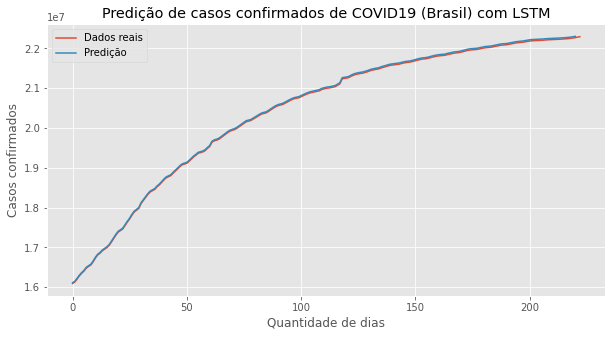

Test Score: 28490.71 RMSE
MAE: 22762.747125473717
Taxa de aprendizagem: 0.1
Dropout: 0.05
Número de células: 200

 LSTM - O segundo melhor - Brasil 



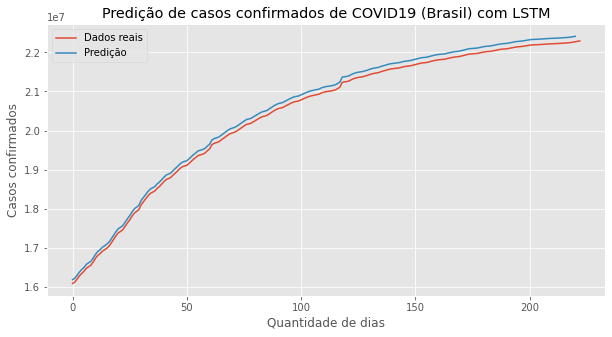

Test Score: 104709.28 RMSE
MAE: 98622.29154124555
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Índia 



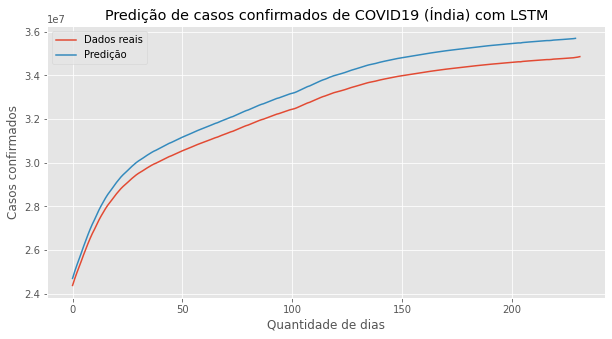

Test Score: 707667.85 RMSE
MAE: 682330.5184921755
Taxa de aprendizagem: 0.01
Dropout: 0.2
Número de células: 300

 LSTM - O segundo melhor - Índia 



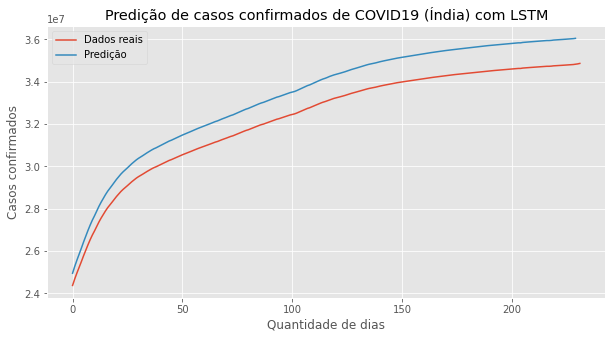

Test Score: 1027322.12 RMSE
MAE: 1005775.6489269577
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Itália 



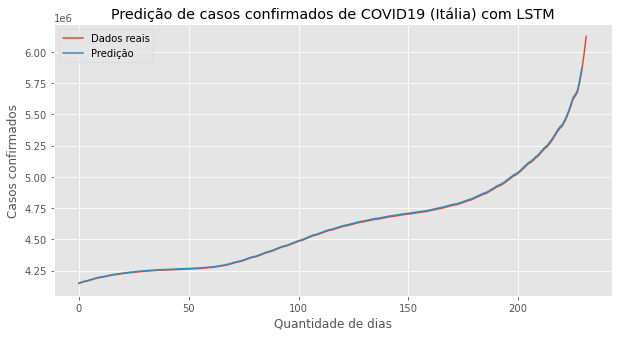

Test Score: 11999.59 RMSE
MAE: 4595.385230117259
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 200

 LSTM - O segundo melhor - Itália 



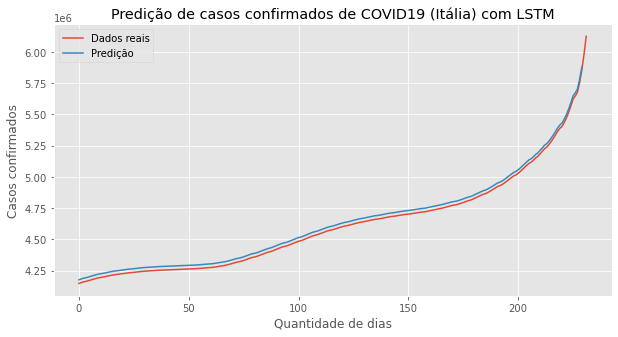

Test Score: 25206.43 RMSE
MAE: 23620.72302689056
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - EUA 



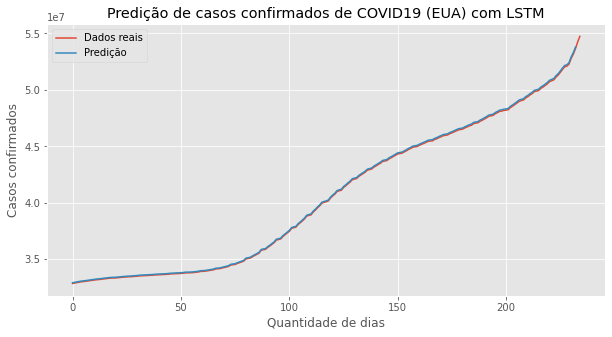

Test Score: 78522.59 RMSE
MAE: 55593.948960055546
Taxa de aprendizagem: 0.05
Dropout: 0.01
Número de células: 200

 LSTM - O segundo melhor - EUA 



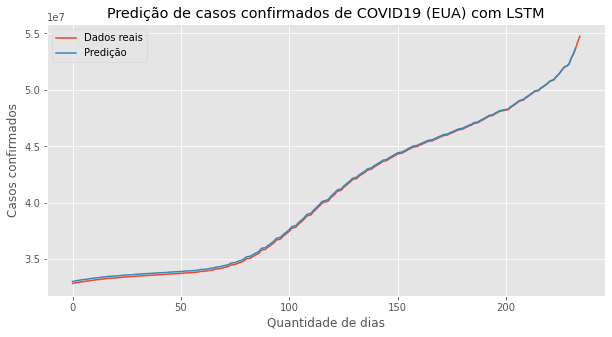

Test Score: 121279.62 RMSE
MAE: 93018.8514738826
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600





In [10]:
#Plotar gráficos com os testes LSTM
for i in range(len(country)): #loop de repatição apra mostrar todos os países
    print('\n LSTM - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com LSTM' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(testP[country[i]], label = 'Dados reais')
    plt.plot(stestPred[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Test Score: %.2f RMSE' % (stss[country[i]]))
    print('MAE:', stsm[country[i]])
    print('Taxa de aprendizagem:', st_a[country[i]])
    print('Dropout:', sdropout[country[i]])
    print('Número de células:', sn_cel[country[i]])

    print('\n LSTM - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com LSTM' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(testP[country[i]], label = 'Dados reais')
    plt.plot(testPred[country[i]], label = 'Predição')
    plt.legend()
    plt.show()
    print('Test Score: %.2f RMSE' % (tss[country[i]]))
    print('MAE:', tsm[country[i]])
    print('Taxa de aprendizagem:', t_a[country[i]])
    print('Dropout:', dropout[country[i]])
    print('Número de células:', n_cel[country[i]])
    print('\n\n')



 LSTM - O melhor caso - Brasil 



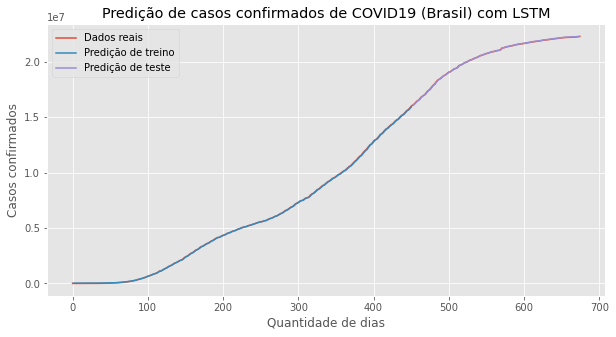

Train Score: 32307.50 RMSE
Test Score: 28490.71 RMSE
MAE: 22762.747125473717
Taxa de aprendizagem: 0.1
Dropout: 0.05
Número de células: 200

 LSTM - O segundo melhor - Brasil 



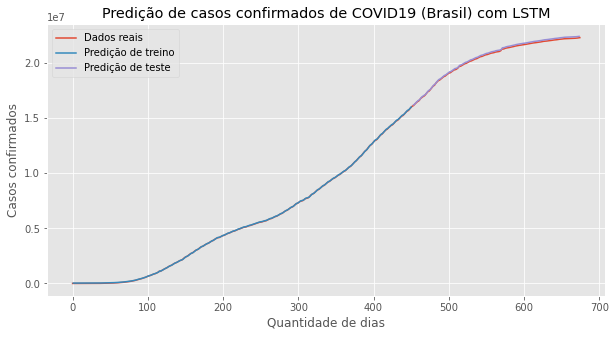

Train Score: 21993.20 RMSE
Test Score: 104709.28 RMSE
MAE: 98622.29154124555
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Índia 



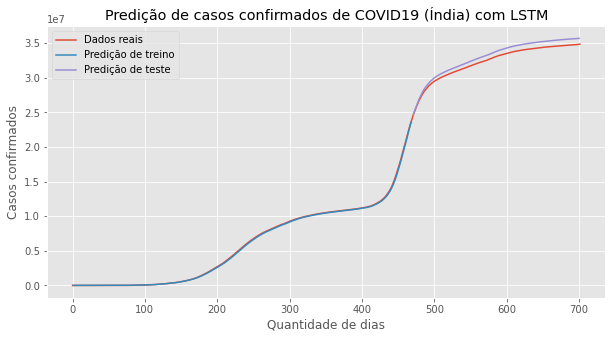

Train Score: 91400.10 RMSE
Test Score: 707667.85 RMSE
MAE: 682330.5184921755
Taxa de aprendizagem: 0.01
Dropout: 0.2
Número de células: 300

 LSTM - O segundo melhor - Índia 



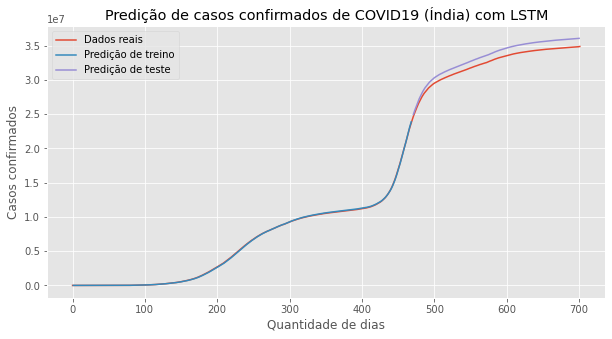

Train Score: 49264.02 RMSE
Test Score: 1027322.12 RMSE
MAE: 1005775.6489269577
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - Itália 



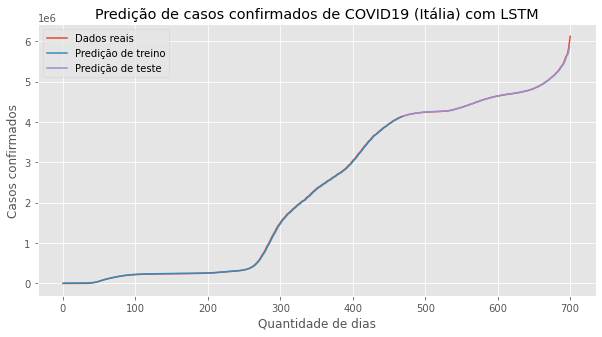

Train Score: 14357.18 RMSE
Test Score: 11999.59 RMSE
MAE: 4595.385230117259
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 200

 LSTM - O segundo melhor - Itália 



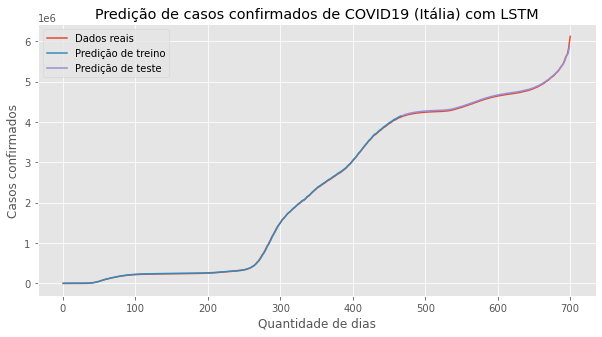

Train Score: 9782.43 RMSE
Test Score: 25206.43 RMSE
MAE: 23620.72302689056
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600




 LSTM - O melhor caso - EUA 



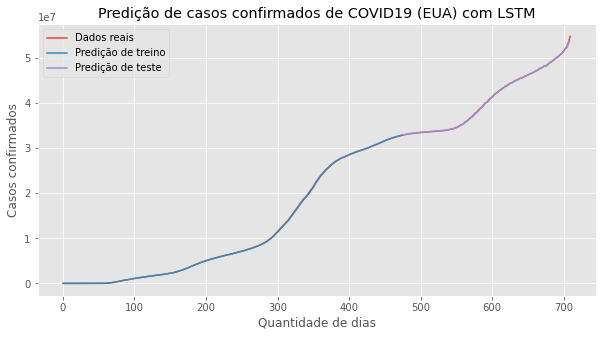

Train Score: 72467.94 RMSE
Test Score: 78522.59 RMSE
MAE: 55593.948960055546
Taxa de aprendizagem: 0.05
Dropout: 0.01
Número de células: 200

 LSTM - O segundo melhor - EUA 



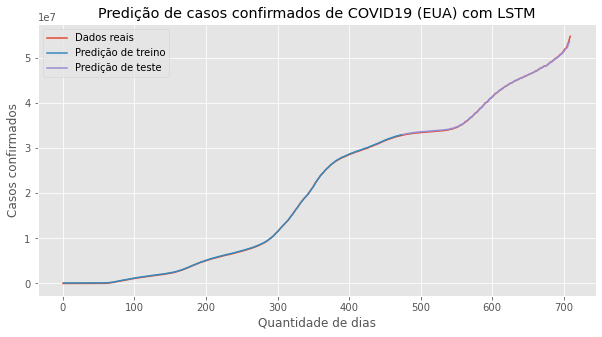

Train Score: 93255.68 RMSE
Test Score: 121279.62 RMSE
MAE: 93018.8514738826
Taxa de aprendizagem: 0.2
Dropout: 0.2
Número de células: 600





In [13]:
#Plotar gráficos com base nas previsões do modelo LSTM
for i in range(len(country)): #loop de repatição apra mostrar todos os países
    
    print('\n LSTM - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com LSTM' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(strpp[country[i]], label = 'Predição de treino')
    plt.plot(stspp[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (strs[country[i]]))
    print('Test Score: %.2f RMSE' % (stss[country[i]]))
    print('MAE:', stsm[country[i]])
    print('Taxa de aprendizagem:', st_a[country[i]])
    print('Dropout:', sdropout[country[i]])
    print('Número de células:', sn_cel[country[i]])

    print('\n LSTM - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com LSTM' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(trpp[country[i]], label = 'Predição de treino')
    plt.plot(tspp[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trs[country[i]]))
    print('Test Score: %.2f RMSE' % (tss[country[i]]))
    print('MAE:', tsm[country[i]])
    print('Taxa de aprendizagem:', t_a[country[i]])
    print('Dropout:', dropout[country[i]])
    print('Número de células:', n_cel[country[i]])
    print('\n\n')
    
    #Armazenando dados de treino e teste da predição
    if country[i] == 'Brasil':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_casos_test_brazil.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_casos_train_brazil.csv',ts,delimiter=',')
    if country[i] == 'Índia':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_casos_test_india.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_casos_train_india.csv',ts,delimiter=',')
    if country[i] == 'Itália':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_casos_test_italia.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_casos_train_italia.csv',ts,delimiter=',')
    if country[i] == 'EUA':
        st = strpp[country[i]]
        ts = stspp[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_lstm_casos_test_eua.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_lstm_casos_train_eua.csv',ts,delimiter=',')


 MLP - O melhor caso - Brasil 



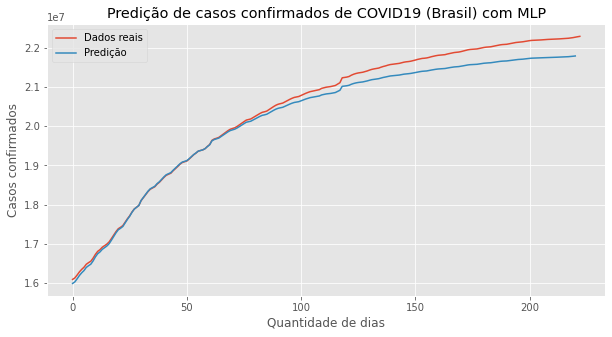

Test Score: 274679.68 RMSE
MAE: 229198.20377207207
Taxa de aprendizagem: 0.05
Dropout: 0.05
Número de células por camada: 8

 MLP - O segundo melhor - Brasil 



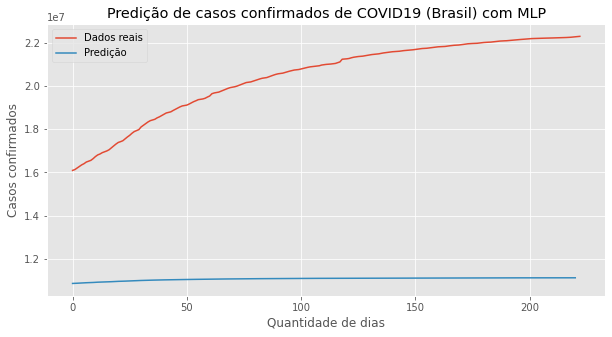

Test Score: 9518827.91 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 9373721.443591075
Número de células por camada: 8




 MLP - O melhor caso - Índia 



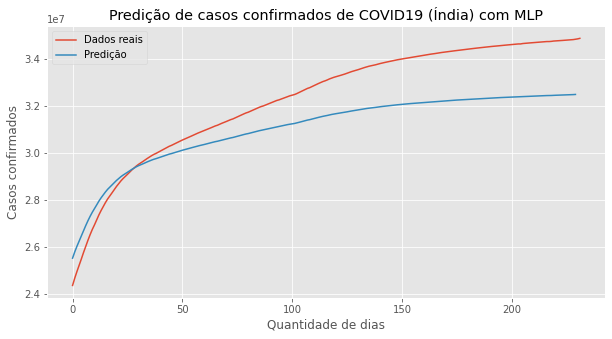

Test Score: 1565684.47 RMSE
MAE: 1372853.5610193014
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 16

 MLP - O segundo melhor - Índia 



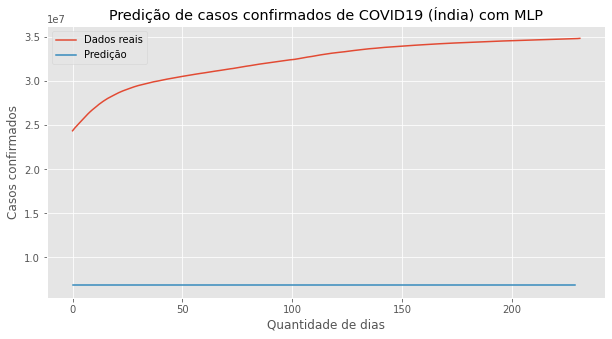

Test Score: 25608182.09 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 25497131.777159996
Número de células por camada: 16




 MLP - O melhor caso - Itália 



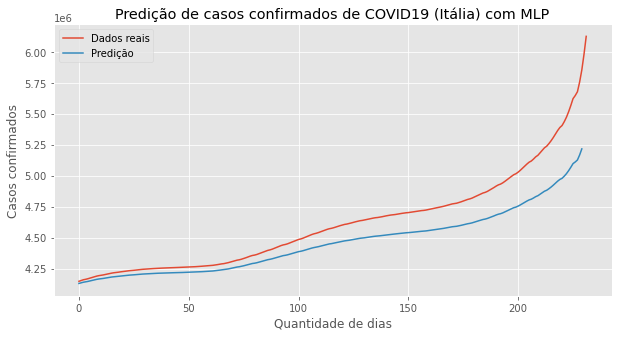

Test Score: 202228.48 RMSE
MAE: 153341.95666543106
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 32

 MLP - O segundo melhor - Itália 



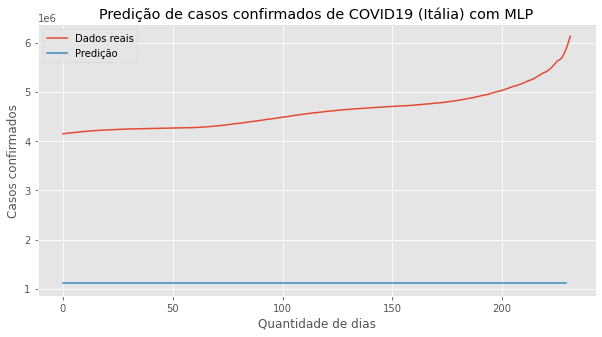

Test Score: 3526035.93 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 3505938.590361083
Número de células por camada: 32




 MLP - O melhor caso - EUA 



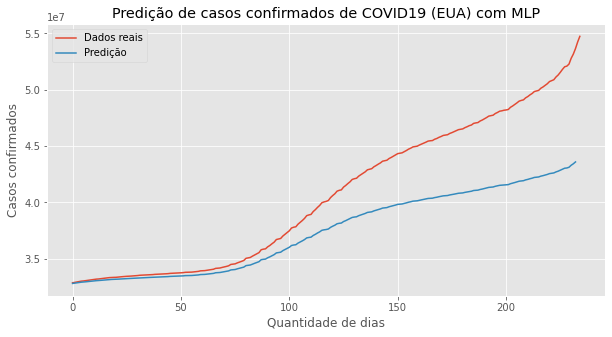

Test Score: 4329253.66 RMSE
MAE: 3219986.9677349217
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 64

 MLP - O segundo melhor - EUA 



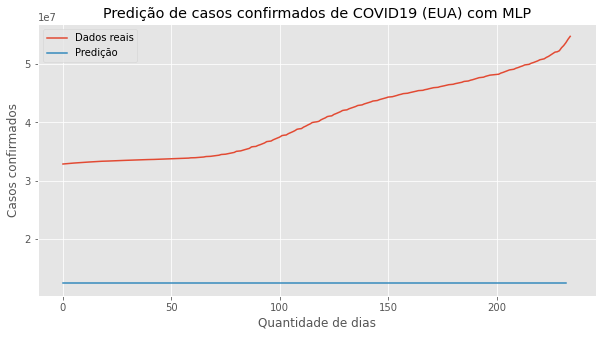

Test Score: 28944656.47 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 28233889.156576123
Número de células por camada: 64





In [14]:
#Plotar gráficos com testes do modelo MLP
for i in range(len(country)):
    print('\n MLP - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com MLP' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.xlabel('Quantidade de dias')
    plt.plot(testP[country[i]], label = 'Dados reais')
    plt.plot(stestPredMLP[country[i]], label = 'Predição')
    plt.legend()
    plt.show()

    print('Test Score: %.2f RMSE' % (stssMLP[country[i]]))
    print('MAE:', stsmMLP[country[i]])
    print('Taxa de aprendizagem:', st_aMLP[country[i]])
    print('Dropout:', sdropoutMLP[country[i]])
    print('Número de células por camada:',sn_neu[country[i]])


    print('\n MLP - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com MLP' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(testP[country[i]], label = 'Dados reais')
    plt.plot(testPredMLP[country[i]], label = 'Predição')
    plt.legend()
    plt.show()

    print('Test Score: %.2f RMSE' % (tssMLP[country[i]]))
    print('Taxa de aprendizagem:', t_aMLP[country[i]])
    print('Dropout:', dropoutMLP[country[i]])
    print('MAE:', tsmMLP[country[i]])
    print('Número de células por camada:',n_neu[country[i]])
 
    print('\n\n')


 MLP - O melhor caso - Brasil 



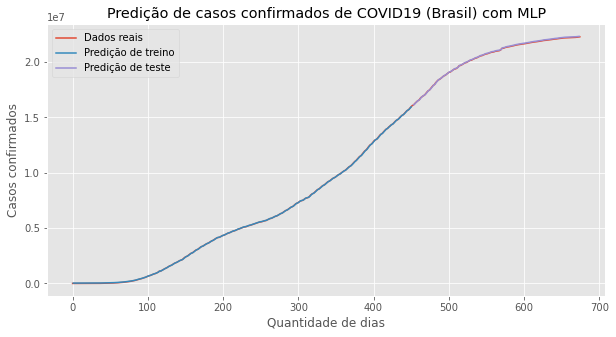

Train Score: 805392.48 RMSE
Test Score: 274679.68 RMSE
MAE: 229198.20377207207
Taxa de aprendizagem: 0.05
Dropout: 0.05
Número de células por camada: 8

 MLP - O segundo melhor - Brasil 



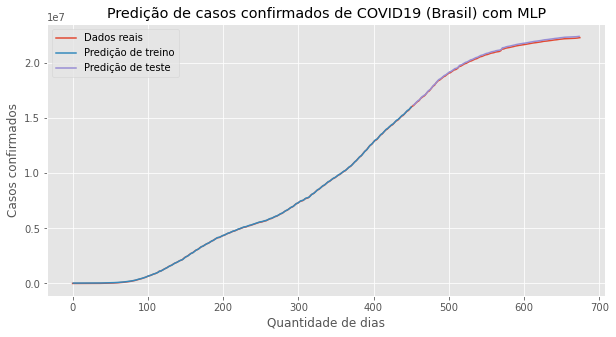

Train Score: 1515737.69 RMSE
Test Score: 9518827.91 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 9373721.443591075
Número de células por camada: 8




 MLP - O melhor caso - Índia 



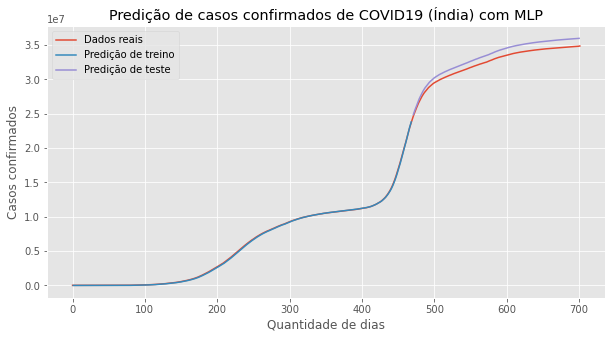

Train Score: 467440.02 RMSE
Test Score: 1565684.47 RMSE
MAE: 1372853.5610193014
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 16

 MLP - O segundo melhor - Índia 



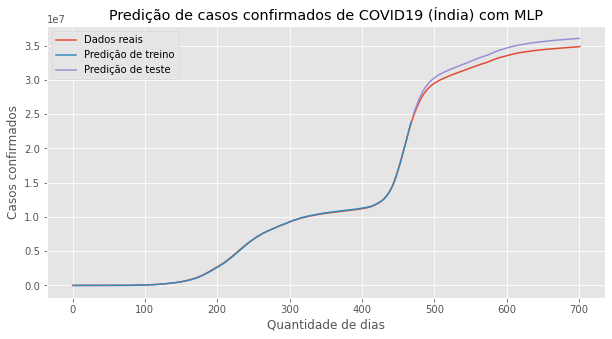

Train Score: 5731673.58 RMSE
Test Score: 25608182.09 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 25497131.777159996
Número de células por camada: 16




 MLP - O melhor caso - Itália 



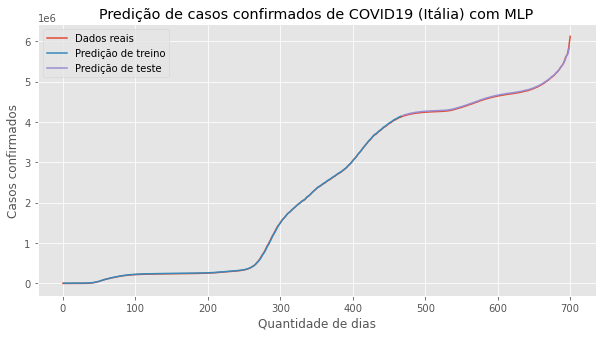

Train Score: 48275.72 RMSE
Test Score: 202228.48 RMSE
MAE: 153341.95666543106
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 32

 MLP - O segundo melhor - Itália 



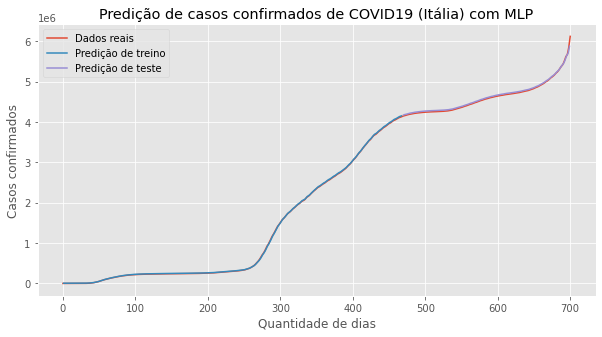

Train Score: 1343478.97 RMSE
Test Score: 3526035.93 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 3505938.590361083
Número de células por camada: 32




 MLP - O melhor caso - EUA 



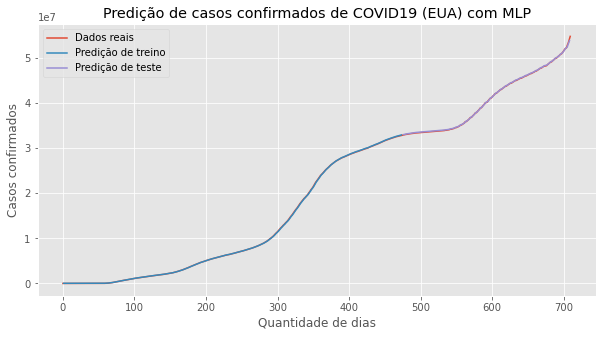

Train Score: 394047.87 RMSE
Test Score: 4329253.66 RMSE
MAE: 3219986.9677349217
Taxa de aprendizagem: 0.01
Dropout: 0.01
Número de células por camada: 64

 MLP - O segundo melhor - EUA 



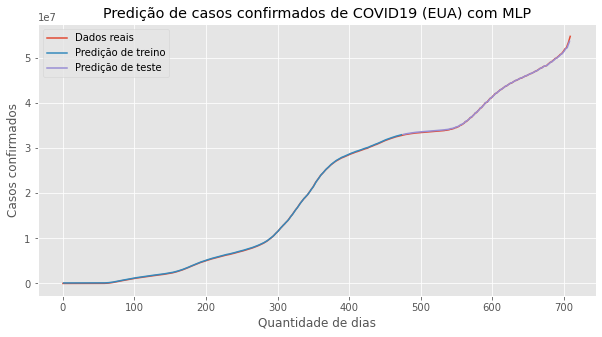

Train Score: 11494009.30 RMSE
Test Score: 28944656.47 RMSE
Taxa de aprendizagem: 0.2
Dropout: 0.2
MAE: 28233889.156576123
Número de células por camada: 64





In [15]:
#Plotar gráficos com base nas previsões do modelo MLP
for i in range(len(country)):
    print('\n MLP - O melhor caso - %s \n' %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com MLP' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(strppMLP[country[i]], label = 'Predição de treino')
    plt.plot(stsppMLP[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (strsMLP[country[i]]))
    print('Test Score: %.2f RMSE' % (stssMLP[country[i]]))
    print('MAE:', stsmMLP[country[i]])
    print('Taxa de aprendizagem:', st_aMLP[country[i]])
    print('Dropout:', sdropoutMLP[country[i]])
    print('Número de células por camada:',sn_neu[country[i]])


    print('\n MLP - O segundo melhor - %s \n' %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com MLP' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(dts[country[i]], label = 'Dados reais')
    plt.plot(trppMLP[country[i]], label = 'Predição de treino')
    plt.plot(tsppMLP[country[i]], label = 'Predição de teste')
    plt.legend()
    plt.show()
    print('Train Score: %.2f RMSE' % (trsMLP[country[i]]))
    print('Test Score: %.2f RMSE' % (tssMLP[country[i]]))
    print('Taxa de aprendizagem:', t_aMLP[country[i]])
    print('Dropout:', dropoutMLP[country[i]])
    print('MAE:', tsmMLP[country[i]])
    print('Número de células por camada:',n_neu[country[i]])
 
    print('\n\n')
        
    if country[i] == 'Brasil':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_brazil.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_casos_train_brazil.csv',ts,delimiter=',')
    if country[i] == 'Índia':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_india.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_casos_train_india.csv',ts,delimiter=',')
    if country[i] == 'Itália':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_italia.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_casos_train_italia.csv',ts,delimiter=',')
    if country[i] == 'EUA':
        st = strppMLP[country[i]]
        ts = stsppMLP[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_eua.csv',st,delimiter=',')
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/train/out_mlp_casos_train_eua.csv',ts,delimiter=',')

# Implementação do modelo Exponential Smoothing

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_

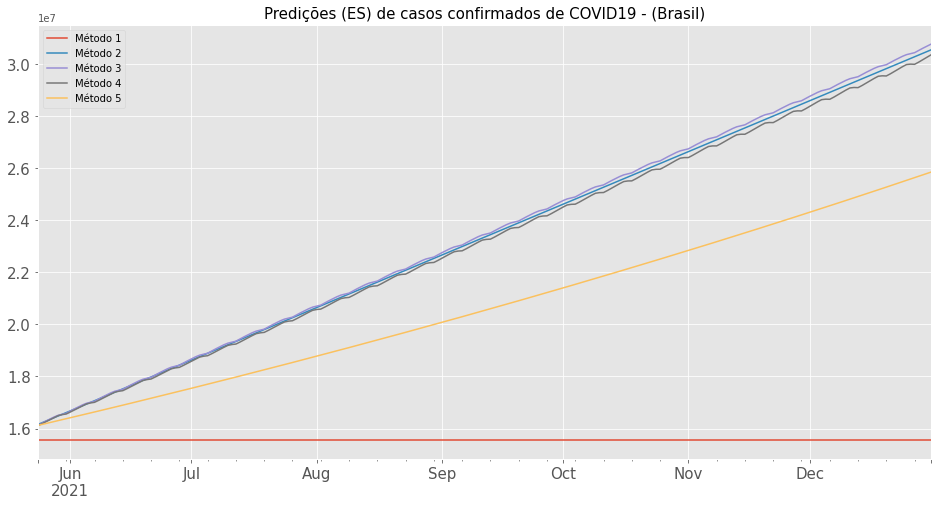

*************Métricas do Algoritmo de Suavização Simples*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 4878498.845
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 5173054.763
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                                            

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_

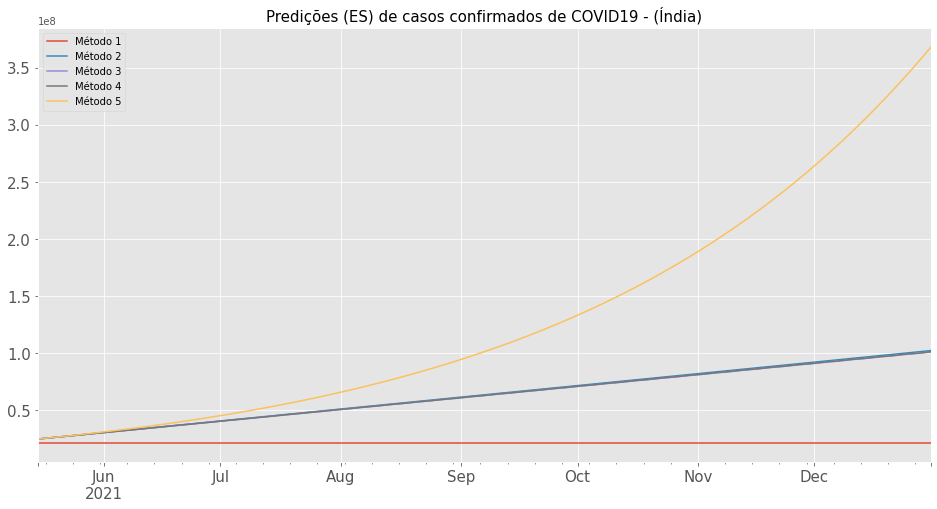

*************Métricas do Algoritmo de Suavização Simples*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 10789126.506
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 11049151.887
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                                          

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_

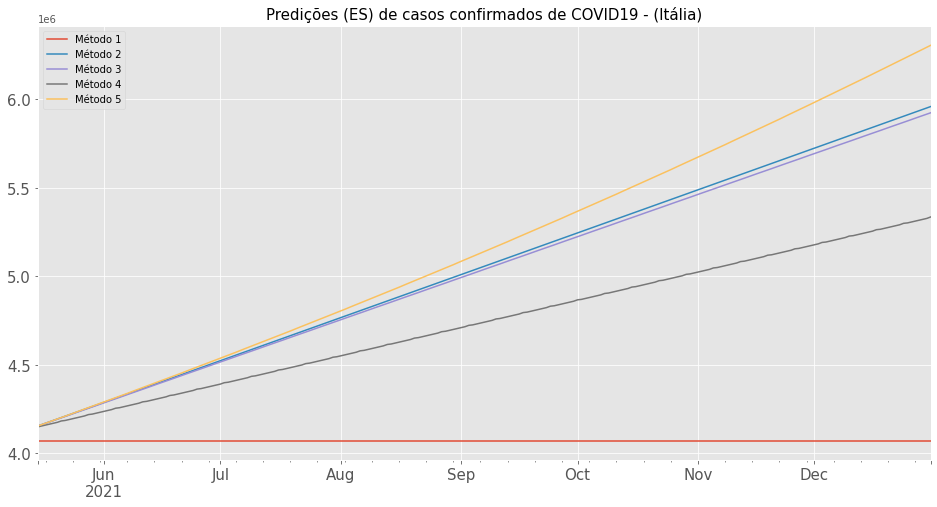

*************Métricas do Algoritmo de Suavização Simples*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 549365.606
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 672576.205
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                                              

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_

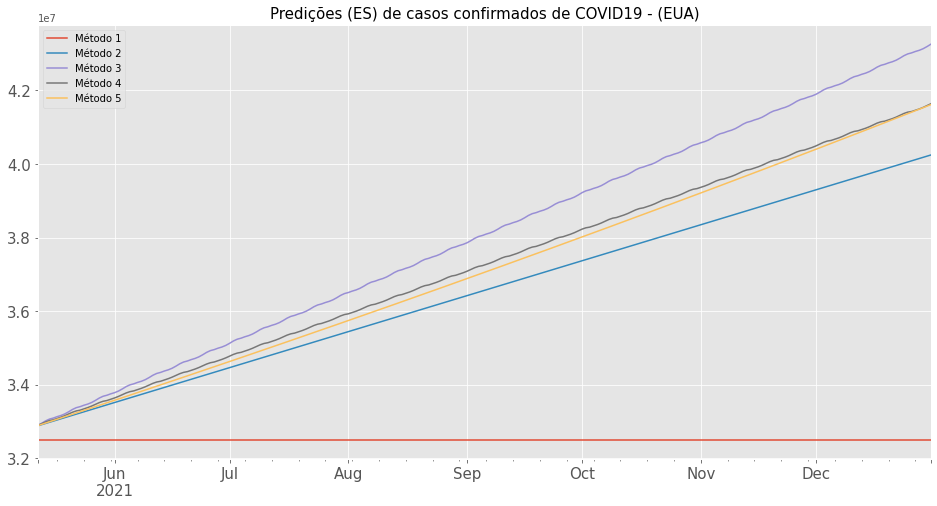

*************Métricas do Algoritmo de Suavização Simples*************
                                                                                                                                                                                                                                                              
Erro médio absoluto do Algoritmo de Suavização Simples : 8163775.06
Raiz do erro médio quadrado do Algoritmo de Suavização Simples : 10389479.592
                                                                                                                                                                                                                                                              
*************Métricas do Algoritmo de Suavização de Holt*************
                                                                                                                                                                                                            

In [16]:
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países
for i in range(len(country)):
    if country[i] == "Brasil":
        dataframe = read_csv("datasets/countries/casos_covid19_brazil_date.csv",encoding='utf-8',index_col='date')

    if country[i] == "Índia":
        dataframe = read_csv("datasets/countries/casos_covid19_india_date.csv",encoding='utf-8',index_col='date')
        
    if country[i] == "Itália":
        dataframe = read_csv("datasets/countries/casos_covid19_italy_date.csv",encoding='utf-8',index_col='date')

    if country[i] == "EUA":
        dataframe = read_csv("datasets/countries/casos_covid19_us_date.csv",encoding='utf-8',index_col='date')
    total = len(dataframe)
    t = int(total*0.33)
    treino=dataframe.iloc[:-t]
    teste=dataframe.iloc[-t:]
    #Implementando modelos
    model1=SimpleExpSmoothing(treino).fit(smoothing_level=0.111,optimized=True)
    modelo1=model1.forecast(len(teste))
    model2=Holt(treino).fit(smoothing_level=0.7187)
    modelo2=model2.forecast(len(teste))
    model3=ExponentialSmoothing(treino,trend='add',seasonal='add').fit()
    modelo3=model3.forecast(len(teste))
    model4=ExponentialSmoothing(treino,trend='add',seasonal='mul').fit()
    modelo4=model4.forecast(len(teste))
    model5=ExponentialSmoothing(treino,trend='mul',seasonal='add').fit()
    modelo5=model5.forecast(len(teste))
    #plt.plot(teste)
    plt.figure(figsize=(16,8))
    modelo1.plot(figsize=(16,8))
    modelo2.plot()
    modelo3.plot()
    modelo4.plot()
    modelo5.plot()
    plt.title("Predições (ES) de casos confirmados de COVID19 - (%s)" %(country[i]), size=15)
    plt.xticks(size=15)
    plt.yticks(size=15)
    lista=['Método 1','Método 2','Método 3','Método 4','Método 5']
    plt.legend(lista)
    plt.show()
    print('*************Métricas do Algoritmo de Suavização Simples*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Simples :',round(mean_absolute_error(teste,modelo1),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Simples :',round(mean_squared_error(teste,modelo1)**0.5,3))


    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt:',round(mean_absolute_error(teste,modelo2),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização',round(mean_squared_error(teste,modelo2)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt-Winters aditivo*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt-Winters aditivo :', round(mean_absolute_error(teste,modelo3),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Holt-Winters aditivo :',round(mean_squared_error(teste,modelo3)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Holt-Winters multiplicativo*************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Holt-Winters multiplicativo :',round(mean_absolute_error(teste,modelo4),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Holt-Winters multiplicativo :',round(mean_squared_error(teste,modelo4)**0.5,3))

    print(' '*254)
    print('*************Métricas do Algoritmo de Suavização de Pegels aditivo *************')
    print(' '*254)
    print('Erro médio absoluto do Algoritmo de Suavização Pegels aditivo :',round(mean_absolute_error(teste,modelo5),3))
    print('Raiz do erro médio quadrado do Algoritmo de Suavização Pegels aditivo :',round(mean_squared_error(teste,modelo5)**0.5,3))

    print(' '*254)

# Modelo ARIMA

In [18]:
#Dicionários
p = [1,2,3,4,5]
d = [1,2,3,4,5]
q = [1,1,3,1,5]
sp = {}
sd = {}
sq = {}
sps = {}
sds = {}
sqs = {}
pred = {}
preds = {}
out = {}
rmses = {}
maes = {}
maess = {}
rmsess = {'Brasil':(9**15), 'Índia':(9**15), 'EUA':(9**15),'Itália':(9**15)} #Dicionário de scores de testes
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)
country = ['Brasil', 'Índia', 'Itália', 'EUA'] #Lista de países
# load dataset
for i in range(len(country)):
    for z in range(len(p)):
        if country[i] == 'Brasil':
            series = read_csv('datasets/countries/casos_covid19_brazil.csv', usecols=[1], engine='python')
        if country[i] == 'Índia':
            series = read_csv('datasets/countries/casos_covid19_india.csv', usecols=[1], engine='python')
        if country[i] == 'Itália':
            series = read_csv('datasets/countries/casos_covid19_italy.csv', usecols=[1], engine='python')
        if country[i] == 'EUA':
            series = read_csv('datasets/countries/casos_covid19_us.csv', usecols=[1], engine='python')
        # split into train and test sets
        X = series.values
        size = int(len(X) * 0.66)
        train, test = X[0:size], X[size:len(X)]
        history = [x for x in train]
        predictions = list()
        # walk-forward validation
        for t in range(len(test)):
            model = ARIMA(history, order=(p[z],d[z],q[z]))
            model_fit = model.fit()
            output = model_fit.forecast()
            yhat = output[0]
            predictions.append(yhat)
            obs = test[t]
            history.append(obs)
            #print('predicted=%f, expected=%f' % (yhat, obs))
            # evaluate forecasts
        mae = mean_absolute_error(test, predictions)
        rmse = math.sqrt(mean_squared_error(test, predictions))
        maes[country[i]] = mae
        rmses[country[i]] = rmse
        pred[country[i]] = predictions
        out[country[i]] = test
        sp[country[i]] = p[z]
        sd[country[i]] = d[z]
        sq[country[i]] = q[z]
        if rmses[country[i]] < rmsess[country[i]]:
            sps[country[i]] = p[z]
            sds[country[i]] = d[z]
            sqs[country[i]] = q[z]
            maess[country[i]] = mae
            rmsess[country[i]] = rmse
            preds[country[i]] = predictions

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\ProgramData\Anaconda3\lib\s


ARIMA - O melhor caso - Brasil



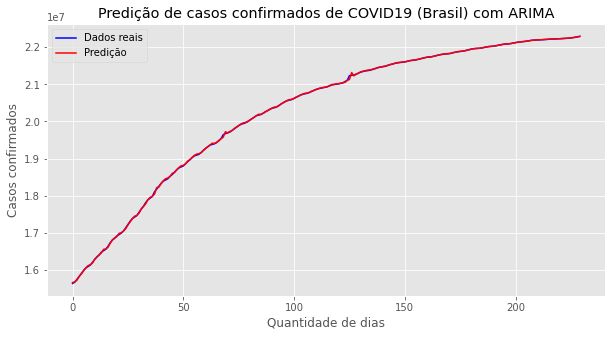

Test RMSE: 14968.107


Test MAE: 8483.138


p: 2 d: 2 q: 1

ARIMA - O segundo melhor caso - Brasil



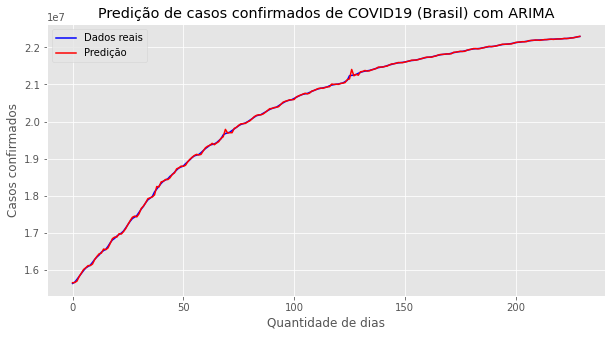

Test RMSE: 22643.261


Test MAE: 13425.291


p: 5 d: 5 q: 5

ARIMA - O melhor caso - Índia



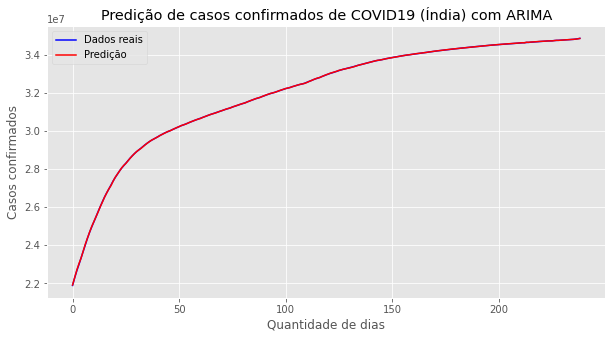

Test RMSE: 7316.758


Test MAE: 4443.455


p: 3 d: 3 q: 3

ARIMA - O segundo melhor caso - Índia



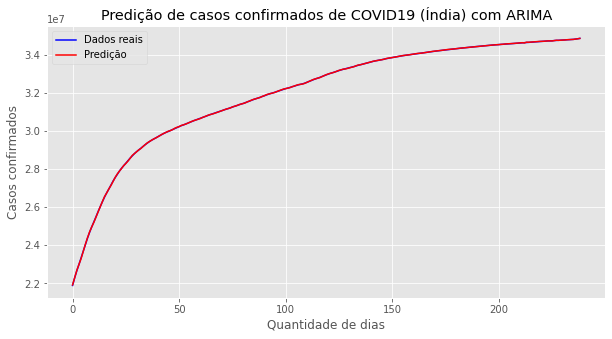

Test RMSE: 7829.387


Test MAE: 5113.515


p: 5 d: 5 q: 5

ARIMA - O melhor caso - Itália



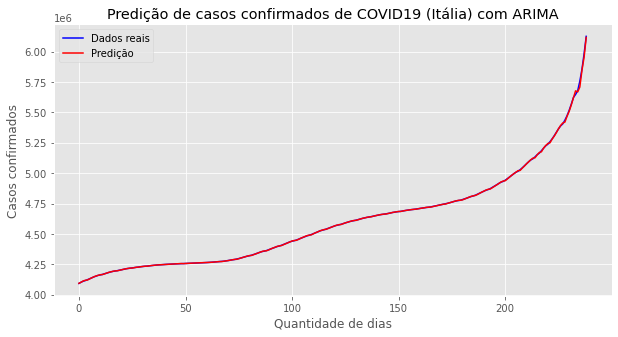

Test RMSE: 4680.964


Test MAE: 1678.547


p: 1 d: 1 q: 1

ARIMA - O segundo melhor caso - Itália



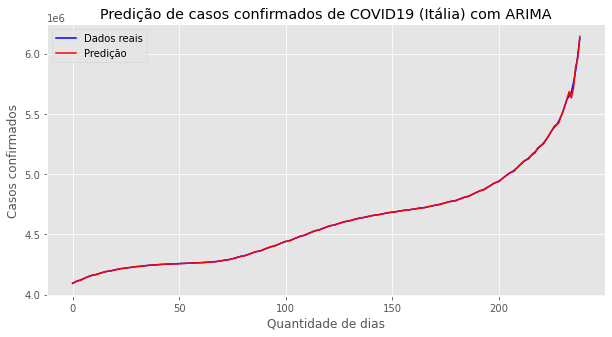

Test RMSE: 6095.659


Test MAE: 2077.458


p: 5 d: 5 q: 5

ARIMA - O melhor caso - EUA



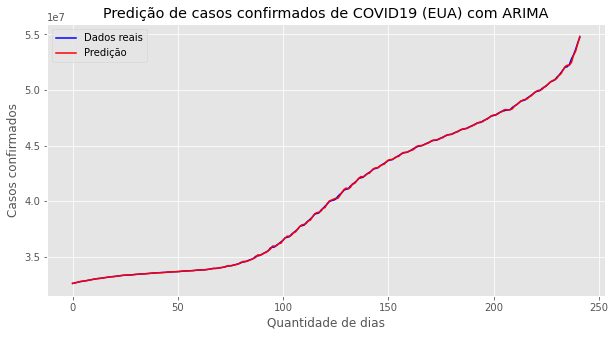

Test RMSE: 51902.152


Test MAE: 34598.529


p: 3 d: 3 q: 3

ARIMA - O segundo melhor caso - EUA



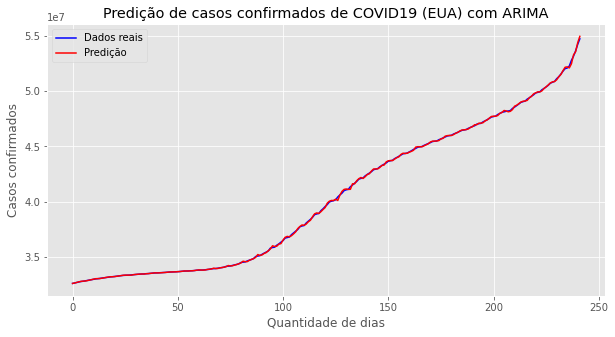

Test RMSE: 63456.579


Test MAE: 41190.244


p: 5 d: 5 q: 5


In [21]:
for i in range(len(country)):
    print("\nARIMA - O melhor caso - %s\n" %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com ARIMA' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(out[country[i]], label = 'Dados reais', color = 'blue')
    plt.plot(preds[country[i]], label = 'Predição', color='red')
    plt.legend()
    plt.show()
    print('Test RMSE: %.3f\n\n' % rmsess[country[i]])
    print('Test MAE: %.3f\n\n' % maess[country[i]])
    print("p:", sps[country[i]],"d:",sds[country[i]],"q:",sqs[country[i]])
    
    print("\nARIMA - O segundo melhor caso - %s\n" %(country[i]))
    plt.figure(figsize=(10,5))
    plt.title('Predição de casos confirmados de COVID19 (%s) com ARIMA' %(country[i]))
    plt.ylabel('Casos confirmados')
    plt.xlabel('Quantidade de dias')
    plt.plot(out[country[i]], label = 'Dados reais',color='blue')
    plt.plot(pred[country[i]], label = 'Predição', color='red')
    plt.legend()
    plt.show()
    print('Test RMSE: %.3f\n\n' % rmses[country[i]])
    print('Test MAE: %.3f\n\n' % maes[country[i]])
    print("p:", sp[country[i]],"d:",sd[country[i]],"q:",sq[country[i]])


    #Armazenando predições
    if country[i] == 'Brasil':
        st = preds[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_arima_casos_test_brazil.csv',st,delimiter=',')
        
    if country[i] == 'Índia':
        st = preds[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_arima_casos_test_india.csv',st,delimiter=',')
            
    if country[i] == 'Itália':
        st = preds[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_arima_casos_test_italia.csv',st,delimiter=',')
           
    if country[i] == 'EUA':
        st = preds[country[i]]
        numpy.savetxt('C:/Users/Saulo Joel/GitHub/COVID-19-time-series-predictions/outputs/test/out_mlp_casos_test_eua.csv',st,delimiter=',')
            